# KLASIFIKASI DAN PREDIKSI BANJIR 

Dalam proyek ini, akan dibagi menjadi 4 tahap:
1. Persiapan Data
2. Model Klasifikasi Banjir
3. Model Prediksi Banjir
4. Simulasi Klasifikasi dan Prediksi Banjir

---

# 1. PERSIAPAN DATA

In [1]:
# import libraries
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

from sklearn.metrics import mean_absolute_error

from scipy.signal import savgol_filter

In [2]:
# setting
# display max columns
pd.set_option('display.max_columns', None)

## - DATA UNDERSTANDING

Data banjir berasal dari PATRIOT-Net: https://patriotnet.id/

Data cuaca berasal dari Visual Crossing: https://www.visualcrossing.com/

Lokasi acuan: Batu Gadang, Padang. Long,lat: -0.957210, 100.478977

Rentang data: 03/06/2022 - 12/11/2022 

In [3]:
# read data
b401_raw = pd.read_csv('dataset/dataset_raw/sensor_B-401.csv') # data banjir awal yang masih kotor
b401_cleaned = pd.read_csv('dataset/dataset_raw/sensor_B-401_cleaned.csv') # data banjir setelah menghilangkan anomali
data_cuaca = pd.read_csv('dataset/dataset_raw/data_cuaca.csv') # data cuaca 

### Data Banjir (raw)

Data ini merupakan data asli yang diambil dari PATRIOT-Net

In [4]:
b401_raw

,Date,Day,Battery,Height
0,03/06/2022 00:02,03/06/2022,12.42,18.13
1,03/06/2022 00:12,03/06/2022,12.42,6.00
2,03/06/2022 00:23,03/06/2022,12.42,24.20
3,03/06/2022 00:26,03/06/2022,12.42,198.18
4,03/06/2022 00:33,03/06/2022,12.42,-339.94
...,...,...,...,...
19517,12/11/2022 23:34,12/11/2022,11.27,117.26
19518,12/11/2022 23:41,12/11/2022,11.24,-400.63
19519,12/11/2022 23:45,12/11/2022,11.24,-248.90
19520,12/11/2022 23:48,12/11/2022,11.24,99.05


In [5]:
b401_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19522 entries, 0 to 19521
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Date     19522 non-null  object 
 1   Day      19522 non-null  object 
 2   Battery  19522 non-null  float64
 3   Height   19522 non-null  float64
dtypes: float64(2), object(2)
memory usage: 610.2+ KB


In [6]:
b401_raw.describe().T

,count,mean,std,min,25%,50%,75%,max
Battery,19522.0,11.664755,0.398244,10.81,11.41,11.61,11.86,13.10
Height,19522.0,13.539526,145.665317,-402.65,30.27,48.48,80.85,451.06


Pada kolom 'Height' terdapat anomali yaitu nilai minus dan nilai max yang sangat tinggi, anomali ini akan dihilangkan.

Text(0, 0.5, 'Height (cm)')

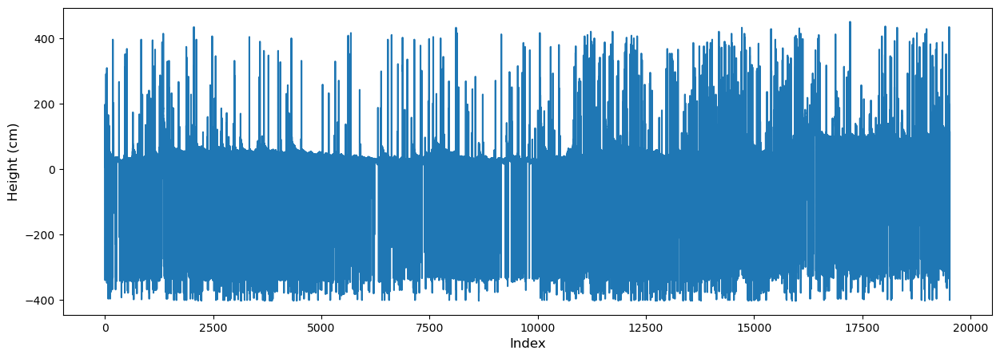

In [7]:
# bentuk data
plt.figure(figsize=(15, 5))
plt.plot(b401_raw['Height'], '-')
plt.xlabel('Index', fontsize= 12)
plt.ylabel('Height (cm)', fontsize= 12)

Text(0, 0.5, 'Height (cm)')

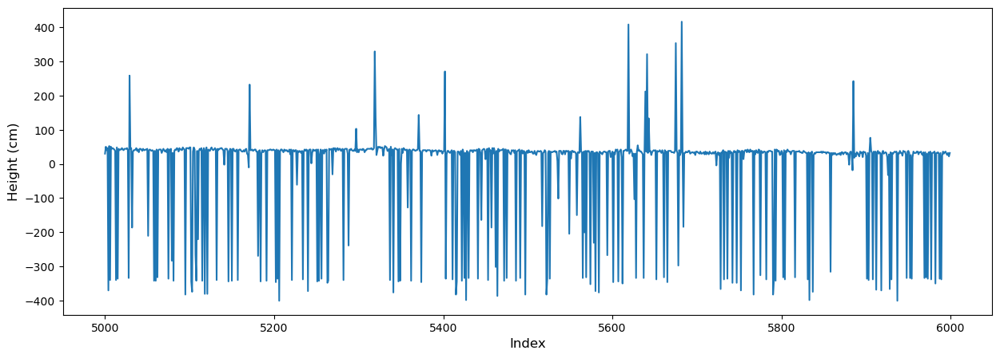

In [8]:
# bentuk data (sample)
plt.figure(figsize=(15, 5))
plt.plot(b401_raw['Height'][5000:6000], '-')
plt.xlabel('Index', fontsize= 12)
plt.ylabel('Height (cm)', fontsize= 12)

### Data Banjir (cleaned)

Data ini telah melewati pembersihan anomali

In [9]:
b401_cleaned

,Date,Day,Battery,Height
0,03/06/2022 00:02,03/06/2022,12.42,24.20
1,03/06/2022 00:12,03/06/2022,12.42,NaN
2,03/06/2022 00:23,03/06/2022,12.42,24.20
3,03/06/2022 00:26,03/06/2022,12.42,NaN
4,03/06/2022 00:33,03/06/2022,12.42,NaN
...,...,...,...,...
19517,12/11/2022 23:34,12/11/2022,11.27,117.26
19518,12/11/2022 23:41,12/11/2022,11.24,NaN
19519,12/11/2022 23:45,12/11/2022,11.24,NaN
19520,12/11/2022 23:48,12/11/2022,11.24,NaN


In [10]:
b401_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19522 entries, 0 to 19521
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Date     19522 non-null  object 
 1   Day      19522 non-null  object 
 2   Battery  19522 non-null  float64
 3   Height   14200 non-null  float64
dtypes: float64(2), object(2)
memory usage: 610.2+ KB


In [11]:
b401_cleaned.describe().T

,count,mean,std,min,25%,50%,75%,max
Battery,19522.0,11.664755,0.398244,10.81,11.41,11.61,11.86,13.10
Height,14200.0,65.333808,34.203176,18.13,38.36,54.55,88.94,250.78


Text(0, 0.5, 'Height (cm)')

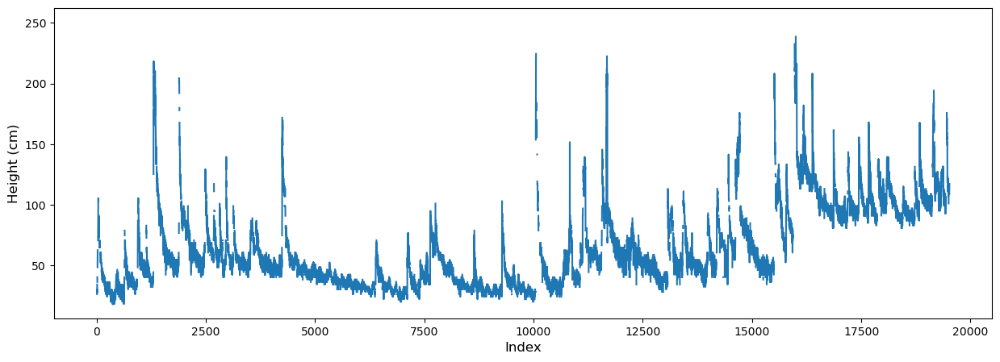

In [12]:
# bentuk data
plt.figure(figsize=(15, 5))
plt.plot(b401_cleaned['Height'], '-')
plt.xlabel('Index', fontsize= 12)
plt.ylabel('Height (cm)', fontsize= 12)

Text(0, 0.5, 'Height (cm)')

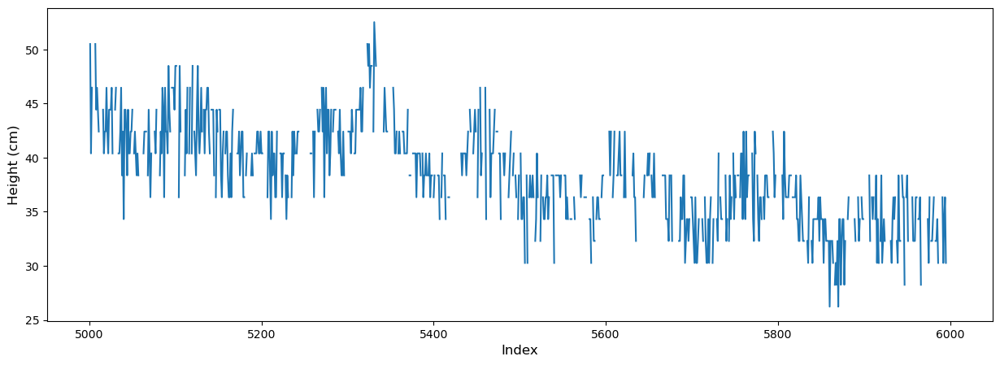

In [13]:
# bentuk sebaran data
plt.figure(figsize=(15, 5))
plt.plot(b401_cleaned['Height'][5000:6000], '-')
plt.xlabel('Index', fontsize= 12)
plt.ylabel('Height (cm)', fontsize= 12)

In [14]:
# missing data
print('Total jumlah data:', len(b401_cleaned))
print('Jumlah missing data:', b401_cleaned.Height.isnull().sum())
print('Persentase jumlah missing data:', (b401_cleaned.Height.isnull().sum()*100/len(b401_cleaned)).round(2), '%')

Total jumlah data: 19522
Jumlah missing data: 5322
Persentase jumlah missing data: 27.26 %


Terlihat anomali pada data telah dihilangkan sehingga terdapat beberapa missing value, missing value akan diisi dengan metode data imputation (interpolasi dan regresi)

**Note:**
- Kolom yang tidak digunakan akan dibuang
- Ubah date time sesuai format
- Terdapat missing value akibat penghapusan anomali (akan ditangani dengan interpolasi)
- Terdapat missing value akibat timeskip karena sensor tidak aktif 

  (akan ditangani dengan model machine learning menggunakan gabungan data banjir dan cuaca, variabel yang berasal dari data cuaca digunakan untuk memprediksi variabel 'height')

- Interval waktu pada data banjir tidak sama 
  
  (akan di-resample agar interval sama, karena prediksi menggunakan timeseries membutuhkan data dengan interval yang sama)

### Data Cuaca

In [15]:
data_cuaca

,name,datetime,temp,feelslike,dew,humidity,precip,precipprob,preciptype,snow,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,conditions,icon,stations
0,"-0.957210, 100.478977",2022-06-03T00:00:00,18.7,18.7,17.6,93.32,0.0,0,NaN,0,0,3.6,4.7,68.5,1014,100.0,24.1,0,NaN,0,10,Overcast,cloudy,remote
1,"-0.957210, 100.478977",2022-06-03T01:00:00,18.8,18.8,17.5,92.16,0.0,0,NaN,0,0,4.0,5.4,73.8,1013,100.0,24.1,0,NaN,0,10,Overcast,cloudy,remote
2,"-0.957210, 100.478977",2022-06-03T02:00:00,18.9,18.9,17.4,91.01,0.0,0,NaN,0,0,4.0,5.4,73.9,1012,100.0,24.1,0,NaN,0,10,Overcast,cloudy,remote
3,"-0.957210, 100.478977",2022-06-03T03:00:00,19.1,19.1,17.4,89.88,0.0,0,NaN,0,0,4.3,6.1,80.2,1012,100.0,24.1,0,NaN,0,10,Overcast,cloudy,remote
4,"-0.957210, 100.478977",2022-06-03T04:00:00,19.4,19.4,17.3,87.66,0.0,0,NaN,0,0,4.0,5.0,76.7,1011,98.9,24.1,0,NaN,0,10,Overcast,cloudy,remote
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3907,"-0.957210, 100.478977",2022-11-12T19:00:00,20.6,20.6,20.5,99.39,0.0,0,NaN,0,0,1.4,1.4,115.4,1010,100.0,1.9,0,NaN,0,10,Overcast,cloudy,remote
3908,"-0.957210, 100.478977",2022-11-12T20:00:00,20.6,20.6,20.4,98.77,0.0,0,rain,0,0,1.1,1.4,92.5,1011,100.0,1.3,0,NaN,0,10,Overcast,cloudy,remote
3909,"-0.957210, 100.478977",2022-11-12T21:00:00,20.5,20.5,20.2,98.16,0.1,100,rain,0,0,1.1,1.4,83.5,1012,100.0,1.7,0,NaN,0,10,"Rain, Overcast",rain,remote
3910,"-0.957210, 100.478977",2022-11-12T22:00:00,20.4,20.4,20.1,98.16,0.1,100,rain,0,0,1.8,1.8,96.7,1012,100.0,1.7,0,NaN,0,10,"Rain, Overcast",rain,remote


In [16]:
data_cuaca.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3912 entries, 0 to 3911
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              3912 non-null   object 
 1   datetime          3912 non-null   object 
 2   temp              3912 non-null   float64
 3   feelslike         3912 non-null   float64
 4   dew               3912 non-null   float64
 5   humidity          3912 non-null   float64
 6   precip            3912 non-null   float64
 7   precipprob        3912 non-null   int64  
 8   preciptype        1929 non-null   object 
 9   snow              3912 non-null   int64  
 10  snowdepth         3912 non-null   int64  
 11  windgust          3912 non-null   float64
 12  windspeed         3912 non-null   float64
 13  winddir           3912 non-null   float64
 14  sealevelpressure  3912 non-null   int64  
 15  cloudcover        3912 non-null   float64
 16  visibility        3912 non-null   float64


In [17]:
data_cuaca.describe().T

,count,mean,std,min,25%,50%,75%,max
temp,3912.0,21.656570,2.629999,17.50,19.6000,20.50,23.70,29.8
feelslike,3912.0,21.714545,2.768646,17.50,19.6000,20.50,23.70,31.0
dew,3912.0,19.306186,1.374440,13.90,18.5000,19.30,20.20,23.2
humidity,3912.0,87.563298,12.125224,45.86,81.6025,92.82,96.41,100.0
precip,3912.0,0.403655,1.427023,0.00,0.0000,0.00,0.30,33.6
precipprob,3912.0,43.507157,49.582975,0.00,0.0000,0.00,100.00,100.0
snow,3912.0,0.000000,0.000000,0.00,0.0000,0.00,0.00,0.0
snowdepth,3912.0,0.000000,0.000000,0.00,0.0000,0.00,0.00,0.0
windgust,3912.0,4.759509,2.367873,0.40,3.2000,4.30,6.10,26.3
windspeed,3912.0,4.374872,1.997276,0.00,2.9000,4.30,5.80,11.5


Tidak ada yang aneh seperti anomali pada data cuaca

**Note:**
- Kolom yang tidak diperlukan akan dibuang
- Ubah date time sesuai format
- Terdapat missing value pada `preciptype` dan `solarenergy`
- Cek kolom kategorikal

## - DATA CLEANING

### Data Banjir

In [18]:
b401 = b401_cleaned.copy()
b401.head()

,Date,Day,Battery,Height
0,03/06/2022 00:02,03/06/2022,12.42,24.2
1,03/06/2022 00:12,03/06/2022,12.42,NaN
2,03/06/2022 00:23,03/06/2022,12.42,24.2
3,03/06/2022 00:26,03/06/2022,12.42,NaN
4,03/06/2022 00:33,03/06/2022,12.42,NaN


In [19]:
# membuang kolom yang tidak perlu
b401 = b401.drop(columns = ['Day', 'Battery'])

# mengganti nama kolom
b401.columns = ['date', 'height']

# menyesuaikan format date
b401['date'] = b401['date'] + ':00'
b401['date'] = pd.to_datetime(b401['date'], format='%d/%m/%Y %H:%M:%S')

# mengisi missing value dari anomali dengan interpolasi
print('(Sebelum interpolasi) --- Jumlah missing value: ', b401.height.isnull().sum())
b401['height'] = b401['height'].fillna(b401['height'].interpolate()).round(2)
print('(Setelah interpolasi) --- Jumlah missing value: ', b401.height.isnull().sum())

(Sebelum interpolasi) --- Jumlah missing value:  5322
(Setelah interpolasi) --- Jumlah missing value:  0


Text(0, 0.5, 'Height (cm)')

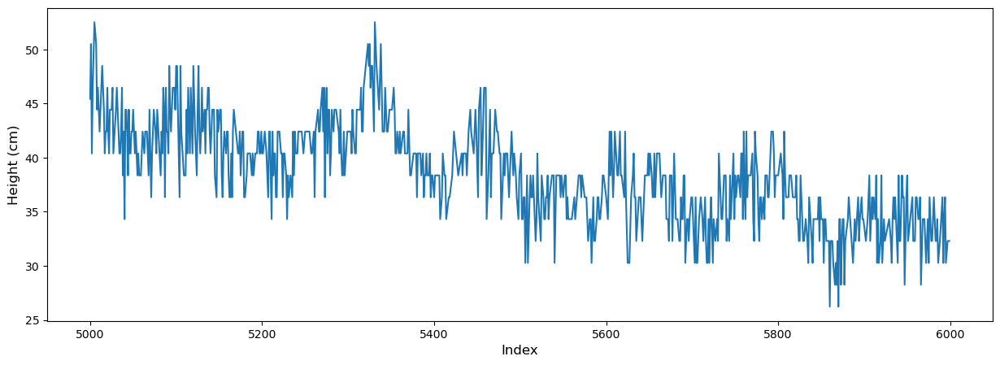

In [20]:
# bentuk sebaran sample data
plt.figure(figsize=(15, 5))
plt.plot(b401['height'][5000:6000], '-')
plt.xlabel('Index', fontsize= 12)
plt.ylabel('Height (cm)', fontsize= 12)

In [21]:
# resample 10 menit
print('\n(Sebelum resample) --- Jumlah baris: ', len(b401))
b401 = b401.set_index('date')
b401 = b401.resample('10min').mean().round(2)
print('(Setelah resample) --- Jumlah baris: ', len(b401))
print('(Setelah resample) --- Jumlah missing value: ', b401.height.isnull().sum())
print('(Setelah resample) --- Persentase jumlah missing value:', (b401.height.isnull().sum()*100/len(b401)).round(2), '%')

# reset index
b401 = b401.reset_index()


(Sebelum resample) --- Jumlah baris:  19522
(Setelah resample) --- Jumlah baris:  23472
(Setelah resample) --- Jumlah missing value:  8376
(Setelah resample) --- Persentase jumlah missing value: 35.69 %


Text(0, 0.5, 'Height (cm)')

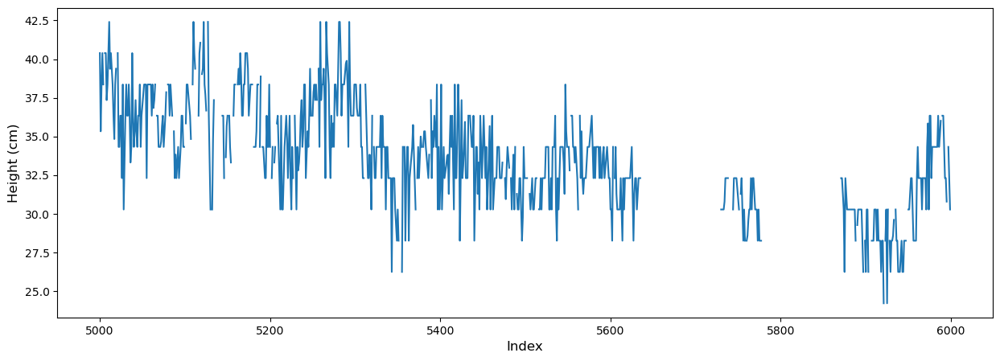

In [22]:
# bentuk data setelah resample
plt.figure(figsize=(15, 5))
plt.plot(b401['height'][5000:6000], '-')
plt.xlabel('Index', fontsize= 12)
plt.ylabel('Height (cm)', fontsize= 12)

In [23]:
# missing data
print('Total jumlah data:', len(b401))
print('Jumlah missing data:', b401.height.isnull().sum())
print('Persentase jumlah missing data:', (b401.height.isnull().sum() * 100 / len(b401)).round(2), '%')

Total jumlah data: 23472
Jumlah missing data: 8376
Persentase jumlah missing data: 35.69 %


Terlihat ada missing value setelah datetime di-resample karena adanya timeskip pada data akibat sensor tidak aktif dalam kurun waktu tertentu

### Data Cuaca

In [24]:
cuaca = data_cuaca.copy()
cuaca.head()

,name,datetime,temp,feelslike,dew,humidity,precip,precipprob,preciptype,snow,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,conditions,icon,stations
0,"-0.957210, 100.478977",2022-06-03T00:00:00,18.7,18.7,17.6,93.32,0.0,0,NaN,0,0,3.6,4.7,68.5,1014,100.0,24.1,0,NaN,0,10,Overcast,cloudy,remote
1,"-0.957210, 100.478977",2022-06-03T01:00:00,18.8,18.8,17.5,92.16,0.0,0,NaN,0,0,4.0,5.4,73.8,1013,100.0,24.1,0,NaN,0,10,Overcast,cloudy,remote
2,"-0.957210, 100.478977",2022-06-03T02:00:00,18.9,18.9,17.4,91.01,0.0,0,NaN,0,0,4.0,5.4,73.9,1012,100.0,24.1,0,NaN,0,10,Overcast,cloudy,remote
3,"-0.957210, 100.478977",2022-06-03T03:00:00,19.1,19.1,17.4,89.88,0.0,0,NaN,0,0,4.3,6.1,80.2,1012,100.0,24.1,0,NaN,0,10,Overcast,cloudy,remote
4,"-0.957210, 100.478977",2022-06-03T04:00:00,19.4,19.4,17.3,87.66,0.0,0,NaN,0,0,4.0,5.0,76.7,1011,98.9,24.1,0,NaN,0,10,Overcast,cloudy,remote


In [25]:
# membuang kolom yang tidak perlu
cuaca = cuaca.drop(columns = ['name', 'snow', 'snowdepth', 'stations'])

# menyesuaikan format date
cuaca['datetime'] = cuaca['datetime'].replace('T',' ')
cuaca['datetime'] = pd.to_datetime(cuaca['datetime'], format='%Y-%m-%d %H:%M:%S')

# membuang fitur dengan missing value
cuaca = cuaca.drop(columns = ['solarenergy', 'preciptype'])

# cek semua nilai unik pada kolom kategorikal
for col in cuaca.select_dtypes(include='object').columns.tolist():
    print(f'\nvalue counts of column {col}')
    print(cuaca[col].value_counts(normalize=True)*100)


value counts of column conditions
Overcast                  34.202454
Rain, Overcast            32.157464
Partially cloudy          17.024540
Rain, Partially cloudy    10.429448
Clear                      5.265849
Rain                       0.920245
Name: conditions, dtype: float64

value counts of column icon
rain                   43.507157
cloudy                 33.358896
partly-cloudy-night     8.767894
partly-cloudy-day       8.128834
clear-day               2.837423
clear-night             2.428425
fog                     0.971370
Name: icon, dtype: float64


Cukup banyak unique value pada kolom kategorikal. Nanti di akhir akan dibuang.

## - MERGE

In [26]:
b401.head(3)

,date,height
0,2022-06-03 00:00:00,24.20
1,2022-06-03 00:10:00,24.20
2,2022-06-03 00:20:00,24.88


In [27]:
cuaca.head(3)

,datetime,temp,feelslike,dew,humidity,precip,precipprob,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,uvindex,severerisk,conditions,icon
0,2022-06-03 00:00:00,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,0,0,10,Overcast,cloudy
1,2022-06-03 01:00:00,18.8,18.8,17.5,92.16,0.0,0,4.0,5.4,73.8,1013,100.0,24.1,0,0,10,Overcast,cloudy
2,2022-06-03 02:00:00,18.9,18.9,17.4,91.01,0.0,0,4.0,5.4,73.9,1012,100.0,24.1,0,0,10,Overcast,cloudy


In [28]:
print('Bentuk data banjir : ', b401.shape)
print('Bentuk data cuaca  : ', cuaca.shape)

Bentuk data banjir :  (23472, 2)
Bentuk data cuaca  :  (3912, 18)


Karena data cuaca tersedia tiap jam, maka kita akan membuat kolom 'index join'yang berisi tanggal dan jam untuk melakukan penggabungan kedua dataset menggunakan left join

In [29]:
# membuat kolom 'index_join'
b401['index_join'] = b401['date'].astype(str).str[:-6]
cuaca['index_join'] = cuaca['datetime'].astype(str).str[:-6]

# menggabungkan data banjir dan data cuaca dengan left join
merged_data = b401.merge(cuaca, on='index_join', how='left')

# membuang kolom
merged_data = merged_data.drop(columns = ['datetime', 'index_join'])

merged_data.head(3)

,date,height,temp,feelslike,dew,humidity,precip,precipprob,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,uvindex,severerisk,conditions,icon
0,2022-06-03 00:00:00,24.20,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,0,0,10,Overcast,cloudy
1,2022-06-03 00:10:00,24.20,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,0,0,10,Overcast,cloudy
2,2022-06-03 00:20:00,24.88,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,0,0,10,Overcast,cloudy


In [30]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23472 entries, 0 to 23471
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   date              23472 non-null  datetime64[ns]
 1   height            15096 non-null  float64       
 2   temp              23472 non-null  float64       
 3   feelslike         23472 non-null  float64       
 4   dew               23472 non-null  float64       
 5   humidity          23472 non-null  float64       
 6   precip            23472 non-null  float64       
 7   precipprob        23472 non-null  int64         
 8   windgust          23472 non-null  float64       
 9   windspeed         23472 non-null  float64       
 10  winddir           23472 non-null  float64       
 11  sealevelpressure  23472 non-null  int64         
 12  cloudcover        23472 non-null  float64       
 13  visibility        23472 non-null  float64       
 14  solarradiation    2347

## - DATA IMPUTATION

Missing value akan diisi dengan data imputation menggunakan model regresi, model regresi yang akan dipakai:
- Linear regressor
- Random forest regressor
- Support vector regressor

### Feature Engineering

Mengekstrak fitur datetime menjadi fitur baru untuk membantu model dalam menangkap informasi waktu

In [31]:
# mengekstrak datetime
merged_data['minute'] = merged_data['date'].dt.minute
merged_data['hour'] = merged_data['date'].dt.hour
merged_data['day'] = merged_data['date'].dt.day
merged_data['month'] = merged_data['date'].dt.month

Memisahkan data untuk training model regresi dan prediksi:

In [32]:
# data untuk training model (data tanpa missing value)
merged_mod = merged_data[~merged_data['height'].isna()].reset_index(drop=True)

# data untuk prediksi (hanya data dengan missing value)
merged_pred = merged_data[merged_data['height'].isna()].reset_index(drop=True)

### Feature Selection

Menggunakan Pearson Correlation dengan fungsi .corr() untuk melihat korelasi antar fitur.

fitur yang berkorelasi tinggi dengan 'height' dan tidak berkorelasi tinggi dengan kolom lainnya akan dipilih sebagai prediktor

<AxesSubplot: >

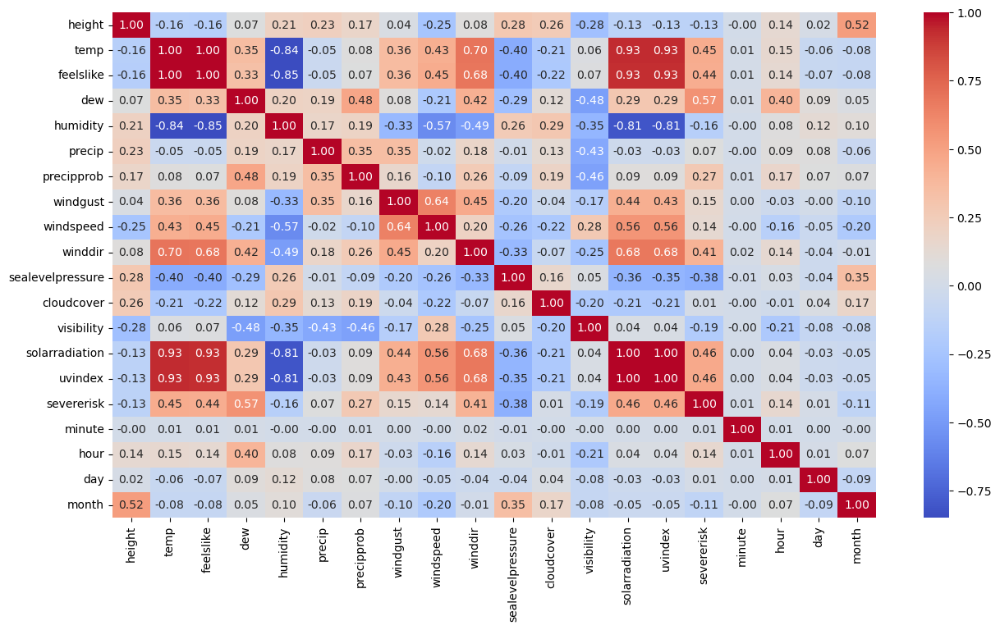

In [33]:
# cek korelasi
plt.figure(figsize=(15,8))
sns.heatmap(merged_mod.corr(numeric_only=True), annot=True, cmap='coolwarm', fmt='.2f')

**Kesimpulan:** 
fitur dengan korelasi >= 0.7 (redundan) :
- 'temp', 
- 'feelslike',  
- 'winddir', 
- 'solarradiation', 
- 'uvindex'

fitur tersebut tidak akan digunakan untuk training model regresi

In [34]:
# memilih fitur
merged_mod = merged_mod[['dew', 'humidity', 'precip','precipprob', 'windgust', 'windspeed', 'sealevelpressure',
                         'cloudcover', 'visibility', 'severerisk','minute', 'hour', 'day', 'month','height']]

### Split and Scaling

In [35]:
# split
X = merged_mod.drop('height', axis=1)
y = merged_mod['height']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#normalisasi
scaler_X = MinMaxScaler().fit(X_train) # fit hanya pada data train agar tidak terjadi data leakage/kebocoran data

X_train = scaler_X.transform(X_train)
X_test = scaler_X.transform(X_test)

### Modeling

In [36]:
# MODEL
# linear regression
lr = LinearRegression()
lr.fit(X_train, y_train)

# random forest regressor
rfr = RandomForestRegressor()
rfr.fit(X_train, y_train)

# support vector regressor
svr = SVR()
svr.fit(X_train, y_train)

# EVAL
# dataframe untuk evaluasi model
eval = pd.DataFrame(index=['train_mae', 'test_mae'], 
                    columns=['Linear Regression', 'Random Forest Regressor', 'SVR'])

# MAE pada data train
eval.loc['train_mae','Linear Regression']       = mean_absolute_error(y_train, lr.predict(X_train))
eval.loc['train_mae','Random Forest Regressor'] = mean_absolute_error(y_train, rfr.predict(X_train))
eval.loc['train_mae','SVR'] = mean_absolute_error(y_train, svr.predict(X_train))

# MAE pada data test
eval.loc['test_mae','Linear Regression']       = mean_absolute_error(y_test, lr.predict(X_test))
eval.loc['test_mae','Random Forest Regressor'] = mean_absolute_error(y_test, rfr.predict(X_test))
eval.loc['test_mae','SVR'] = mean_absolute_error(y_test, svr.predict(X_test))

# hasil evaluasi
eval.transpose()

,train_mae,test_mae
Linear Regression,19.851786,19.603865
Random Forest Regressor,1.169776,2.988519
SVR,15.274559,15.109103


Model regresi terbaik untuk memprediksi 'height' yaitu **`Random Forest Regressor`**

### Result

In [37]:
# siapkan data
X_pred = merged_pred[['dew', 'humidity', 'precip',
       'precipprob', 'windgust', 'windspeed', 'sealevelpressure',
       'cloudcover', 'visibility', 'severerisk',
       'minute', 'hour', 'day', 'month']]

# scaling
X_pred = scaler_X.transform(X_pred)

# prediksi
y_pred = rfr.predict(X_pred)

# Menampilkan dalam tabel
y_pred = pd.DataFrame(y_pred)
y_pred.columns = ['height_pred']
y_pred

,height_pred
0,29.1101
1,57.9764
2,54.9229
3,54.8268
4,54.3310
...,...
8371,99.5001
8372,101.2404
8373,103.9473
8374,104.9046


### Imputation

In [38]:
# menambahkan kolom date ke y_pred
date = merged_pred[['date']]
y_pred = pd.concat([date, y_pred.reindex(date.index)], axis=1)

# dataset final
dataset_final = merged_data.copy()
dataset_final['height_0'] = dataset_final['height'] # untuk plot data 
dataset_final = dataset_final.merge(y_pred, on='date', how='left') # menambahkan y_pred
dataset_final['height'] = dataset_final['height'].fillna(dataset_final['height_pred']) # mengisi NaN dengan y_pred

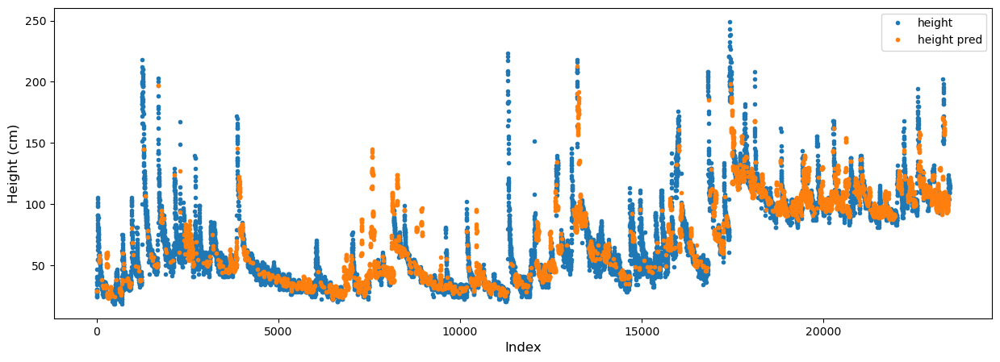

In [39]:
# bentuk sebaran data
plt.figure(figsize=(15, 5))
plt.plot(dataset_final['height_0'], '.', label='height')
plt.plot(dataset_final['height_pred'], '.', label='height pred')
plt.xlabel('Index', fontsize= 12)
plt.ylabel('Height (cm)', fontsize= 12)
plt.legend()

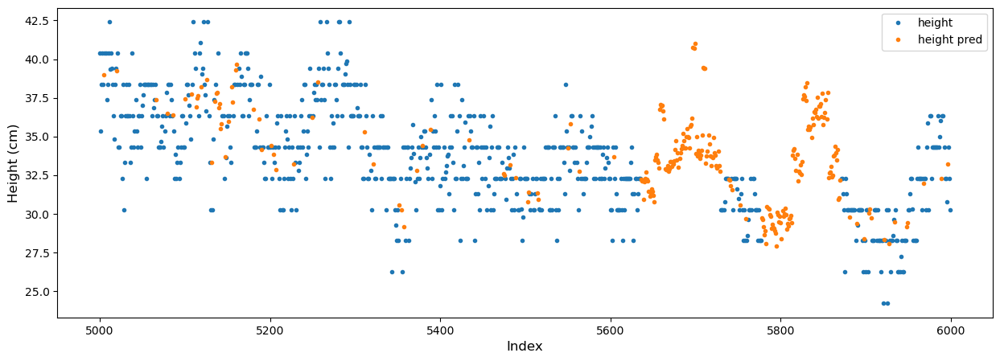

In [40]:
# bentuk sebaran data
plt.figure(figsize=(15, 5))
plt.plot(dataset_final['height_0'][5000:6000], '.', label='height')
plt.plot(dataset_final['height_pred'][5000:6000], '.', label='height pred')
plt.xlabel('Index', fontsize= 12)
plt.ylabel('Height (cm)', fontsize= 12)
plt.legend()

Text(0, 0.5, 'Height (cm)')

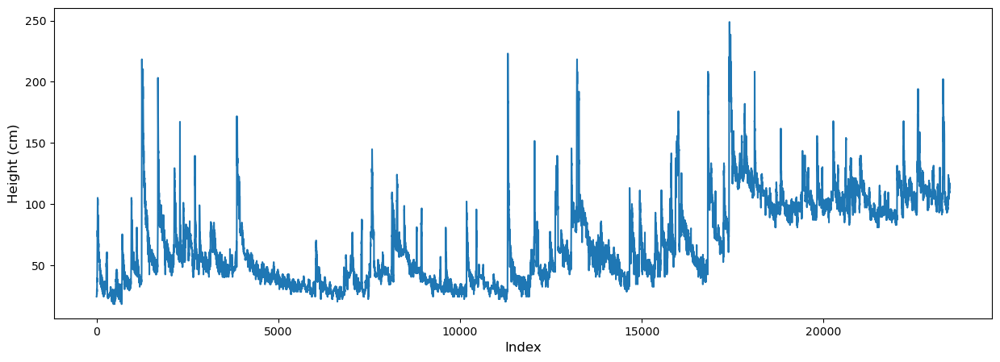

In [41]:
# bentuk sebaran data
plt.figure(figsize=(15, 5))
plt.plot(dataset_final['height'], '-')
plt.xlabel('Index', fontsize= 12)
plt.ylabel('Height (cm)', fontsize= 12)

In [42]:
dataset_final['height'].isna().sum()

0

Data sudah tidak ada missing value, namun agar data benar-benar bersih, dilakukan pengecekan lagi untuk memastikan data bersih

In [43]:
# # membuang fitur yang tidak perlu
# dataset_final = dataset_final.drop(columns = ['conditions', 'icon', 'minute', 'hour', 'day', 'month', 'height_0', 'height_pred'])

# #save dataset
# save_data = dataset_final.copy()
# save_data.to_csv('dataset/dataset_saved/save_databanjir.csv')

In [44]:
# # read dataset
# dataset_final_cleaned = pd.read_csv('dataset/dataset_saved/save_databanjir.csv')

# # interpolasi
# dataset_final_cleaned['height']=dataset_final_cleaned['height'].round(2)
# dataset_final_cleaned['height']= dataset_final_cleaned['height'].fillna(dataset_final_cleaned['height'].interpolate()).round(2)

In [45]:
# dataset_final_cleaned['height'].isna().sum()

Data sudah bersih dari anomali dan missing value

In [46]:
# # save dataset
# dataset_final_cleaned.to_csv('dataset/dataset_saved/dataset_final_cleaned.csv')

## - DATA SMOOTHING

Karena data fluktuatif, maka dilakukan smoothing agar memudahkan model prediksi untuk menangkap pola-pola dalam data

In [47]:
# read dataset
read_data = pd.read_csv('dataset/dataset_saved/dataset_final_cleaned.csv')

In [48]:
# smoothing dengan metode Savitzky-Golay
s1 = read_data['height'].values
height_savgol = savgol_filter(s1, 
                              window_length=15, 
                              polyorder=1)
'''
  Semakin besar window length = semakin smooth
  Semakin besar polyorder = kurang smooth
'''
# menyimpan hasil smoothing
read_data['height'] = height_savgol

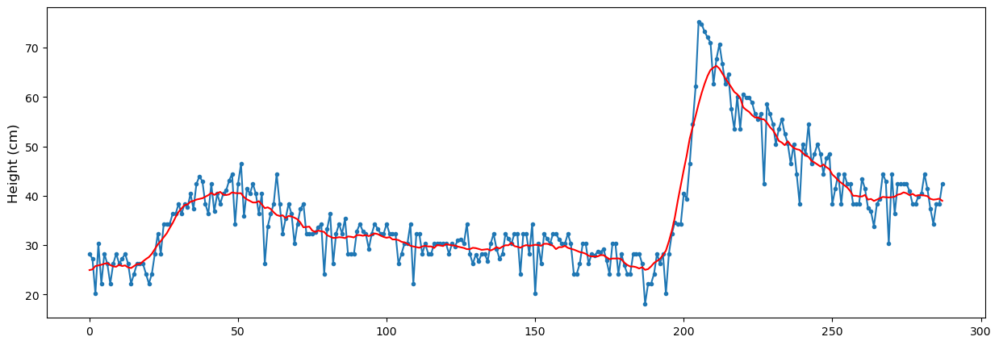

In [49]:
# menampilkan sample data 2 hari
plt.figure(figsize=(15, 5))
plt.plot(s1[500:788], '.-')
plt.plot(height_savgol[500:788], 'r')
plt.ylabel('Height (cm)', fontsize= 12)
plt.show()

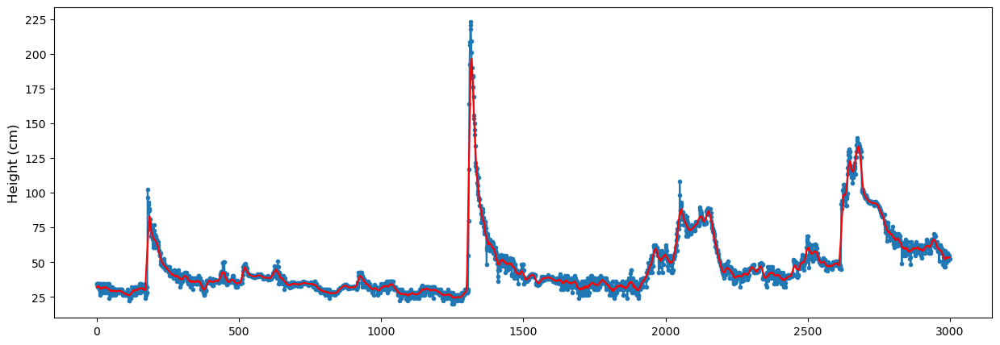

In [50]:
# bentuk data
plt.figure(figsize=(15, 5))
plt.plot(s1[10000:13000], '.-')
plt.plot(height_savgol[10000:13000], 'r')
plt.ylabel('Height (cm)', fontsize= 12)
plt.show()

In [51]:
# # save dataset
# read_data.to_csv('dataset/dataset_saved/dataset_final_smooth15.csv')

## - SAVE DATASET

Karena perbandingan data musim kemarau dan data musim hujan tidak seimbang, maka akan dipilih data musim kemarau saja

In [52]:
# read dataset
read_data = pd.read_csv('dataset/dataset_saved/dataset_final_smooth15.csv')

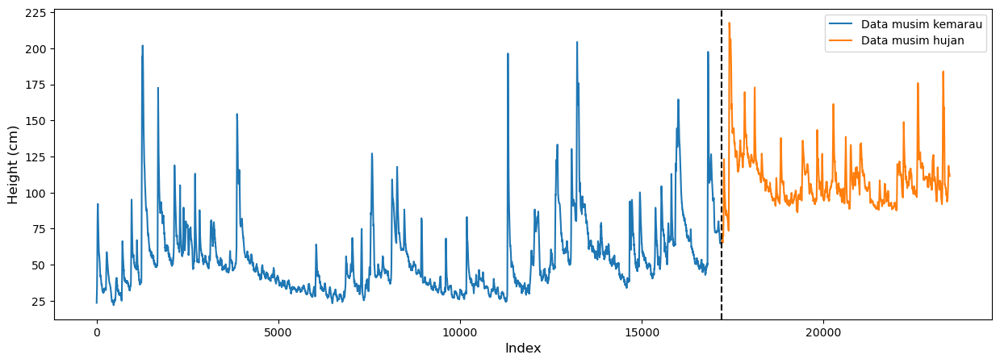

In [58]:
# plot data
plt.figure(figsize=(15, 5))
plt.plot(read_data.height[:17200], '-')
plt.plot(read_data.height[17200:], '-')
plt.xlabel('Index', fontsize= 12)
plt.ylabel('Height (cm)', fontsize= 12)
plt.axvline(17200, color='black', linestyle='--')
plt.legend(['Data musim kemarau', 'Data musim hujan'])

In [59]:
# select data
read_data = read_data[:17200]
read_data

,Unnamed: 0,date,height,temp,feelslike,dew,humidity,precip,precipprob,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,uvindex,severerisk
0,0,03/06/2022 00:00,23.522750,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,0,0,10
1,1,03/06/2022 00:10,24.445214,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,0,0,10
2,2,03/06/2022 00:20,25.367679,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,0,0,10
3,3,03/06/2022 00:30,26.290143,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,0,0,10
4,4,03/06/2022 00:40,27.212607,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,0,0,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17195,17195,30/09/2022 09:50,66.340000,25.4,25.4,19.4,69.42,0.0,0,6.5,3.6,314.2,1012,86.5,24.1,545,5,10
17196,17196,30/09/2022 10:00,66.380667,26.8,28.1,19.6,64.70,0.0,0,8.6,5.4,292.1,1011,100.0,24.1,756,8,10
17197,17197,30/09/2022 10:10,66.713333,26.8,28.1,19.6,64.70,0.0,0,8.6,5.4,292.1,1011,100.0,24.1,756,8,10
17198,17198,30/09/2022 10:20,66.912000,26.8,28.1,19.6,64.70,0.0,0,8.6,5.4,292.1,1011,100.0,24.1,756,8,10


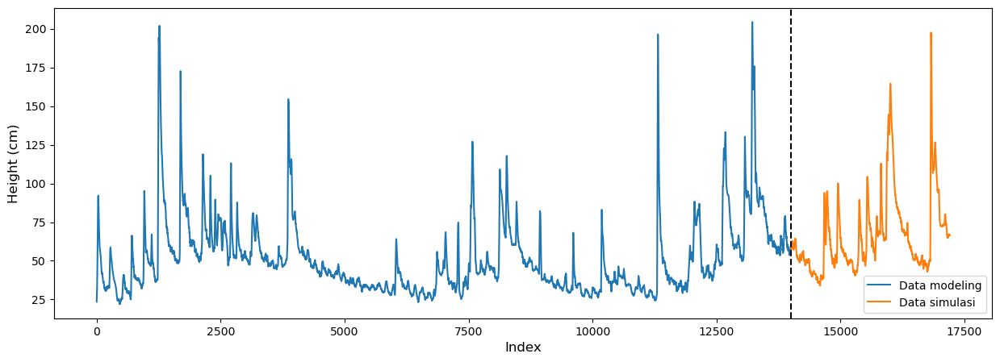

In [60]:
# plot data
plt.figure(figsize=(15, 5))
plt.plot(read_data.height[:14000], '-')
plt.plot(read_data.height[14000:], '-')
plt.xlabel('Index', fontsize= 12)
plt.ylabel('Height (cm)', fontsize= 12)
plt.axvline(14000, color='black', linestyle='--')
plt.legend(['Data modeling', 'Data simulasi'])

In [61]:
# jumlah data
print('Total jumlah data modeling:', len(read_data[:14000]))
print('Total jumlah data simulasi:', len(read_data[14000:]))

Total jumlah data modeling: 14000
Total jumlah data simulasi: 3200


In [64]:
# # SPLIT
# # save data modeling
# data_modeling_banjir = read_data[:14000]
# data_modeling_banjir.to_csv('dataset/data_modeling_banjir.csv')

# # save data simulasi
# data_simulasi_banjir = read_data[14000:]
# data_simulasi_banjir.to_csv('dataset/data_simulasi_banjir.csv')

---

# 2. MODEL KLASIFIKASI BANJIR

In [1]:
# import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from scipy.signal import savgol_filter
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import os
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [2]:
# setting
# display max columns
pd.set_option('display.max_columns', None)

## - DATA UNDERSTANDING

In [3]:
 # read dataset modeling
df = pd.read_csv('dataset/data_modeling_banjir.csv')
# df = df.drop(columns = ['Unnamed: 0'])

# read dataset lengkap (untuk meihat kejadian-kejadian banjir yang tercatat/diberitakan di media)
df_all = pd.read_csv('dataset/dataset_saved/dataset_final_smooth15.csv')
df_all = df_all.drop(columns = ['Unnamed: 0'])

### Data Exploration

Kejadian banjir:
- 11-06-2022 20:58 = [pusatkrisis.kemkes.go.id](https://pusatkrisis.kemkes.go.id/Banjir-di-KOTA-PADANG-SUMATERA-BARAT-11-06-2022-94)
- 02-10-2022 03:00 = [pusatkrisis.kemkes.go.id](https://pusatkrisis.kemkes.go.id/Banjir-di-KOTA-PADANG-SUMATERA-BARAT-02-10-2022-77)
- 11-11-2022 18:30 = [liputan6.com](https://www.liputan6.com/regional/read/5123074/hujan-sejak-siang-kota-padang-dilanda-banjir)

In [4]:
# menyesuaikan format date
df_all['date'] = df_all['date'] + ':00'
df_all['date'] = pd.to_datetime(df_all['date'], format='%d/%m/%Y %H:%M:%S')

df_all = df_all.set_index('date')

In [5]:
# menampilkan dataset lengkap
df_all.head(3) 

,height,temp,feelslike,dew,humidity,precip,precipprob,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,uvindex,severerisk
date,,,,,,,,,,,,,,,,
2022-06-03 00:00:00,23.522750,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,0,0,10
2022-06-03 00:10:00,24.445214,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,0,0,10
2022-06-03 00:20:00,25.367679,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,0,0,10


#### Kejadian banjir 1

In [6]:
# kejadian banjir 1
df_all['2022-06-11 20:50:00':'2022-06-11 20:50:00']

,height,temp,feelslike,dew,humidity,precip,precipprob,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,uvindex,severerisk
date,,,,,,,,,,,,,,,,
2022-06-11 20:50:00,187.087333,19.8,19.8,19.9,100.0,0.0,0,13.3,4.7,278.0,1012,100.0,0.1,0,0,10


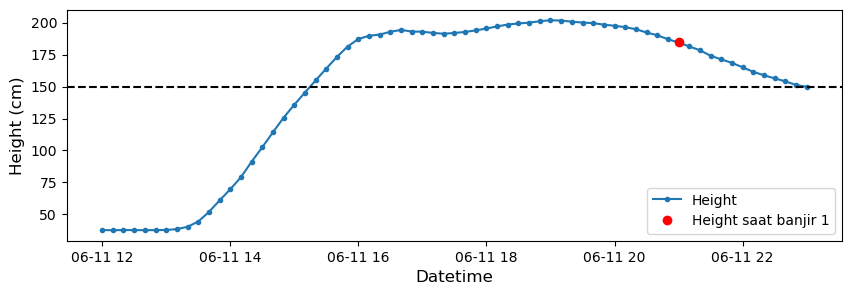

In [7]:
# banjir 1
plt.figure(figsize=(10, 3))
plt.plot(df_all['height']['2022-06-11 12:00:00':'2022-06-11 23:00:00'], '.-')
plt.plot(df_all['height']['2022-06-11 21:00:00':'2022-06-11 21:00:00'], 'ro')
plt.xlabel('Datetime', fontsize= 12)
plt.ylabel('Height (cm)', fontsize= 12)
plt.legend(['Height', 'Height saat banjir 1'],loc='lower right')
plt.axhline(y=150, color='black', linestyle='--')
plt.show()

#### Kejadian banjir 2

In [8]:
# kejadian banjir 2
df_all['2022-10-02 03:00:00':'2022-10-02 03:00:00']

,height,temp,feelslike,dew,humidity,precip,precipprob,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,uvindex,severerisk
date,,,,,,,,,,,,,,,,
2022-10-02 03:00:00,206.006,19.9,19.9,19.5,97.55,0.6,100,1.1,1.1,138.2,1010,47.7,17.3,0,0,10


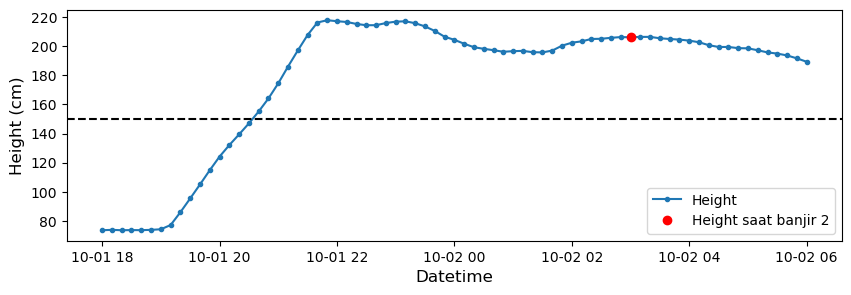

In [9]:
# banjir 2
plt.figure(figsize=(10, 3))
plt.plot(df_all['height']['2022-10-01 18:00:00':'2022-10-02 06:00:00'], '.-')
plt.plot(df_all['height']['2022-10-02 03:00:00':'2022-10-02 03:00:00'], 'ro')
plt.xlabel('Datetime', fontsize= 12)
plt.ylabel('Height (cm)', fontsize= 12)
plt.legend(['Height', 'Height saat banjir 2'],loc='lower right')
plt.axhline(y=150, color='black', linestyle='--')
plt.show()

#### Kejadian banjir 3

In [10]:
# kejadian banjir 3
df_all['2022-11-11 18:30:00':'2022-11-11 18:30:00']

,height,temp,feelslike,dew,humidity,precip,precipprob,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,uvindex,severerisk
date,,,,,,,,,,,,,,,,
2022-11-11 18:30:00,182.850667,20.7,20.7,20.4,98.17,0.5,100,4.7,2.5,205.3,1011,91.7,3.7,22,0,10


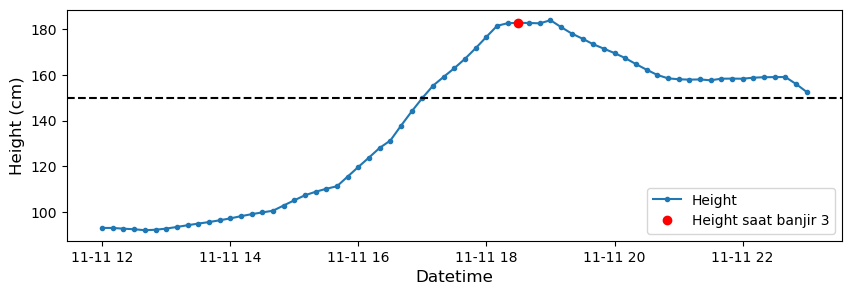

In [11]:
# banjir 2
plt.figure(figsize=(10, 3))
plt.plot(df_all['height']['2022-11-11 12:00:00':'2022-11-11 23:00:00'], '.-')
plt.plot(df_all['height']['2022-11-11 18:30:00':'2022-11-11 18:30:00'], 'ro')
plt.xlabel('Datetime', fontsize= 12)
plt.ylabel('Height (cm)', fontsize= 12)
plt.legend(['Height', 'Height saat banjir 3'],loc='lower right')
plt.axhline(y=150, color='black', linestyle='--')
plt.show()

### Defining Label

Dari ketiga kejadian banjir, banjir terjadi saat tinggi air > 150 cm. Jadi, label akan dibagi menjadi 3 tingkatan:
- aman, tinggi air <= 100 cm
- siaga 1, 100 cm < tinggi air <= 150 cm
- siaga 2, tinggi air > 150 cm

In [4]:
# define aman=0, siaga 1=1, siaga 2=2
df['status'] = np.where(df['height'] <= 100, 0, 
                        np.where(df['height'] <= 150, 1, 
                                 2))

In [14]:
df[['date','height','status']].sample(5)

,date,height,status
8263,30/07/2022 09:10,113.526667,1
660,07/06/2022 14:00,29.861333,0
327,05/06/2022 06:30,42.782667,0
13257,03/09/2022 01:30,173.955333,2
9646,08/08/2022 23:40,39.408667,0


In [15]:
df['status'].value_counts()

0    13427
1      433
2      140
Name: status, dtype: int64

## - DATA PREPROCESSING

In [5]:
# Membagi fitur/prediktor dan label
X = df[['height']]
y = df[['status']]

# Split dataset menjadi train, val, dan test
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

# scaling/normalisasi data
'''
  fit hanya pada data train 
  agar tidak terjadi data leakage/kebocoran data
'''
scaler_X = MinMaxScaler().fit(X_train)
X_train = scaler_X.transform(X_train)
X_val = scaler_X.transform(X_val)
X_test = scaler_X.transform(X_test)

X_train.shape, y_train.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape

((10080, 1), (10080, 1), (2800, 1), (2800, 1), (1120, 1), (1120, 1))

In [8]:
import joblib

joblib.dump(scaler_X, 'scaler/scaler_X_klasifikasi.save') 

['scaler/scaler_X_klasifikasi.save']

## - MODELING & RESULT

### Model GRU

In [17]:
# Membuat model GRU
model_klasifikasi = Sequential()
model_klasifikasi.add(GRU(32, input_shape=(None, 1)))
model_klasifikasi.add(Dense(3, activation='softmax'))
model_klasifikasi.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 32)                3360      
                                                                 
 dense (Dense)               (None, 3)                 99        
                                                                 
Total params: 3,459
Trainable params: 3,459
Non-trainable params: 0
_________________________________________________________________


In [18]:
model_klasifikasi.compile(optimizer='adam', 
                          loss='sparse_categorical_crossentropy', 
                          metrics=['accuracy'])

history_klasifikasi = model_klasifikasi.fit(X_train, y_train, 
                                            validation_data=(X_val, y_val),
                                            epochs=20, batch_size=32)

Epoch 1/20
315/315 [==============================] - 5s 8ms/step - loss: 0.4130 - accuracy: 0.9561 - val_loss: 0.1969 - val_accuracy: 0.9600
Epoch 2/20
315/315 [==============================] - 2s 6ms/step - loss: 0.1693 - accuracy: 0.9586 - val_loss: 0.1358 - val_accuracy: 0.9600
Epoch 3/20
315/315 [==============================] - 2s 6ms/step - loss: 0.1118 - accuracy: 0.9587 - val_loss: 0.0870 - val_accuracy: 0.9600
Epoch 4/20
315/315 [==============================] - 2s 6ms/step - loss: 0.0744 - accuracy: 0.9644 - val_loss: 0.0629 - val_accuracy: 0.9675
Epoch 5/20
315/315 [==============================] - 2s 6ms/step - loss: 0.0555 - accuracy: 0.9724 - val_loss: 0.0495 - val_accuracy: 0.9746
Epoch 6/20
315/315 [==============================] - 2s 6ms/step - loss: 0.0446 - accuracy: 0.9809 - val_loss: 0.0411 - val_accuracy: 0.9857
Epoch 7/20
315/315 [==============================] - 2s 7ms/step - loss: 0.0367 - accuracy: 0.9878 - val_loss: 0.0340 - val_accuracy: 0.9846
Epoch 

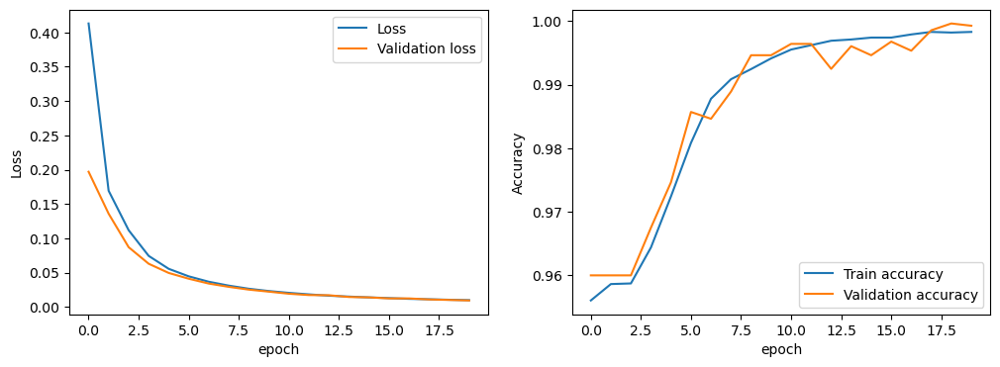

In [19]:
# plot loss & accuracy
plt.figure(figsize=(12, 4))
    
plt.subplot(121) # row , col , index 
plt.plot(history_klasifikasi.history['loss'])
plt.plot(history_klasifikasi.history['val_loss'])
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['Loss', 'Validation loss'], loc='upper right')

plt.subplot(122) 
plt.plot(history_klasifikasi.history['accuracy'])
plt.plot(history_klasifikasi.history['val_accuracy'])
plt.ylabel('Accuracy')
plt.xlabel('epoch')
plt.legend(['Train accuracy', 'Validation accuracy'], loc='lower right')
    
plt.show()

In [20]:
# Evaluasi model
train_scores = model_klasifikasi.evaluate(X_train, y_train, verbose=0)
val_scores = model_klasifikasi.evaluate(X_val, y_val, verbose=0)
test_scores = model_klasifikasi.evaluate(X_test, y_test, verbose=0)

# dataframe untuk evaluasi model
df_eval = pd.DataFrame(index=['train', 'val', 'test'],
                       columns=['loss', 'accuracy'])

df_eval.loc['train', 'loss']=train_scores[0]
df_eval.loc['train', 'accuracy']=train_scores[1]

df_eval.loc['val', 'loss']=val_scores[0]
df_eval.loc['val', 'accuracy']=val_scores[1]

df_eval.loc['test', 'loss']=test_scores[0]
df_eval.loc['test', 'accuracy']=test_scores[1]

df_eval

,loss,accuracy
train,0.009286,0.999008
val,0.009436,0.999286
test,0.008688,0.999107


### Result

#### Satu data

In [28]:
#sample_test = X_test.reshape(-1)
sample_test = pd.DataFrame(X_test, columns = ['height_scaled'])
sample_test = sample_test.sample(1).reset_index(drop=True)

# inverse transform
sample_test_inverse = scaler_X.inverse_transform(sample_test[['height_scaled']])
sample_test_inverse = pd.DataFrame(sample_test_inverse,columns = ['height'])

sample_test=sample_test.join(sample_test_inverse)
sample_test

,height_scaled,height
0,0.287381,74.34


In [29]:
pred = model_klasifikasi.predict(sample_test[['height_scaled']])
pred = np.argmax(pred, axis=1)
pred

1/1 [==============================] - 0s 24ms/step


array([0], dtype=int64)

In [30]:
pred = pd.DataFrame(pred,columns = ['status_pred'])
prediksi = sample_test.join(pred)

prediksi

,height_scaled,height,status_pred
0,0.287381,74.34,0


#### Banyak data

In [32]:
#sample_test = X_test.reshape(-1)
sample_test = pd.DataFrame(X_test, columns = ['height_scaled'])
sample_test = sample_test.sample(6).reset_index(drop=True)

# inverse transform
sample_test_inverse = scaler_X.inverse_transform(sample_test[['height_scaled']])
sample_test_inverse = pd.DataFrame(sample_test_inverse,columns = ['height'])

sample_test=sample_test.join(sample_test_inverse)
sample_test

,height_scaled,height
0,0.327763,81.698000
1,0.908770,187.561333
2,0.296122,75.932667
3,0.063020,33.460000
4,0.361231,87.796000
5,0.147887,48.923333


In [33]:
pred = model_klasifikasi.predict(sample_test[['height_scaled']])
pred = np.argmax(pred, axis=1)
pred

1/1 [==============================] - 0s 26ms/step


array([0, 2, 0, 0, 0, 0], dtype=int64)

In [34]:
pred = pd.DataFrame(pred,columns = ['status_pred'])
prediksi = sample_test.join(pred)

prediksi

,height_scaled,height,status_pred
0,0.327763,81.698000,0
1,0.908770,187.561333,2
2,0.296122,75.932667,0
3,0.063020,33.460000,0
4,0.361231,87.796000,0
5,0.147887,48.923333,0


## - SAVE MODEL

In [35]:
# save model dalam format .h5
model_klasifikasi.save('model/model_klasifikasi_banjir.h5')

In [6]:
# # Memuat model dari format HDF5
from tensorflow.keras.models import load_model
loaded_model = load_model('model/model_klasifikasi_banjir.h5')

In [10]:
# # Evaluasi model
# train_scores = loaded_model.evaluate(X_train, y_train, verbose=0)
# val_scores = loaded_model.evaluate(X_val, y_val, verbose=0)
# test_scores = loaded_model.evaluate(X_test, y_test, verbose=0)

# # dataframe untuk evaluasi model
# df_eval = pd.DataFrame(index=['train', 'val', 'test'],
#                        columns=['loss', 'accuracy'])

# df_eval.loc['train', 'loss']=train_scores[0]
# df_eval.loc['train', 'accuracy']=train_scores[1]

# df_eval.loc['val', 'loss']=val_scores[0]
# df_eval.loc['val', 'accuracy']=val_scores[1]

# df_eval.loc['test', 'loss']=test_scores[0]
# df_eval.loc['test', 'accuracy']=test_scores[1]

# df_eval

,loss,accuracy
train,0.009286,0.999008
val,0.009436,0.999286
test,0.008688,0.999107


---

# 3. MODEL PREDIKSI BANJIR

In [2]:
# import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from scipy.signal import savgol_filter
from scipy.stats import boxcox
from sklearn.preprocessing import MinMaxScaler, RobustScaler
import os
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU, Dropout, Bidirectional
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError, MeanAbsolutePercentageError
from sklearn.metrics import mean_absolute_error, mean_squared_error
import warnings
import sys

In [3]:
# setting
# display max columns
pd.set_option('display.max_columns', None)

# ignore warnings
warnings.filterwarnings('ignore')

In [4]:
# system info
print('python/system version:', sys.version)
print('tf version:', tf.__version__)
print('gpu num:', len(tf.config.experimental.list_physical_devices('GPU')))
print('cuda:', tf.test.is_built_with_cuda())

python/system version: 3.9.16 (main, Jan 11 2023, 16:16:36) [MSC v.1916 64 bit (AMD64)]
tf version: 2.10.0
gpu num: 1
cuda: True


## - DATA UNDERSTANDING

In [4]:
# read dataset
data = pd.read_csv('dataset/data_modeling_banjir.csv')
data

,date,height,temp,feelslike,dew,humidity,precip,precipprob,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,uvindex,severerisk
0,03/06/2022 00:00,23.522750,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,0,0,10
1,03/06/2022 00:10,24.445214,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,0,0,10
2,03/06/2022 00:20,25.367679,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,0,0,10
3,03/06/2022 00:30,26.290143,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,0,0,10
4,03/06/2022 00:40,27.212607,18.7,18.7,17.6,93.32,0.0,0,3.6,4.7,68.5,1014,100.0,24.1,0,0,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13995,08/09/2022 04:30,58.891333,18.6,18.6,17.6,93.91,0.0,0,4.7,6.5,84.6,1013,100.0,24.1,0,0,10
13996,08/09/2022 04:40,59.565333,18.6,18.6,17.6,93.91,0.0,0,4.7,6.5,84.6,1013,100.0,24.1,0,0,10
13997,08/09/2022 04:50,59.687333,18.6,18.6,17.6,93.91,0.0,0,4.7,6.5,84.6,1013,100.0,24.1,0,0,10
13998,08/09/2022 05:00,59.669333,19.0,19.0,17.3,89.87,0.0,0,4.7,6.5,81.5,1013,100.0,24.1,0,0,10


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14000 entries, 0 to 13999
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   date              14000 non-null  object 
 1   height            14000 non-null  float64
 2   temp              14000 non-null  float64
 3   feelslike         14000 non-null  float64
 4   dew               14000 non-null  float64
 5   humidity          14000 non-null  float64
 6   precip            14000 non-null  float64
 7   precipprob        14000 non-null  int64  
 8   windgust          14000 non-null  float64
 9   windspeed         14000 non-null  float64
 10  winddir           14000 non-null  float64
 11  sealevelpressure  14000 non-null  int64  
 12  cloudcover        14000 non-null  float64
 13  visibility        14000 non-null  float64
 14  solarradiation    14000 non-null  int64  
 15  uvindex           14000 non-null  int64  
 16  severerisk        14000 non-null  int64 

In [6]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
height,14000.0,51.292076,24.178707,21.977333,34.573833,45.142333,59.586167,204.42
temp,14000.0,21.766214,2.825473,17.500000,19.600000,20.500000,24.000000,29.80
feelslike,14000.0,21.846400,3.001786,17.500000,19.600000,20.500000,24.000000,31.00
dew,14000.0,19.255143,1.506380,13.900000,18.400000,19.300000,20.200000,23.20
humidity,14000.0,86.922140,13.231809,45.860000,79.640000,92.880000,96.960000,100.00
precip,14000.0,0.460029,1.716985,0.000000,0.000000,0.000000,0.300000,33.60
precipprob,14000.0,40.371429,49.065900,0.000000,0.000000,0.000000,100.000000,100.00
windgust,14000.0,4.871643,2.411981,0.700000,3.200000,4.300000,6.100000,26.30
windspeed,14000.0,4.640386,2.019249,0.000000,3.200000,4.700000,5.800000,11.50
winddir,14000.0,156.146300,94.399413,1.000000,77.200000,98.200000,252.800000,359.80


### Cek Korelasi (1)

Memilih fitur yang tidak redundan, korelasi antar fitur < 0.5

<AxesSubplot: >

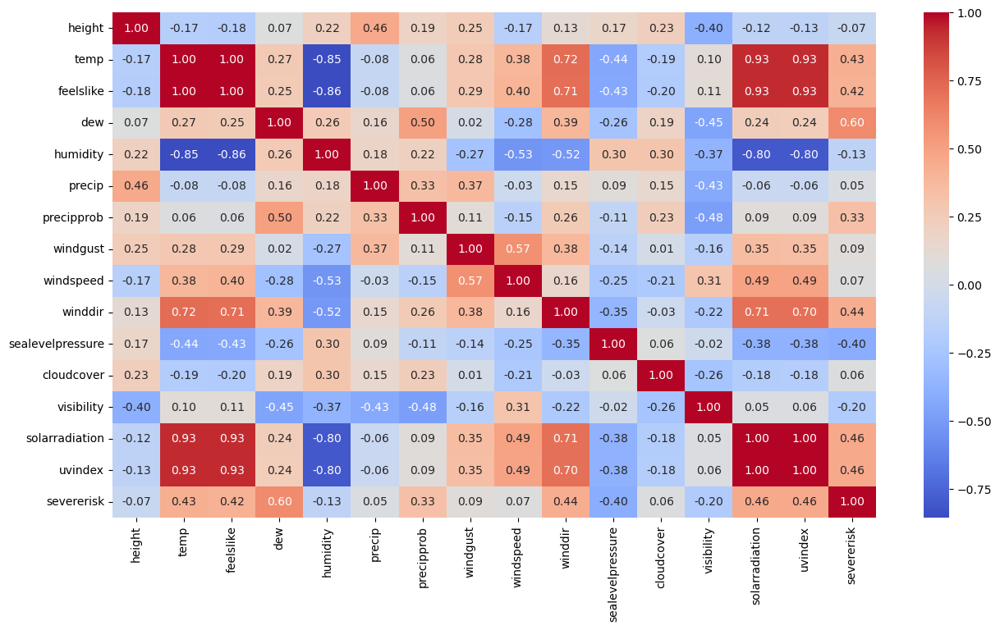

In [7]:
# cek korelasi
plt.figure(figsize=(15,8))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f')
#plt.savefig('corr.png')

Nilai positif menunjukkan hubungan yang positif, misal hubungan precip dan height, semakin besar nilai precip maka semakin besar juga nilai height. Nilai negatif menunjukkan hubungan yang negatif, misalnya hubungan windspeed dengan height.

Karena terdapat banyak fitur, kita akan memilih beberapa fitur untuk dilakukan eksplorasi lebih dalam. Pertama, memastikan fitur yang dipilih tidak redundan/memiliki kesamaan informasi dengan fitur lainnya(digunakan treshold 0.5)

Fitur redundan:
- 'temp', 
- 'feelslike', 
- 'precipprob',
- 'windspeed',
- 'winddir', 
- 'solarradiation'
- 'uvindex'
- 'severerisk'

Lalu, akan mengekstrak selain fitur di atas untuk melihat apakah ada fitur baru yang memiliki korelasi tinggi dengan 'height'

### Feature Extraction

In [5]:
# menyesuaikan format date
data['date'] = data['date'] + ':00'
data['date'] = pd.to_datetime(data['date'], format='%d/%m/%Y %H:%M:%S')

''' LAG '''
# NILAI SEBELUMNYA (LAG FEATURE) 3H
data['height_3h'] = data['height'].shift(18)
data['dew_3h'] = data['dew'].shift(18) 
data['humidity_3h'] = data['humidity'].shift(18)
data['precip_3h'] = data['precip'].shift(18) 
data['windgust_3h'] = data['windgust'].shift(18)
data['sealevelpressure_3h'] = data['sealevelpressure'].shift(18)
data['cloudcover_3h'] = data['cloudcover'].shift(18)
data['visibility_3h'] = data['visibility'].shift(18)
# NILAI SEBELUMNYA (LAG FEATURE) 6H
data['height_6h'] = data['height'].shift(36) #36=back, -36=forward
data['dew_6h'] = data['dew'].shift(36) 
data['humidity_6h'] = data['humidity'].shift(36)
data['precip_6h'] = data['precip'].shift(36) 
data['windgust_6h'] = data['windgust'].shift(36)
data['sealevelpressure_6h'] = data['sealevelpressure'].shift(36)
data['cloudcover_6h'] = data['cloudcover'].shift(36)
data['visibility_6h'] = data['visibility'].shift(36)
# NILAI SEBELUMNYA (LAG FEATURE) 12H
data['height_12h'] = data['height'].shift(72)
data['dew_12h'] = data['dew'].shift(72) 
data['humidity_12h'] = data['humidity'].shift(72)
data['precip_12h'] = data['precip'].shift(72) 
data['windgust_12h'] = data['windgust'].shift(72)
data['sealevelpressure_12h'] = data['sealevelpressure'].shift(72)
data['cloudcover_12h'] = data['cloudcover'].shift(72)
data['visibility_12h'] = data['visibility'].shift(72)
# NILAI SEBELUMNYA (LAG FEATURE) 18H
data['height_18h'] = data['height'].shift(108)
data['dew_18h'] = data['dew'].shift(108) 
data['humidity_18h'] = data['humidity'].shift(108)
data['precip_18h'] = data['precip'].shift(108) 
data['windgust_18h'] = data['windgust'].shift(108)
data['sealevelpressure_18h'] = data['sealevelpressure'].shift(108)
data['cloudcover_18h'] = data['cloudcover'].shift(108)
data['visibility_18h'] = data['visibility'].shift(108)


''' DIFFERENCE '''
# FITUR BARU: SELISIH DENGAN NILAI 3H SEBELUMNYA  
data['height_diff_3h'] = data['height'] - data['height'].shift(18) 
data['dew_diff_3h'] = data['dew'] - data['dew'].shift(18) 
data['humidity_diff_3h'] = data['humidity'] - data['humidity'].shift(18)
data['precip_diff_3h'] = data['precip'] - data['precip'].shift(18) 
data['windgust_diff_3h'] = data['windgust'] - data['windgust'].shift(18)
data['sealevelpressure_diff_3h'] = data['sealevelpressure'] - data['sealevelpressure'].shift(18)
data['cloudcover_diff_3h'] = data['cloudcover'] - data['cloudcover'].shift(18)
data['visibility_diff_3h'] = data['visibility'] - data['visibility'].shift(18)
# FITUR BARU: SELISIH DENGAN NILAI 6H SEBELUMNYA  
data['height_diff_6h'] = data['height'] - data['height'].shift(36) 
data['dew_diff_6h'] = data['dew'] - data['dew'].shift(36) 
data['humidity_diff_6h'] = data['humidity'] - data['humidity'].shift(36)
data['precip_diff_6h'] = data['precip'] - data['precip'].shift(36) 
data['windgust_diff_6h'] = data['windgust'] - data['windgust'].shift(36)
data['sealevelpressure_diff_6h'] = data['sealevelpressure'] - data['sealevelpressure'].shift(36)
data['cloudcover_diff_6h'] = data['cloudcover'] - data['cloudcover'].shift(36)
data['visibility_diff_6h'] = data['visibility'] - data['visibility'].shift(36)
# FITUR BARU: SELISIH DENGAN NILAI 12H SEBELUMNYA  
data['height_diff_12h'] = data['height'] - data['height'].shift(72)
data['dew_diff_12h'] = data['dew'] - data['dew'].shift(72) 
data['humidity_diff_12h'] = data['humidity'] - data['humidity'].shift(72)
data['precip_diff_12h'] = data['precip'] - data['precip'].shift(72) 
data['windgust_diff_12h'] = data['windgust'] - data['windgust'].shift(72)
data['sealevelpressure_diff_12h'] = data['sealevelpressure'] - data['sealevelpressure'].shift(72)
data['cloudcover_diff_12h'] = data['cloudcover'] - data['cloudcover'].shift(72)
data['visibility_diff_12h'] = data['visibility'] - data['visibility'].shift(72)
# FITUR BARU: SELISIH DENGAN NILAI 24H SEBELUMNYA  
data['height_diff_18h'] = data['height'] - data['height'].shift(108)
data['dew_diff_18h'] = data['dew'] - data['dew'].shift(108) 
data['humidity_diff_18h'] = data['humidity'] - data['humidity'].shift(108)
data['precip_diff_18h'] = data['precip'] - data['precip'].shift(108) 
data['windgust_diff_18h'] = data['windgust'] - data['windgust'].shift(108)
data['sealevelpressure_diff_18h'] = data['sealevelpressure'] - data['sealevelpressure'].shift(108)
data['cloudcover_diff_18h'] = data['cloudcover'] - data['cloudcover'].shift(108)
data['visibility_diff_18h'] = data['visibility'] - data['visibility'].shift(108)

# merapihkan tabel
data = data.dropna()
data = data.reset_index(drop = True)

data150=data[data['height']>150] # untuk EDA

### Exploratory Data Analysis (EDA)

In [9]:
def plot_eda_grafik(col='col'): 
    plt.figure(figsize=(15, 3))
    plt.plot(data[col][1000:2100], '-')
    plt.title("Bentuk Data", fontweight='bold', fontsize= 14)
    plt.ylabel(col) #
    plt.legend([col], loc='upper right') #
    plt.show()
    
def plot_eda_dist_scatter(col='col'):
    plt.figure(figsize=(15, 3))
    plt.subplot(121) # row , col , index 
    sns.distplot(data[col], kde=True)                   
    plt.legend([col], loc='upper right') 
    plt.title("Distribusi Data", fontweight='bold', fontsize= 14)   
    plt.subplot(122) 
    sns.scatterplot(x=data[col], y=data['height']) 
    plt.axhline(150, color='grey', linestyle='dotted')
    plt.title('Scatter Plot', fontweight='bold', fontsize= 14)
    plt.show()

def col_info_lag(column):
    print('Persentase',column,' :', (data[(data150[column].min()<=data[column]) & (data[column]<=data150[column].max())].shape[0]/len(data)*100), '%')
    print('Persentase lag 3h :', (data[(data150[column+'_3h'].min()<=data[column+'_3h']) & (data[column+'_3h']<=data150[column+'_3h'].max())].shape[0]/len(data)*100), '%')
    print('Persentase lag 6h :', (data[(data150[column+'_6h'].min()<=data[column+'_6h']) & (data[column+'_6h']<=data150[column+'_6h'].max())].shape[0]/len(data)*100), '%')
    print('Persentase lag 12h:', (data[((data150[column+'_12h'].min()<=data[column+'_12h']) & (data[column+'_12h']<=data150[column+'_12h'].max()))].shape[0]/len(data)*100), '%')
    print('Persentase lag 18h:', (data[((data150[column+'_18h'].min()<=data[column+'_18h']) & (data[column+'_18h']<=data150[column+'_18h'].max()))].shape[0]/len(data)*100), '%')
    return data150[[column,column+'_3h', column+'_6h', column+'_12h', column+'_18h']].describe().T

def col_info_diff(column):
    print('Persentase diff 3h :', (data[(data150[column+'_diff_3h'].min()<=data[column+'_diff_3h']) & (data[column+'_diff_3h']<=data150[column+'_diff_3h'].max())].shape[0]/len(data)*100), '%')
    print('Persentase diff 6h :', (data[(data150[column+'_diff_6h'].min()<=data[column+'_diff_6h']) & (data[column+'_diff_6h']<=data150[column+'_diff_6h'].max())].shape[0]/len(data)*100), '%')
    print('Persentase diff 12h:', (data[((data150[column+'_diff_12h'].min()<=data[column+'_diff_12h']) & (data[column+'_diff_12h']<=data150[column+'_diff_12h'].max()))].shape[0]/len(data)*100), '%')
    print('Persentase diff 18h:', (data[((data150[column+'_diff_18h'].min()<=data[column+'_diff_18h']) & (data[column+'_diff_18h']<=data150[column+'_diff_18h'].max()))].shape[0]/len(data)*100), '%')
    return data150[[column+'_diff_3h', column+'_diff_6h', column+'_diff_12h', column+'_diff_18h']].describe().T

#### **.height (cm)**

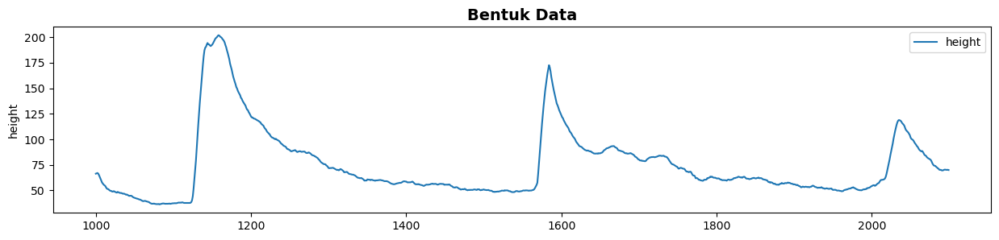

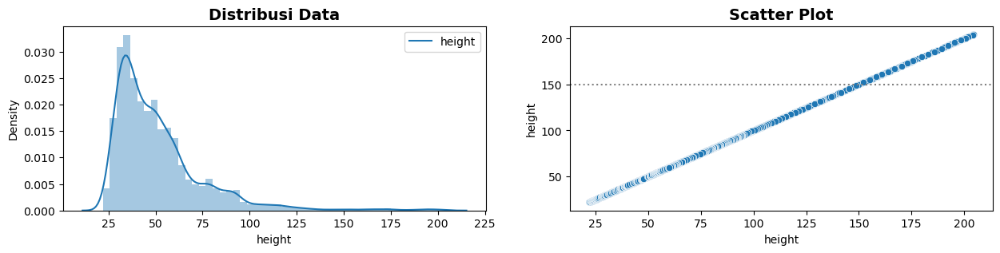

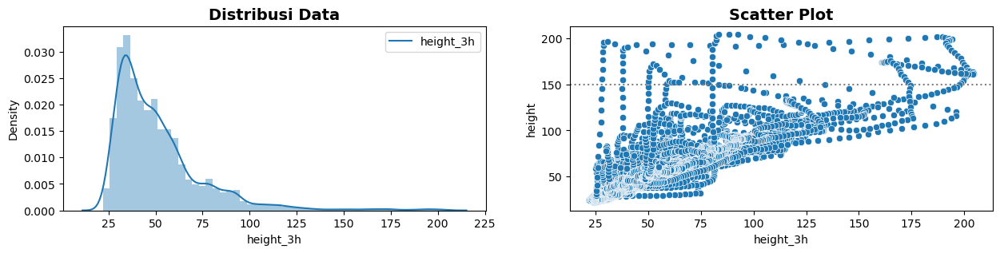

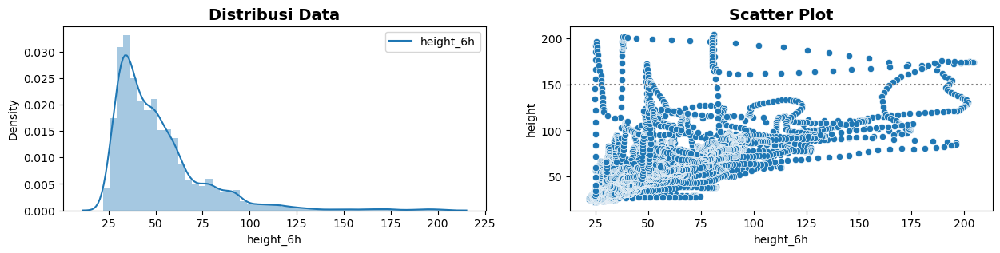

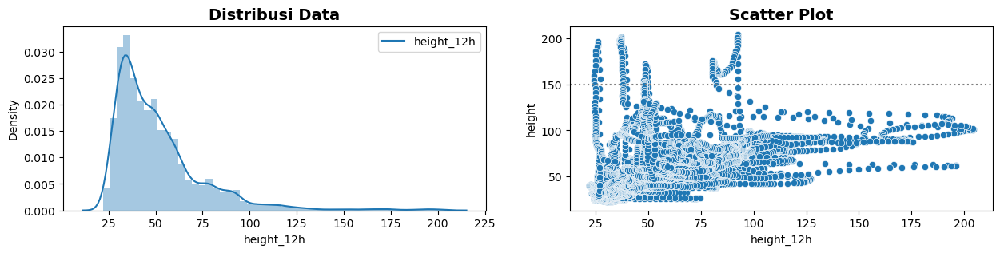

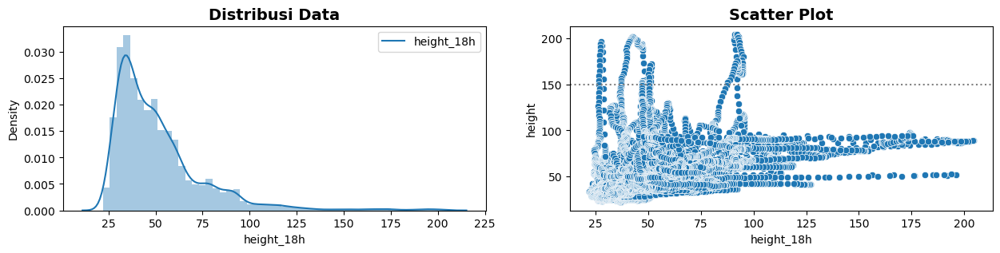

Persentase height  : 1.0077742585660812 %
Persentase lag 3h : 94.4284480276418 %
Persentase lag 6h : 99.14339188021883 %
Persentase lag 12h: 93.97494961128707 %
Persentase lag 18h: 92.63604952490641 %


,count,mean,std,min,25%,50%,75%,max
height,140.0,176.832148,15.969685,150.573333,164.107667,174.072333,192.347667,204.420000
height_3h,140.0,128.178524,61.322230,28.066667,68.682500,155.238333,187.986500,204.420000
height_6h,140.0,92.290786,60.336501,24.878000,37.994833,80.369333,148.633667,204.420000
height_12h,140.0,58.491133,25.022157,24.339333,36.927667,48.472667,82.662167,92.665333
height_18h,140.0,63.449195,26.289866,26.362667,41.667500,50.155000,92.337167,95.031333


In [10]:
c='height'
plot_eda_grafik(col=c)
plot_eda_dist_scatter(col=c)
plot_eda_dist_scatter(col=c+'_3h')
plot_eda_dist_scatter(col=c+'_6h')
plot_eda_dist_scatter(col=c+'_12h')
plot_eda_dist_scatter(col=c+'_18h')
col_info_lag(c)

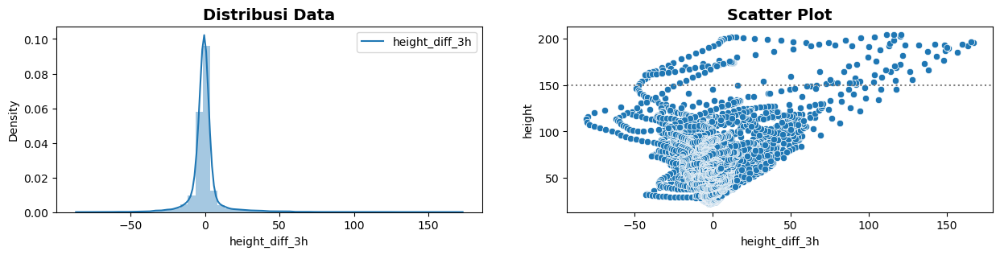

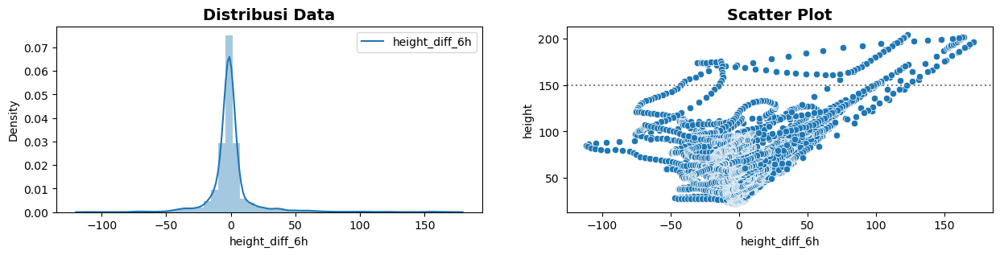

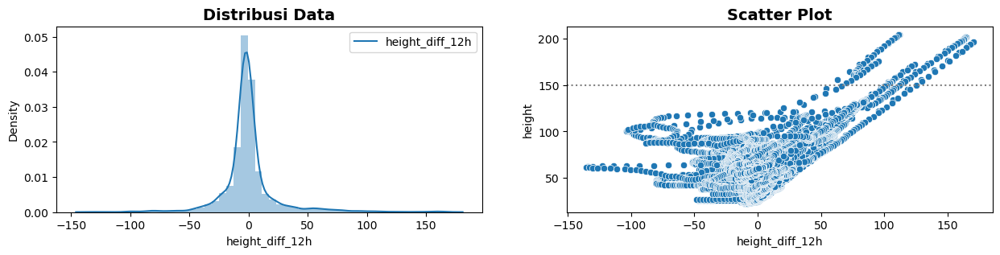

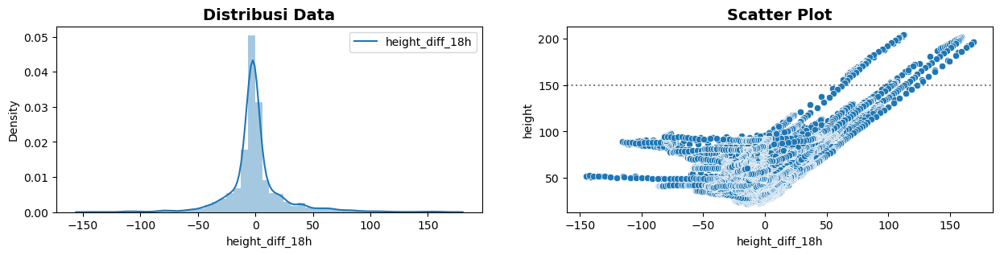

Persentase diff 3h : 99.7336596602361 %
Persentase diff 6h : 98.76907572703715 %
Persentase diff 12h: 2.548229196659948 %
Persentase diff 18h: 2.713792110567233 %


,count,mean,std,min,25%,50%,75%,max
height_diff_3h,140.0,48.653624,64.225509,-47.192000,-5.701167,33.901667,107.496167,167.181333
height_diff_6h,140.0,84.541362,67.075627,-41.800000,22.633667,103.777667,142.149667,171.178000
height_diff_12h,140.0,118.341014,31.182933,63.102000,92.195333,111.611333,151.963167,170.443333
height_diff_18h,140.0,113.382952,32.204895,63.519333,81.580667,111.302667,146.252000,168.838667


In [11]:
c='height'
plot_eda_dist_scatter(col=c+'_diff_3h')
plot_eda_dist_scatter(col=c+'_diff_6h')
plot_eda_dist_scatter(col=c+'_diff_12h')
plot_eda_dist_scatter(col=c+'_diff_18h')
col_info_diff(c)

#### **.dew (C)**

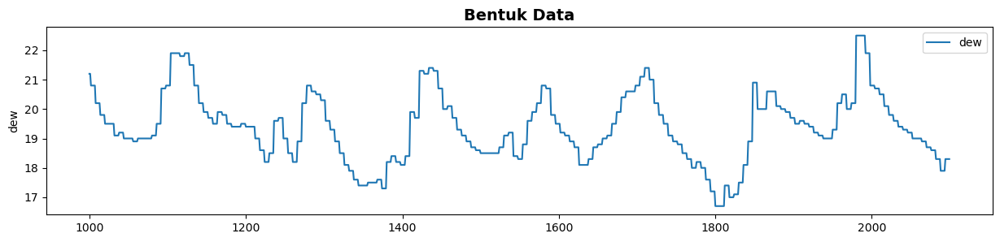

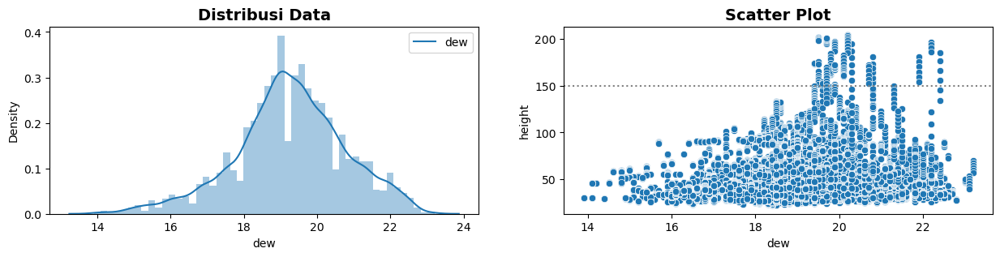

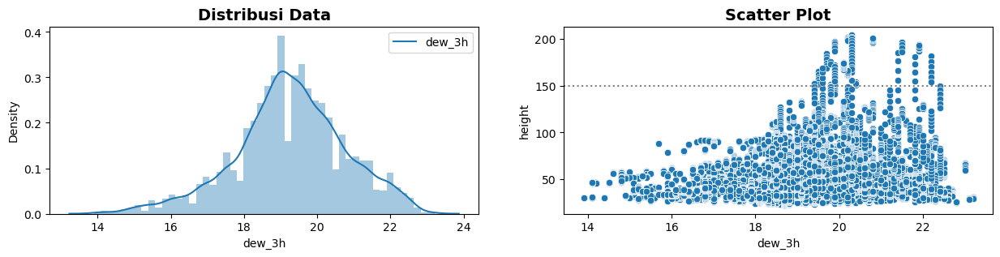

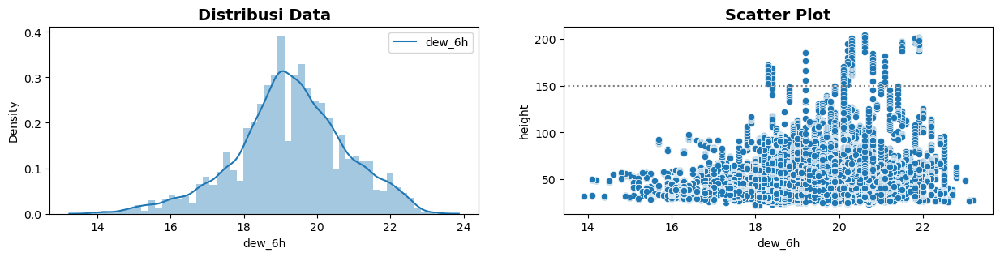

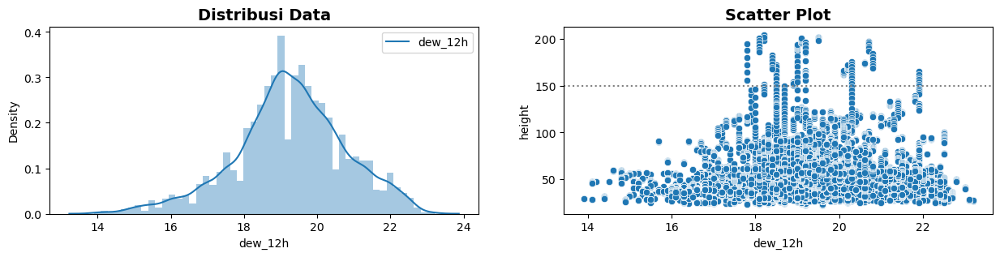

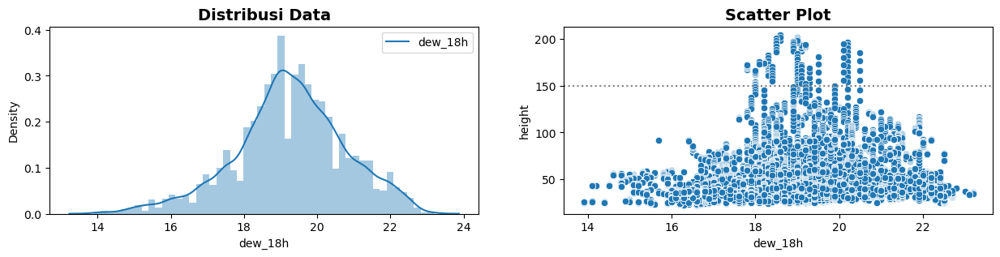

Persentase dew  : 46.94788367405701 %
Persentase lag 3h : 46.08407716671466 %
Persentase lag 6h : 74.690469334869 %
Persentase lag 12h: 81.86006334581054 %
Persentase lag 18h: 66.57068816585084 %


,count,mean,std,min,25%,50%,75%,max
dew,140.0,20.201429,0.790955,19.4,19.7,19.9,20.3,22.4
dew_3h,140.0,20.460000,0.759477,19.4,19.9,20.2,20.8,22.2
dew_6h,140.0,20.557857,0.907449,18.3,20.2,20.3,21.1,21.9
dew_12h,140.0,19.415000,1.008091,17.8,18.8,19.2,20.3,21.9
dew_18h,140.0,18.888571,0.731912,17.8,18.3,19.0,19.2,20.5


In [12]:
c='dew'
plot_eda_grafik(col=c)
plot_eda_dist_scatter(col=c)
plot_eda_dist_scatter(col=c+'_3h')
plot_eda_dist_scatter(col=c+'_6h')
plot_eda_dist_scatter(col=c+'_12h')
plot_eda_dist_scatter(col=c+'_18h')
col_info_lag(c)

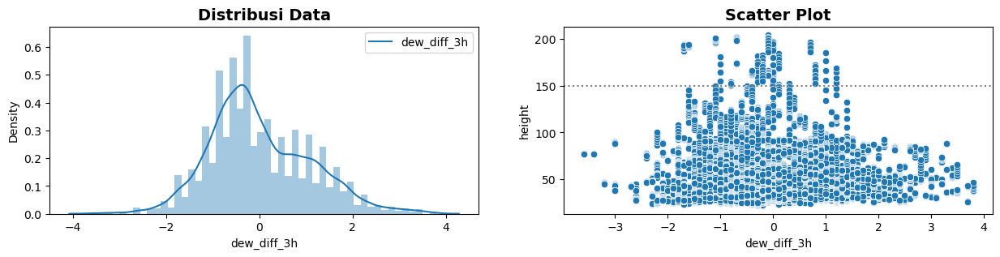

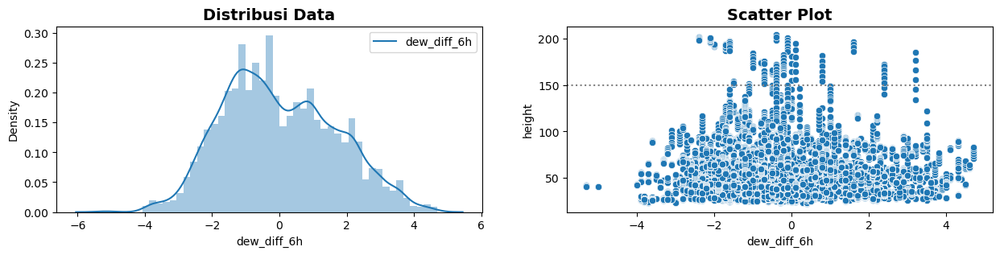

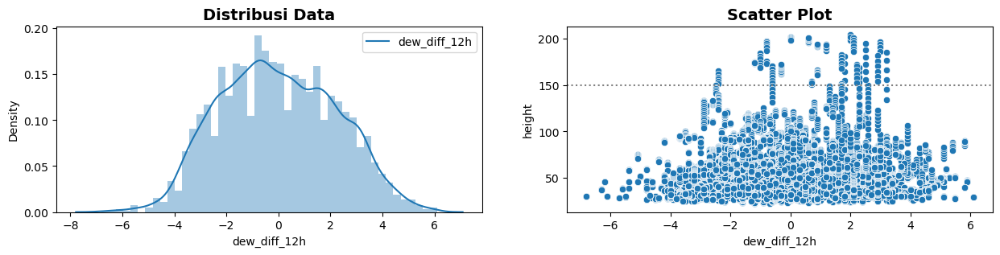

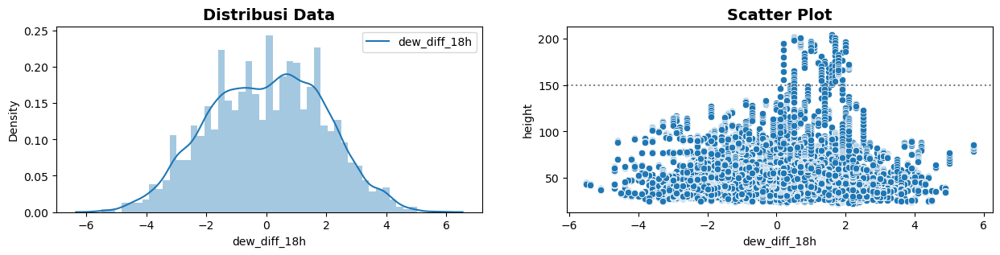

Persentase diff 3h : 81.60092139360783 %
Persentase diff 6h : 91.18917362510798 %
Persentase diff 12h: 77.06593723006047 %
Persentase diff 18h: 34.5090699683271 %


,count,mean,std,min,25%,50%,75%,max
dew_diff_3h,140.0,-0.258571,0.678338,-1.7,-0.7,-0.2,0.000,1.2
dew_diff_6h,140.0,-0.356429,1.349831,-2.4,-1.5,-0.4,0.000,3.2
dew_diff_12h,140.0,0.786429,1.503292,-2.4,-0.6,0.9,2.100,3.2
dew_diff_18h,140.0,1.312857,0.530080,0.2,0.8,1.4,1.725,2.1


In [13]:
c='dew'
plot_eda_dist_scatter(col=c+'_diff_3h')
plot_eda_dist_scatter(col=c+'_diff_6h')
plot_eda_dist_scatter(col=c+'_diff_12h')
plot_eda_dist_scatter(col=c+'_diff_18h')
col_info_diff(c)

#### **.humidity (%)**

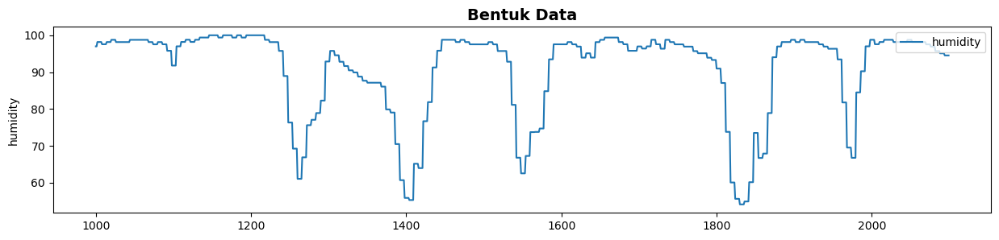

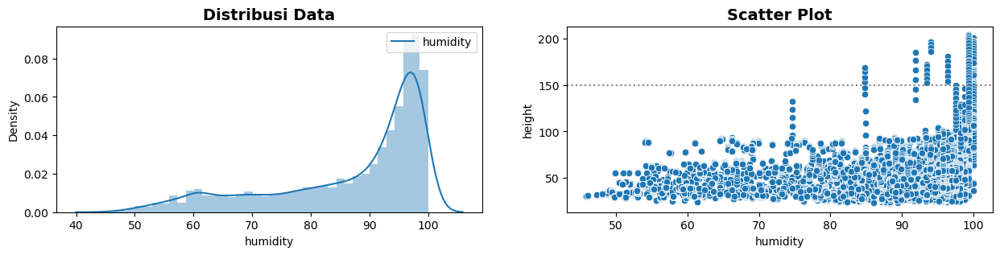

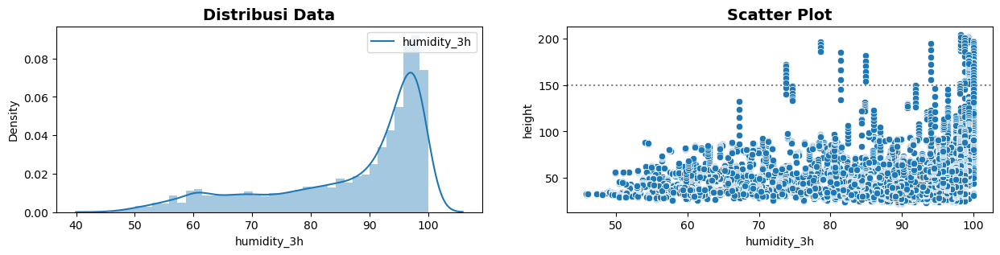

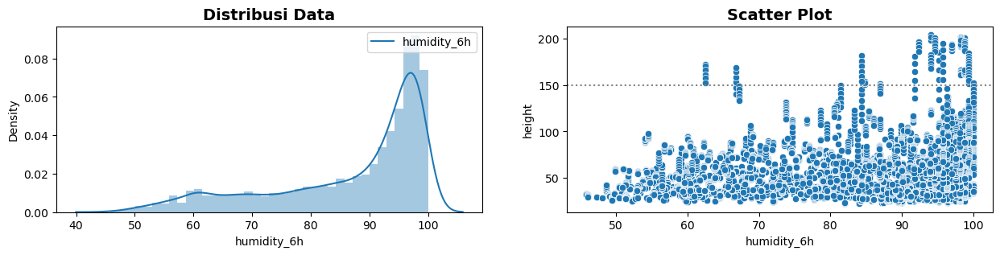

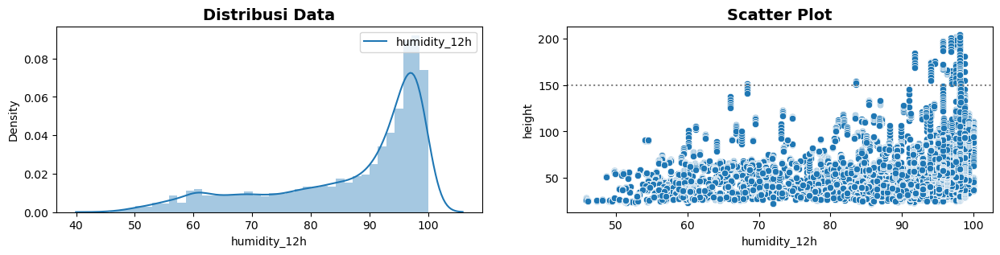

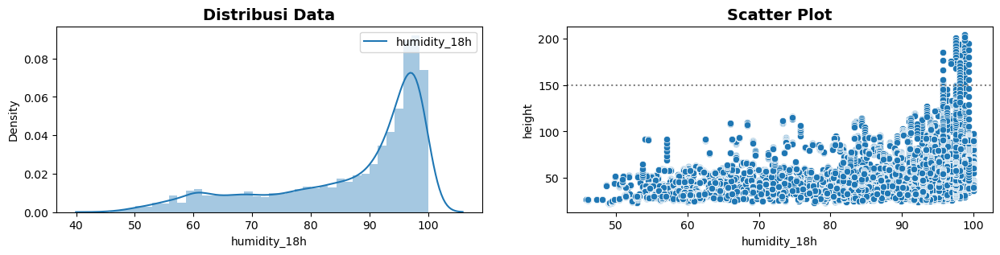

Persentase humidity  : 67.78001727613014 %
Persentase lag 3h : 80.99625683846818 %
Persentase lag 6h : 91.05960264900662 %
Persentase lag 12h: 77.49784048373164 %
Persentase lag 18h: 35.502447451770806 %


,count,mean,std,min,25%,50%,75%,max
humidity,140.0,98.360857,3.144444,84.83,99.3800,99.38,100.00,100.00
humidity_3h,140.0,95.202571,8.252113,73.73,98.1700,99.38,99.38,100.00
humidity_6h,140.0,93.729000,9.260984,62.54,94.0300,98.17,99.38,100.00
humidity_12h,140.0,96.091143,3.976052,68.37,95.7700,97.54,98.15,98.76
humidity_18h,140.0,98.026500,0.848243,95.70,97.9875,98.15,98.76,99.38


In [14]:
c='humidity'
plot_eda_grafik(col=c)
plot_eda_dist_scatter(col=c)
plot_eda_dist_scatter(col=c+'_3h')
plot_eda_dist_scatter(col=c+'_6h')
plot_eda_dist_scatter(col=c+'_12h')
plot_eda_dist_scatter(col=c+'_18h')
col_info_lag(c)

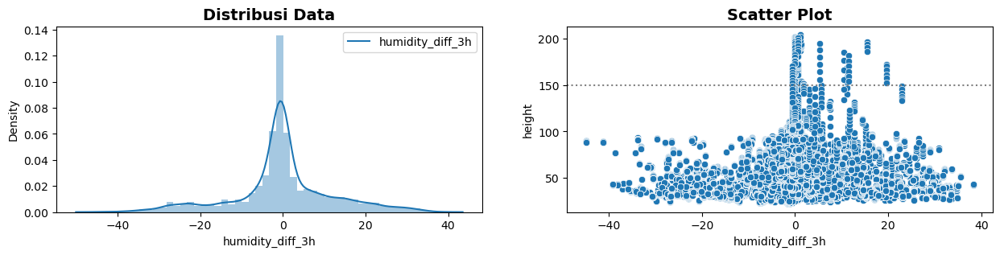

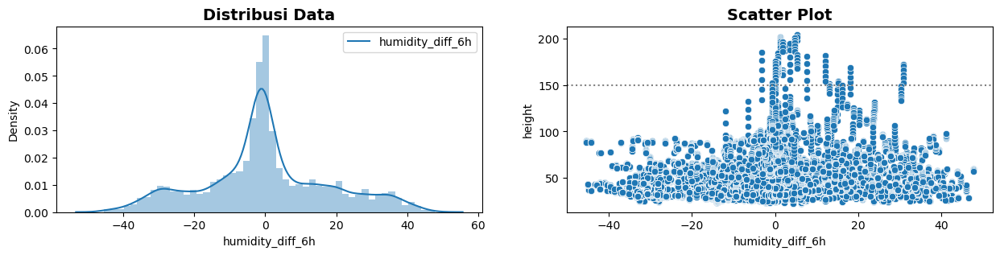

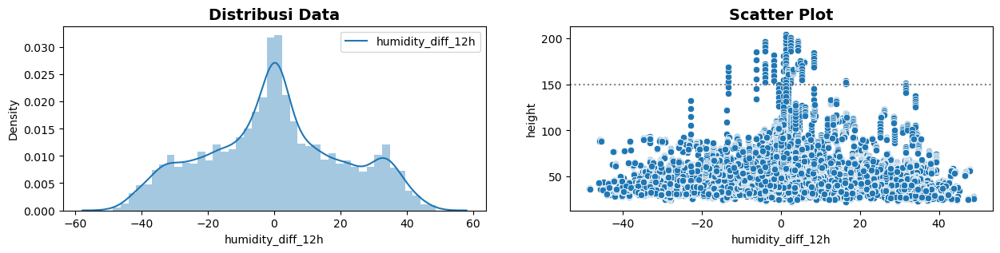

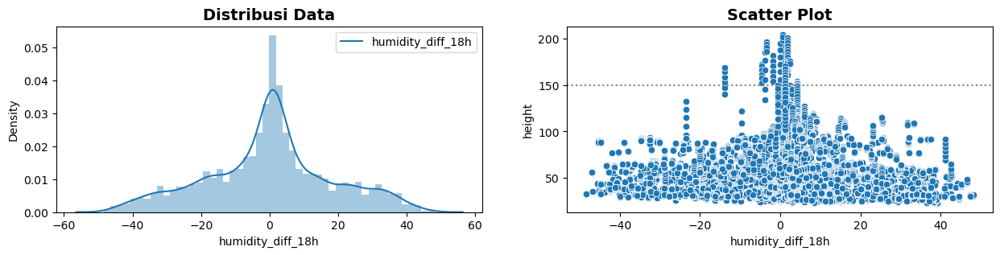

Persentase diff 3h : 50.66225165562914 %
Persentase diff 6h : 56.88165850849409 %
Persentase diff 12h: 64.79988482579903 %
Persentase diff 18h: 44.241289951050966 %


,count,mean,std,min,25%,50%,75%,max
humidity_diff_3h,140.0,3.158286,5.574438,-0.62,0.0000,0.61,1.23,19.69
humidity_diff_6h,140.0,4.631857,7.305082,-3.27,0.6175,1.78,5.34,30.93
humidity_diff_12h,140.0,2.269714,5.611590,-13.31,1.2300,1.85,4.23,31.63
humidity_diff_18h,140.0,0.334357,3.184289,-13.93,0.6200,1.24,1.85,4.30


In [15]:
c='humidity'
plot_eda_dist_scatter(col=c+'_diff_3h')
plot_eda_dist_scatter(col=c+'_diff_6h')
plot_eda_dist_scatter(col=c+'_diff_12h')
plot_eda_dist_scatter(col=c+'_diff_18h')
col_info_diff(c)

#### **.precip (mm)**

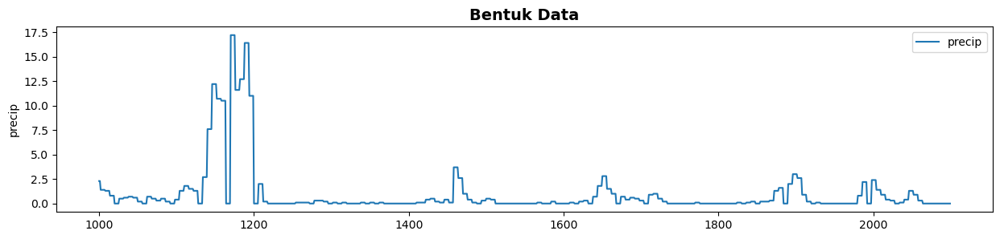

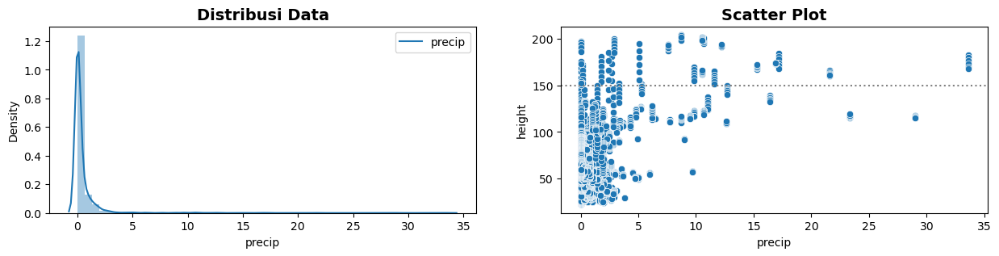

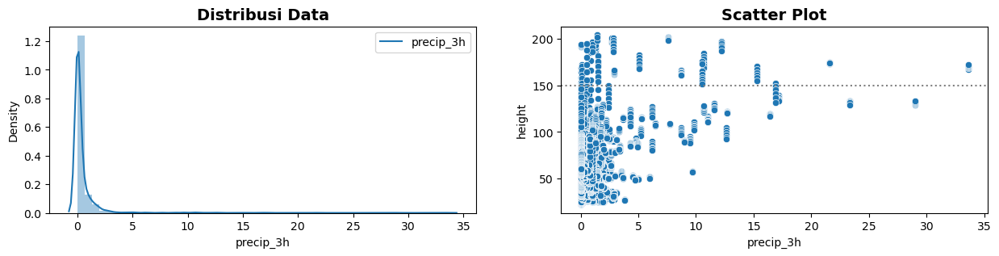

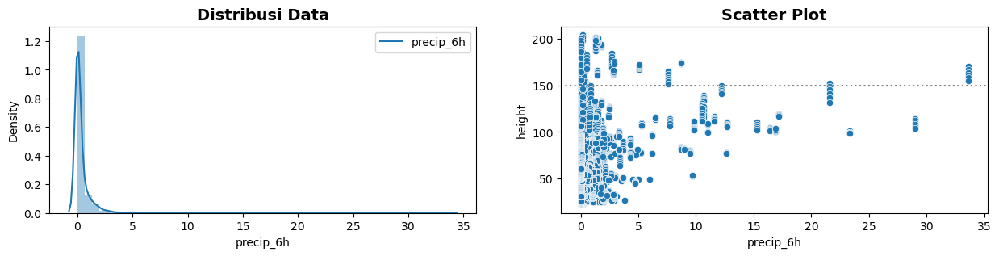

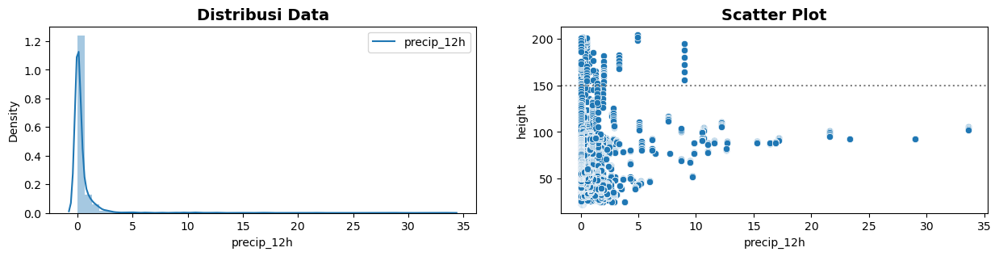

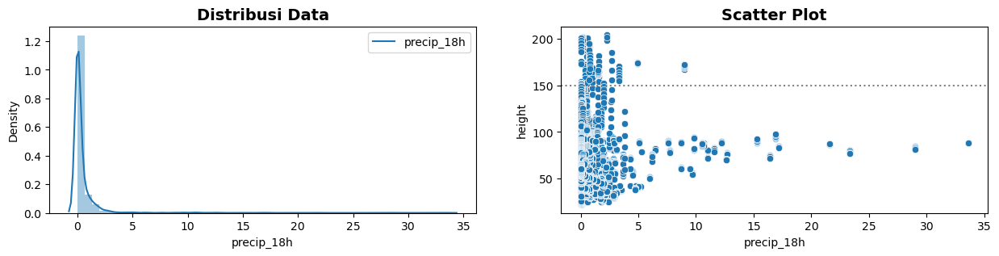

Persentase precip  : 100.0 %
Persentase lag 3h : 100.0 %
Persentase lag 6h : 100.0 %
Persentase lag 12h: 99.04981284192341 %
Persentase lag 18h: 99.04981284192341 %


,count,mean,std,min,25%,50%,75%,max
precip,140.0,8.615714,8.257870,0.0,1.8,8.7,12.200,33.6
precip_3h,140.0,6.651429,8.104013,0.0,1.0,2.8,10.500,33.6
precip_6h,140.0,3.248571,7.060524,0.0,0.0,1.3,2.800,33.6
precip_12h,140.0,1.157143,2.046585,0.0,0.0,0.4,1.300,9.0
precip_18h,140.0,1.390000,2.001521,0.0,0.2,0.7,1.525,9.0


In [16]:
c='precip'
plot_eda_grafik(col=c)
plot_eda_dist_scatter(col=c)
plot_eda_dist_scatter(col=c+'_3h')
plot_eda_dist_scatter(col=c+'_6h')
plot_eda_dist_scatter(col=c+'_12h')
plot_eda_dist_scatter(col=c+'_18h')
col_info_lag(c)

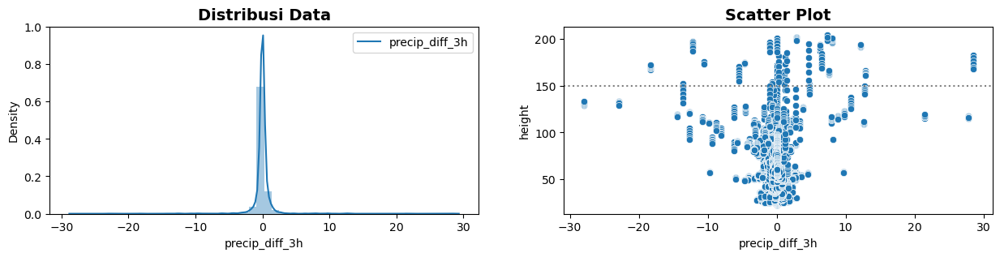

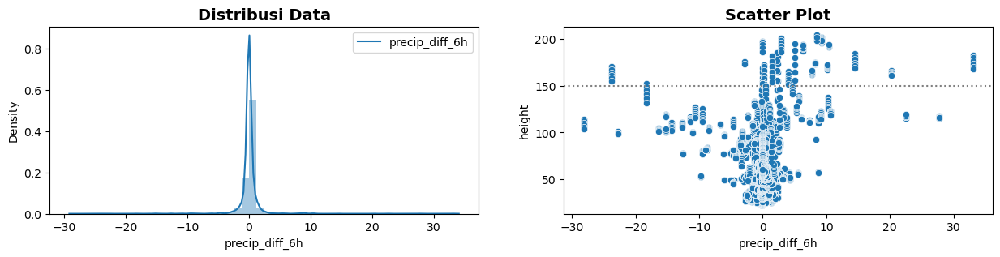

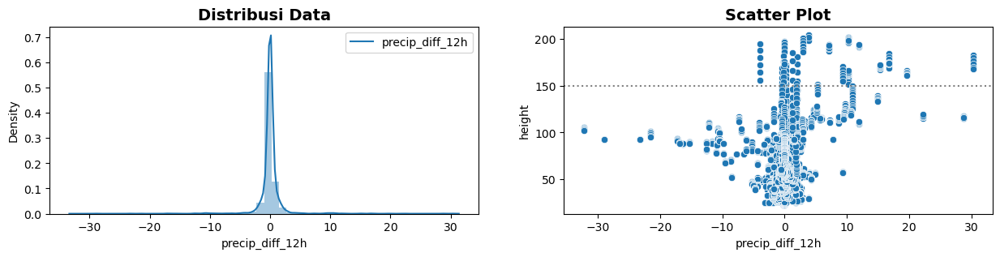

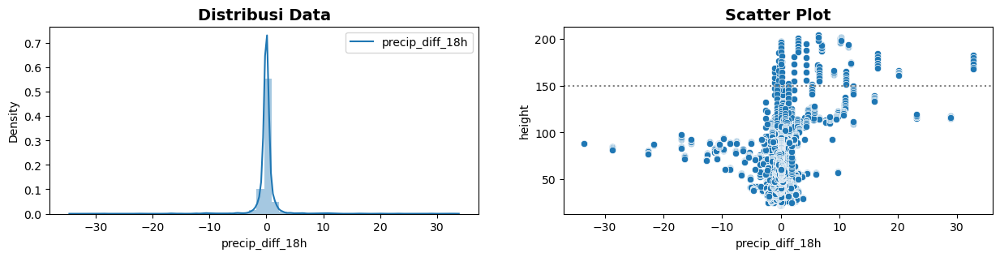

Persentase diff 3h : 99.91361934926577 %
Persentase diff 6h : 99.95680967463288 %
Persentase diff 12h: 98.31557731068241 %
Persentase diff 18h: 92.35531241002015 %


,count,mean,std,min,25%,50%,75%,max
precip_diff_3h,140.0,1.964286,9.315309,-18.3,-1.00,1.1,7.3,28.5
precip_diff_6h,140.0,5.367143,10.083496,-23.8,0.15,5.1,9.2,33.1
precip_diff_12h,140.0,7.458571,8.173232,-3.9,0.00,7.1,11.9,30.3
precip_diff_18h,140.0,7.225714,7.859571,-1.0,0.00,6.4,11.1,32.8


In [17]:
c='precip'
plot_eda_dist_scatter(col=c+'_diff_3h')
plot_eda_dist_scatter(col=c+'_diff_6h')
plot_eda_dist_scatter(col=c+'_diff_12h')
plot_eda_dist_scatter(col=c+'_diff_18h')
col_info_diff(c)

#### **.windgust (kph)**

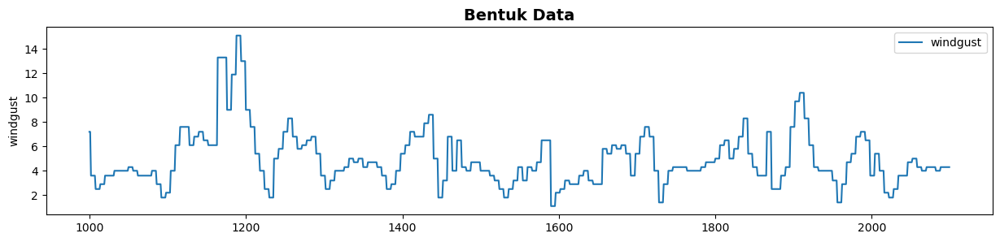

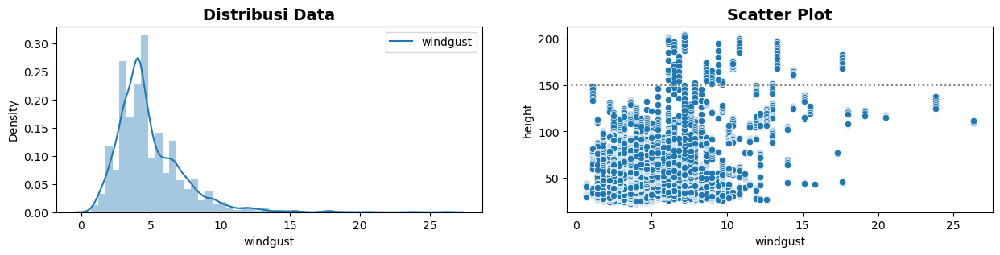

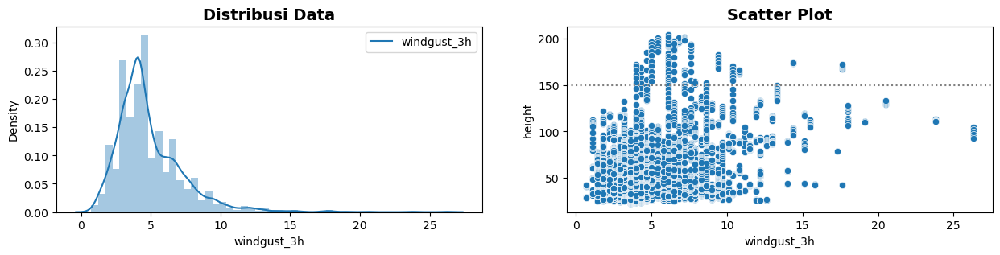

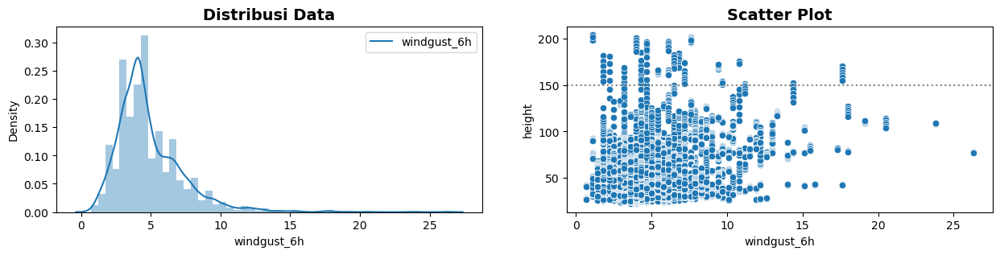

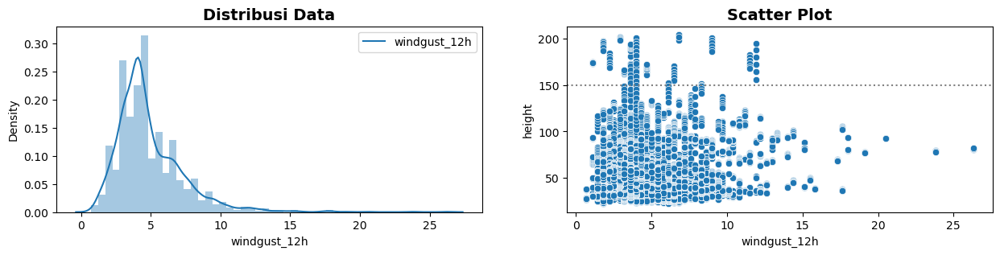

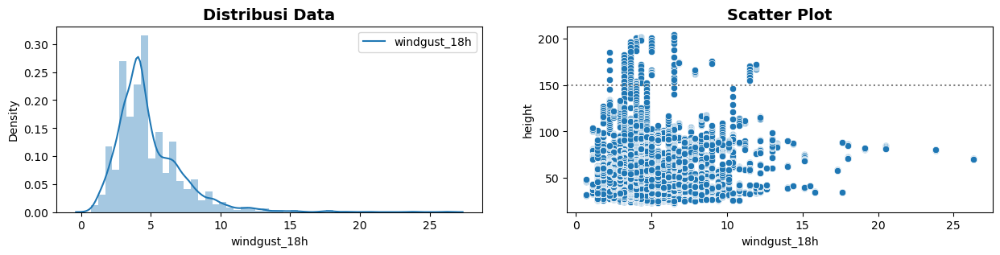

Persentase windgust  : 25.17995968902966 %
Persentase lag 3h : 65.05902677800172 %
Persentase lag 6h : 99.61128707169594 %
Persentase lag 12h: 98.22919665994817 %
Persentase lag 18h: 93.72300604664555 %


,count,mean,std,min,25%,50%,75%,max
windgust,140.0,9.039286,3.077154,6.1,6.5,8.6,10.4,17.6
windgust_3h,140.0,7.538571,3.127313,4.0,6.1,6.5,7.9,17.6
windgust_6h,140.0,6.404286,3.459631,1.1,4.3,6.1,7.6,17.6
windgust_12h,140.0,4.767143,2.690844,1.1,3.6,4.0,4.7,11.9
windgust_18h,140.0,5.380714,2.503376,2.2,3.6,4.3,6.5,11.9


In [18]:
c='windgust'
plot_eda_grafik(col=c)
plot_eda_dist_scatter(col=c)
plot_eda_dist_scatter(col=c+'_3h')
plot_eda_dist_scatter(col=c+'_6h')
plot_eda_dist_scatter(col=c+'_12h')
plot_eda_dist_scatter(col=c+'_18h')
col_info_lag(c)

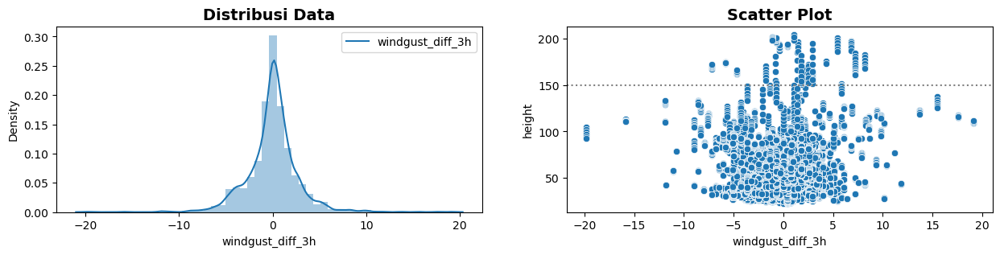

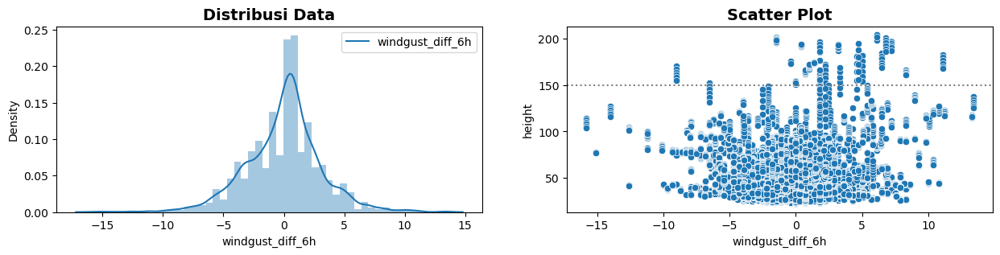

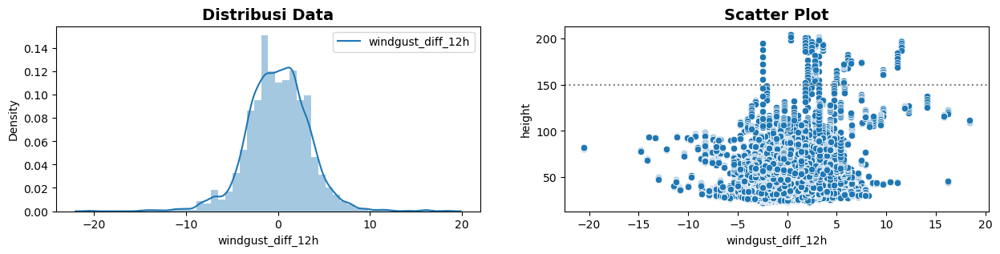

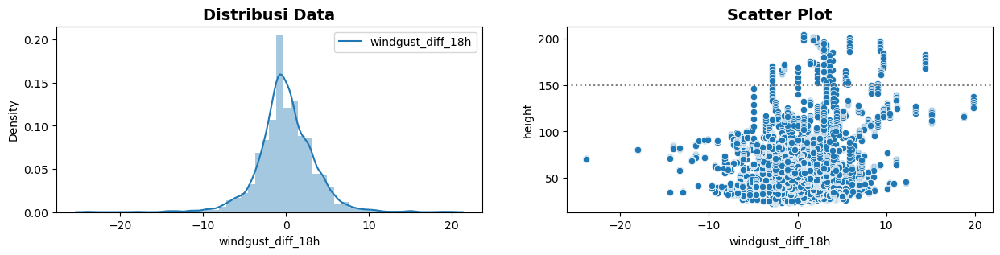

Persentase diff 3h : 98.40195796141664 %
Persentase diff 6h : 99.265764468759 %
Persentase diff 12h: 80.00287935502448 %
Persentase diff 18h: 86.69737978692773 %


,count,mean,std,min,25%,50%,75%,max
windgust_diff_3h,140.0,1.500714,3.989636,-7.2,-0.7,1.8,4.3,8.2
windgust_diff_6h,140.0,2.635000,4.137874,-9.0,0.4,1.8,6.1,11.1
windgust_diff_12h,140.0,4.272143,3.266795,-2.5,2.4,3.2,6.1,11.5
windgust_diff_18h,140.0,3.658571,3.995285,-2.9,1.8,2.9,5.7,14.4


In [19]:
c='windgust'
plot_eda_dist_scatter(col=c+'_diff_3h')
plot_eda_dist_scatter(col=c+'_diff_6h')
plot_eda_dist_scatter(col=c+'_diff_12h')
plot_eda_dist_scatter(col=c+'_diff_18h')
col_info_diff(c)

#### **.sealevelpressure (mbar)**

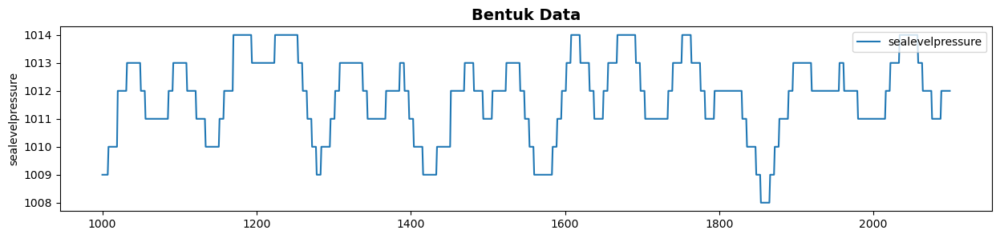

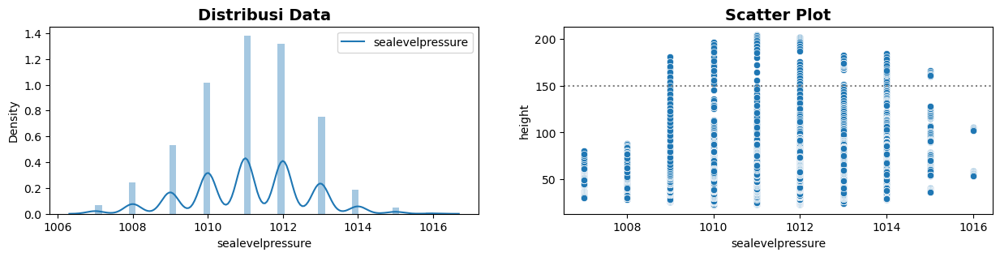

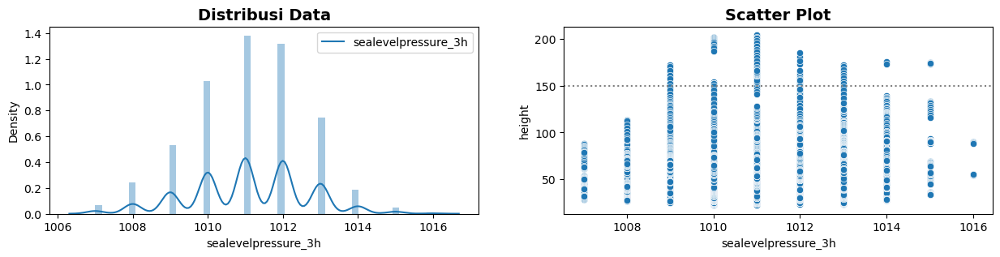

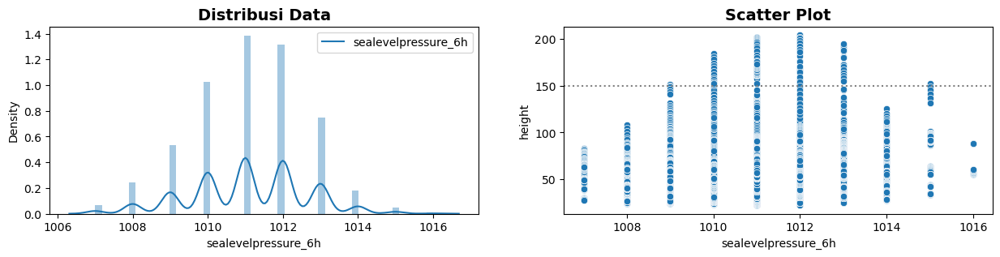

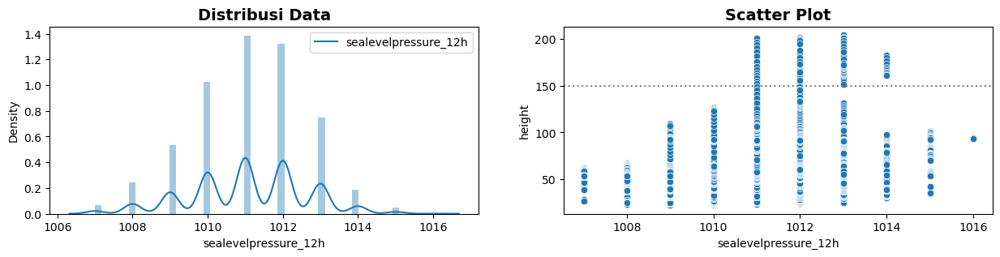

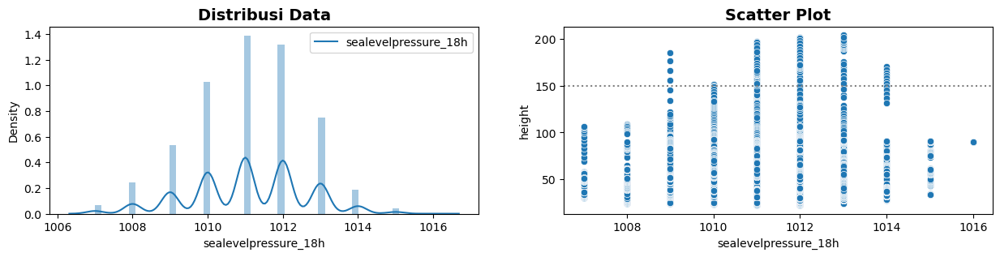

Persentase sealevelpressure  : 94.25568672617334 %
Persentase lag 3h : 94.25568672617334 %
Persentase lag 6h : 94.28448027641808 %
Persentase lag 12h: 65.53412035704002 %
Persentase lag 18h: 93.59343507054419 %


,count,mean,std,min,25%,50%,75%,max
sealevelpressure,140.0,1011.678571,1.637105,1009.0,1010.0,1012.0,1013.0,1015.0
sealevelpressure_3h,140.0,1011.271429,1.392905,1009.0,1011.0,1011.0,1012.0,1015.0
sealevelpressure_6h,140.0,1011.514286,0.978074,1009.0,1011.0,1011.0,1012.0,1015.0
sealevelpressure_12h,140.0,1012.178571,0.954112,1011.0,1011.0,1012.0,1013.0,1014.0
sealevelpressure_18h,140.0,1012.028571,1.059000,1009.0,1011.0,1012.0,1013.0,1014.0


In [20]:
c='sealevelpressure'
plot_eda_grafik(col=c)
plot_eda_dist_scatter(col=c)
plot_eda_dist_scatter(col=c+'_3h')
plot_eda_dist_scatter(col=c+'_6h')
plot_eda_dist_scatter(col=c+'_12h')
plot_eda_dist_scatter(col=c+'_18h')
col_info_lag(c)

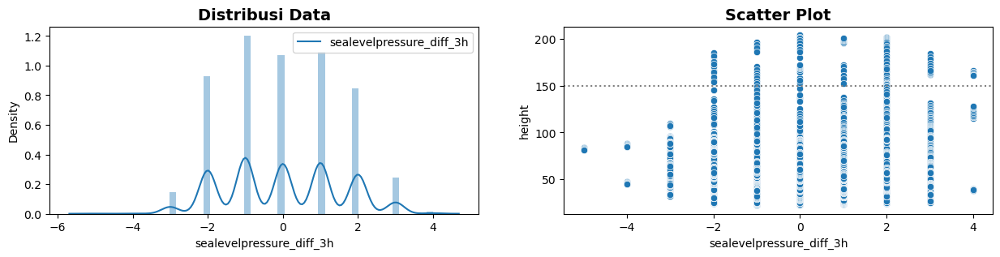

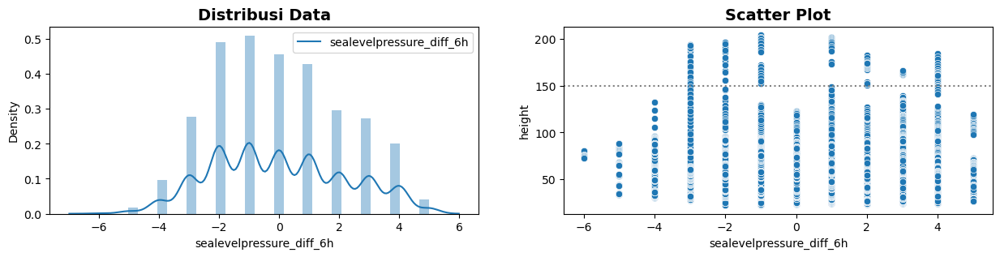

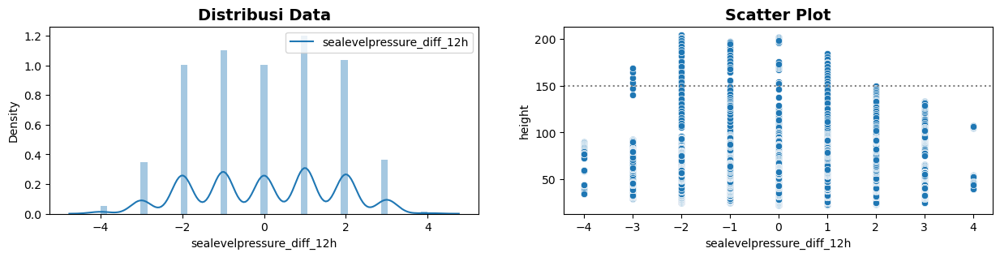

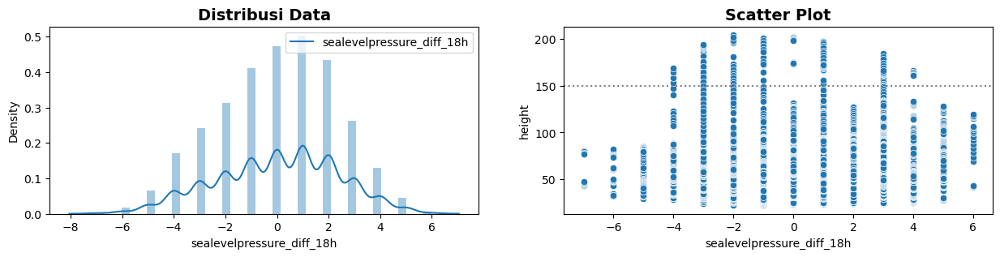

Persentase diff 3h : 97.23581917650446 %
Persentase diff 6h : 94.86035128131299 %
Persentase diff 12h: 76.07255974661675 %
Persentase diff 18h: 95.50820616181976 %


,count,mean,std,min,25%,50%,75%,max
sealevelpressure_diff_3h,140.0,0.407143,1.790850,-2.0,-1.0,0.0,2.0,4.0
sealevelpressure_diff_6h,140.0,0.164286,2.361595,-3.0,-2.0,-1.0,2.0,4.0
sealevelpressure_diff_12h,140.0,-0.500000,1.172220,-3.0,-1.0,-1.0,1.0,1.0
sealevelpressure_diff_18h,140.0,-0.350000,2.201781,-4.0,-2.0,-1.0,1.0,4.0


In [21]:
c='sealevelpressure'
plot_eda_dist_scatter(col=c+'_diff_3h')
plot_eda_dist_scatter(col=c+'_diff_6h')
plot_eda_dist_scatter(col=c+'_diff_12h')
plot_eda_dist_scatter(col=c+'_diff_18h')
col_info_diff(c)

#### **.cloudcover (%)**

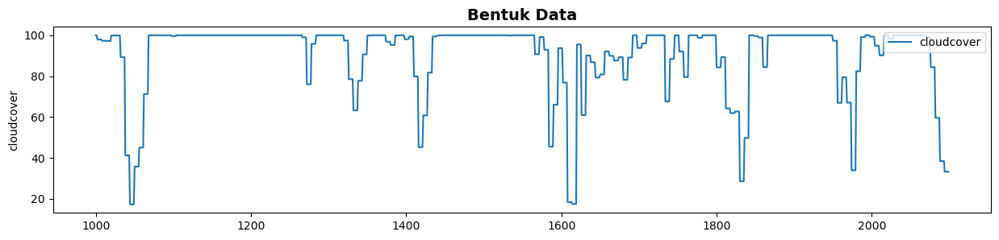

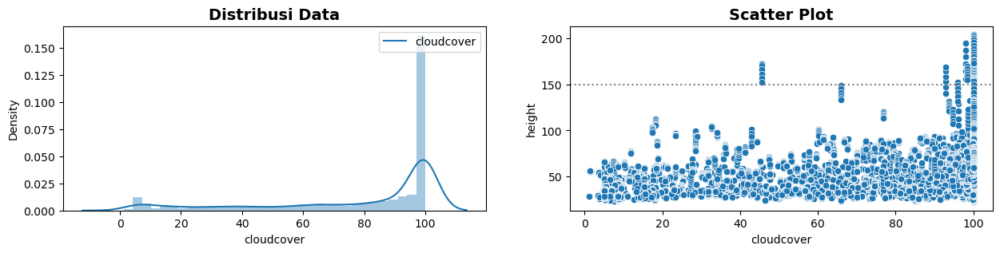

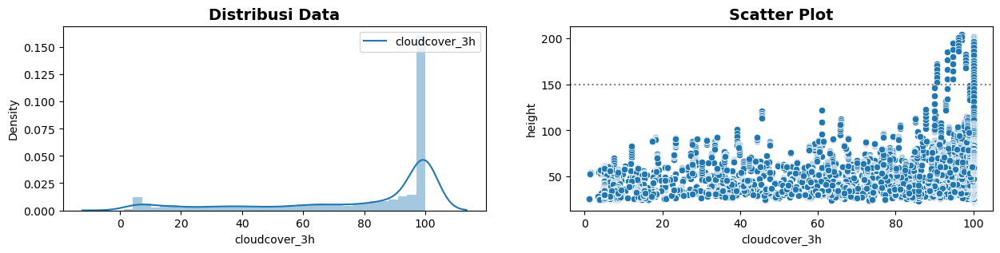

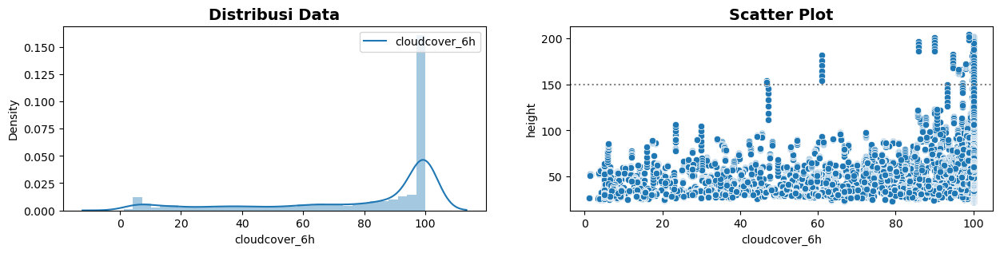

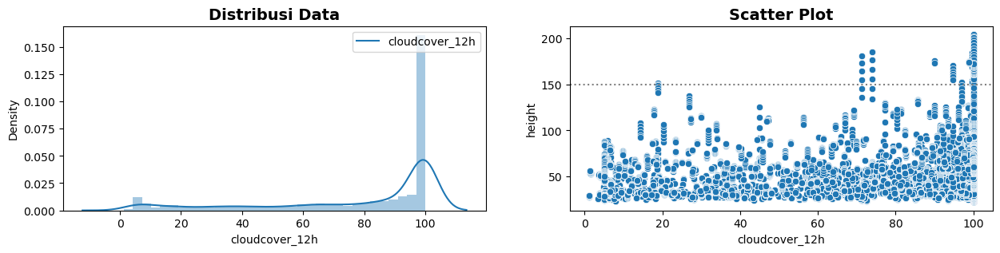

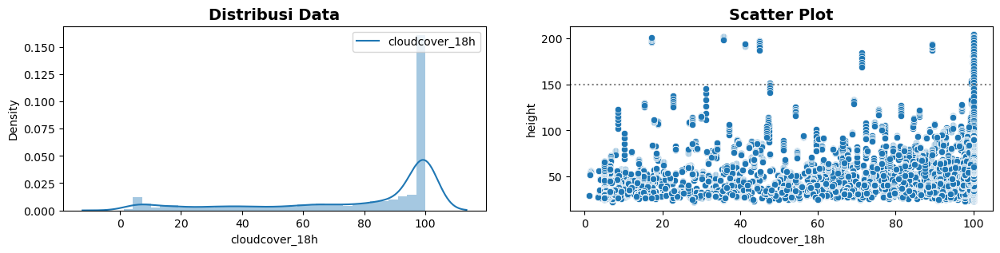

Persentase cloudcover  : 81.90325367117765 %
Persentase lag 3h : 56.809674632882235 %
Persentase lag 6h : 81.42816009213935 %
Persentase lag 12h: 90.88684134753815 %
Persentase lag 18h: 91.92340915634898 %


,count,mean,std,min,25%,50%,75%,max
cloudcover,140.0,97.282857,11.073021,45.5,100.0,100.0,100.0,100.0
cloudcover_3h,140.0,98.798571,2.457729,90.7,100.0,100.0,100.0,100.0
cloudcover_6h,140.0,94.325000,13.062711,46.9,96.1,100.0,100.0,100.0
cloudcover_12h,140.0,97.097857,9.374851,18.9,99.7,100.0,100.0,100.0
cloudcover_18h,140.0,86.723571,25.241395,17.2,89.3,100.0,100.0,100.0


In [22]:
c='cloudcover'
plot_eda_grafik(col=c)
plot_eda_dist_scatter(col=c)
plot_eda_dist_scatter(col=c+'_3h')
plot_eda_dist_scatter(col=c+'_6h')
plot_eda_dist_scatter(col=c+'_12h')
plot_eda_dist_scatter(col=c+'_18h')
col_info_lag(c)

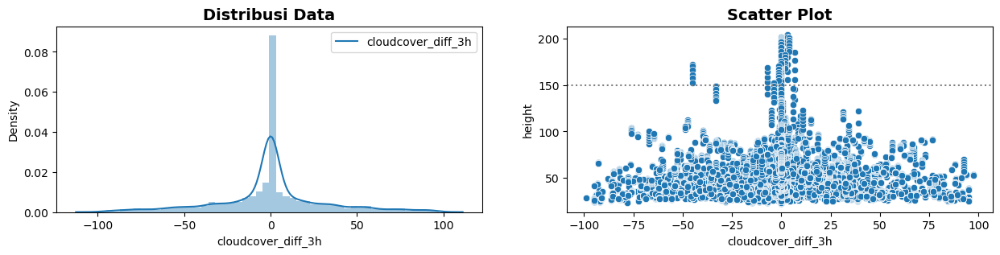

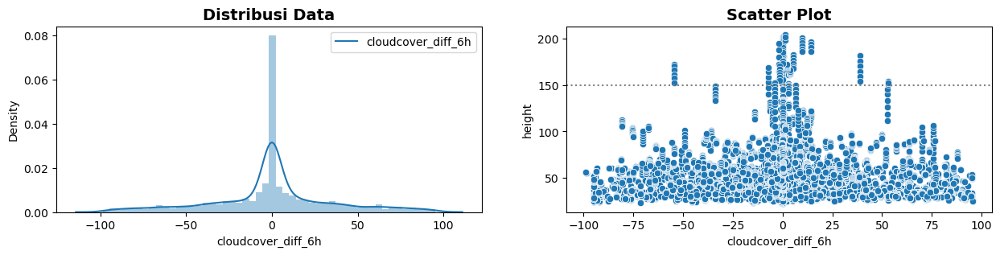

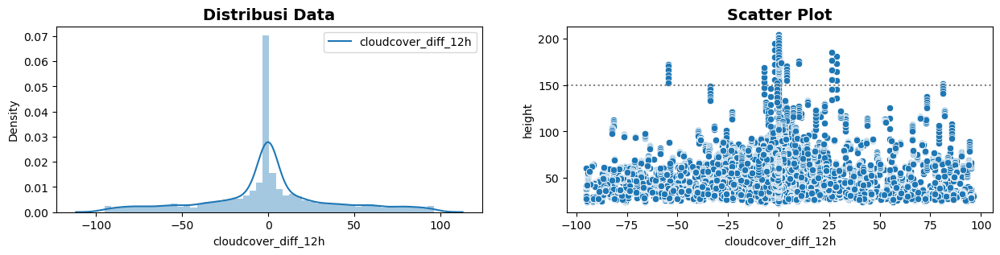

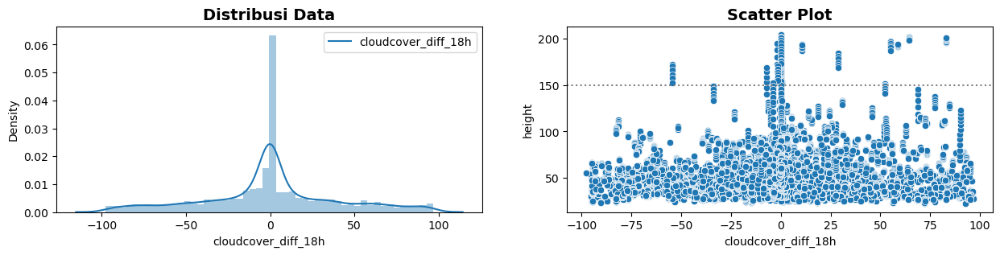

Persentase diff 3h : 65.40454938093868 %
Persentase diff 6h : 84.14915059026778 %
Persentase diff 12h: 87.64756694500431 %
Persentase diff 18h: 86.91333141376332 %


,count,mean,std,min,25%,50%,75%,max
cloudcover_diff_3h,140.0,-1.515714,9.516100,-45.2,0.0,0.0,0.0,6.8
cloudcover_diff_6h,140.0,2.957857,18.008543,-54.5,0.0,0.0,3.9,53.1
cloudcover_diff_12h,140.0,0.185000,15.017495,-54.5,0.0,0.0,0.3,81.1
cloudcover_diff_18h,140.0,10.559286,28.851460,-54.5,0.0,0.0,10.7,82.8


In [23]:
c='cloudcover'
plot_eda_dist_scatter(col=c+'_diff_3h')
plot_eda_dist_scatter(col=c+'_diff_6h')
plot_eda_dist_scatter(col=c+'_diff_12h')
plot_eda_dist_scatter(col=c+'_diff_18h')
col_info_diff(c)

#### **.visibility (km)**

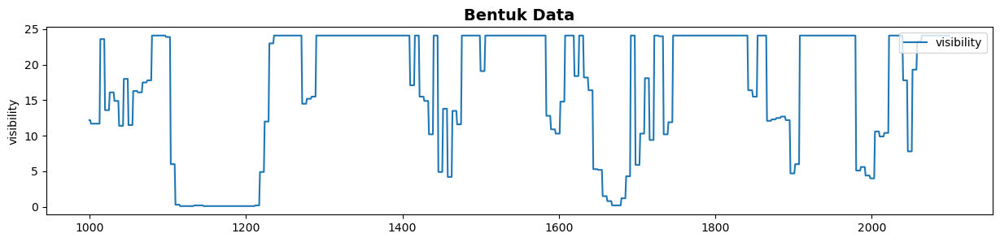

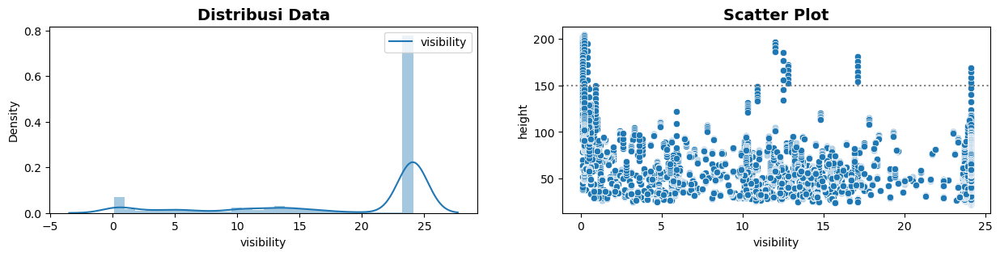

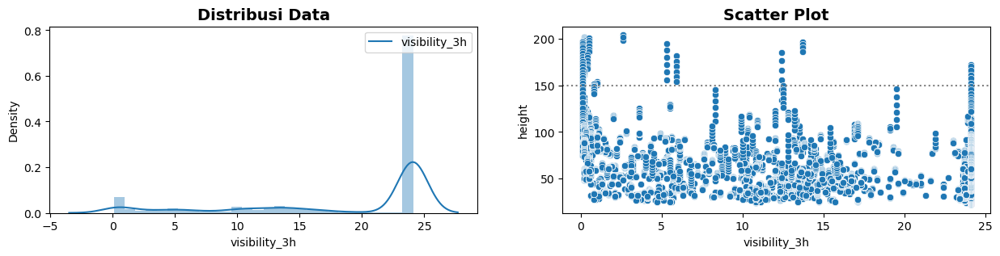

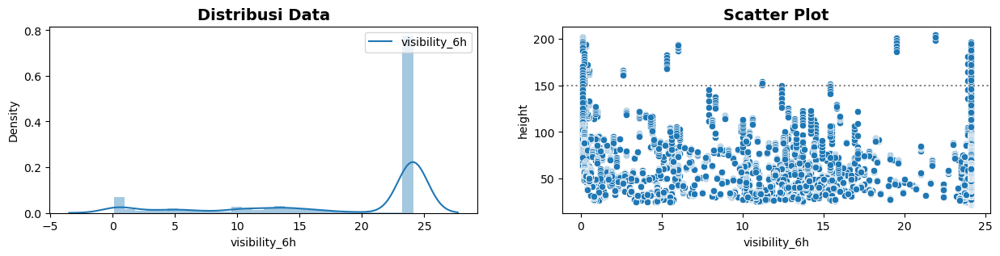

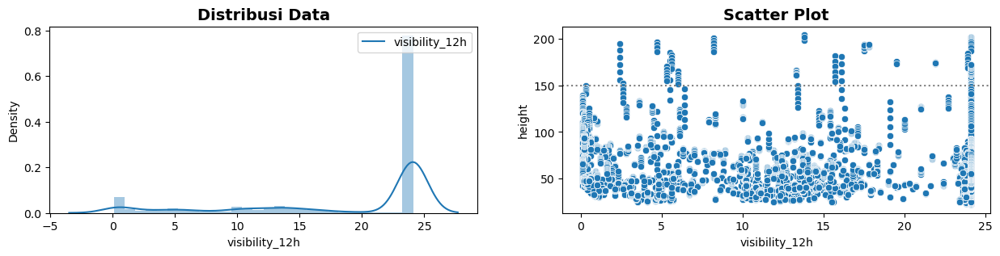

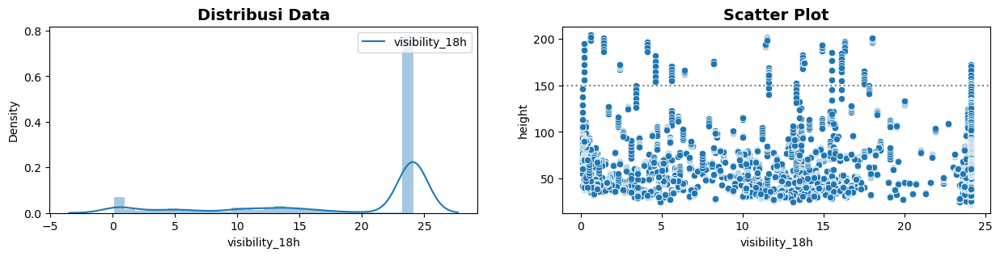

Persentase visibility  : 100.0 %
Persentase lag 3h : 100.0 %
Persentase lag 6h : 100.0 %
Persentase lag 12h: 91.96659948171609 %
Persentase lag 18h: 98.01324503311258 %


,count,mean,std,min,25%,50%,75%,max
visibility,140.0,2.952143,6.193725,0.1,0.10,0.1,0.2,24.1
visibility_3h,140.0,3.417857,6.754932,0.1,0.10,0.2,2.6,24.1
visibility_6h,140.0,9.255000,10.545321,0.1,0.20,2.6,23.9,24.1
visibility_12h,140.0,16.252143,7.881902,2.4,7.65,17.8,24.1,24.1
visibility_18h,140.0,11.208571,6.943383,0.2,4.60,11.6,16.1,24.1


In [24]:
c='visibility'
plot_eda_grafik(col=c)
plot_eda_dist_scatter(col=c)
plot_eda_dist_scatter(col=c+'_3h')
plot_eda_dist_scatter(col=c+'_6h')
plot_eda_dist_scatter(col=c+'_12h')
plot_eda_dist_scatter(col=c+'_18h')
col_info_lag(c)

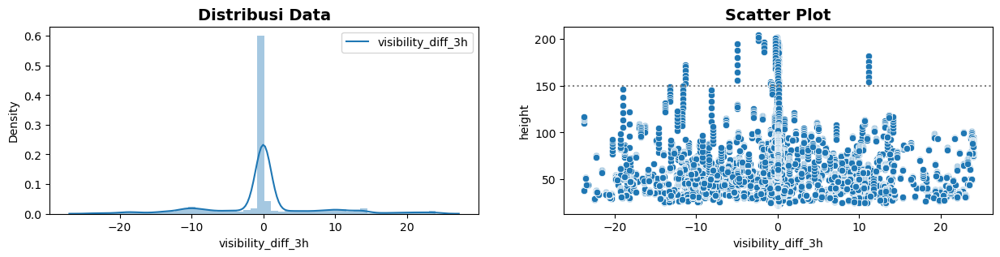

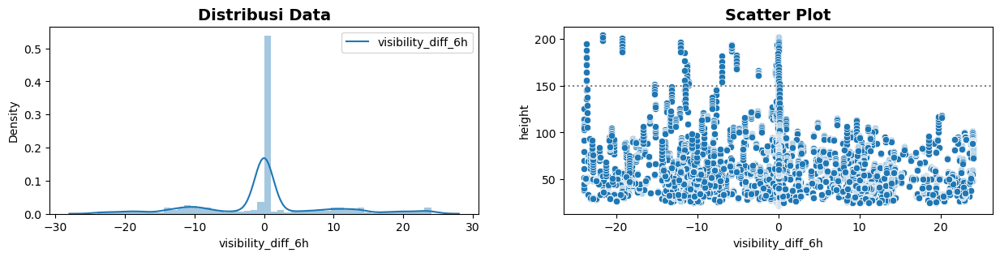

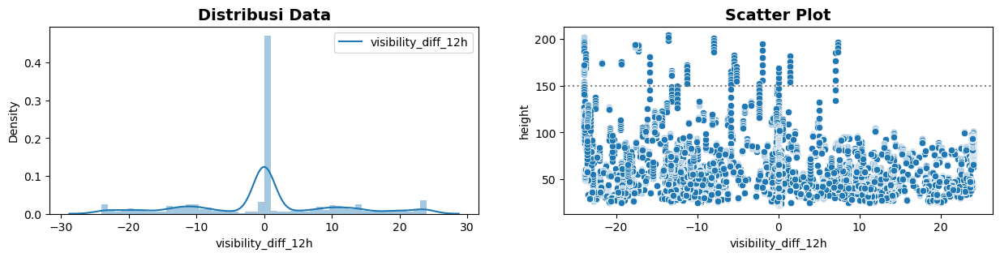

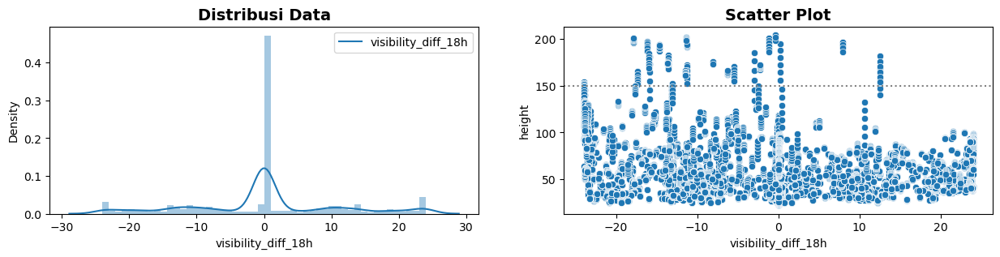

Persentase diff 3h : 86.48142816009215 %
Persentase diff 6h : 75.94298877051541 %
Persentase diff 12h: 78.5200115174201 %
Persentase diff 18h: 86.74057011229485 %


,count,mean,std,min,25%,50%,75%,max
visibility_diff_3h,140.0,-0.465714,3.488105,-11.3,-0.3,0.0,0.0,11.2
visibility_diff_6h,140.0,-6.302857,8.032891,-23.7,-11.3,-0.4,-0.1,0.1
visibility_diff_12h,140.0,-13.300000,10.092222,-24.0,-24.0,-15.9,-5.5,7.3
visibility_diff_18h,140.0,-8.256429,9.286303,-24.0,-15.0,-11.3,-2.3,12.5


In [25]:
c='visibility'
plot_eda_dist_scatter(col=c+'_diff_3h')
plot_eda_dist_scatter(col=c+'_diff_6h')
plot_eda_dist_scatter(col=c+'_diff_12h')
plot_eda_dist_scatter(col=c+'_diff_18h')
col_info_diff(c)

**Kesimpulan:**

- Dari analisis di atas, dipilih beberapa fitur dengan persentase < 70%
- Dari fitur yang terpilih masih ada beberapa yang distribusiya tidak normal, dalam beberapa kasus bentuk distribusi dapat memengaruhi model dalam menangkap pola data, jadi sebaiknya data dalam bentuk normal

### Cek Korelasi (2)

<AxesSubplot: >

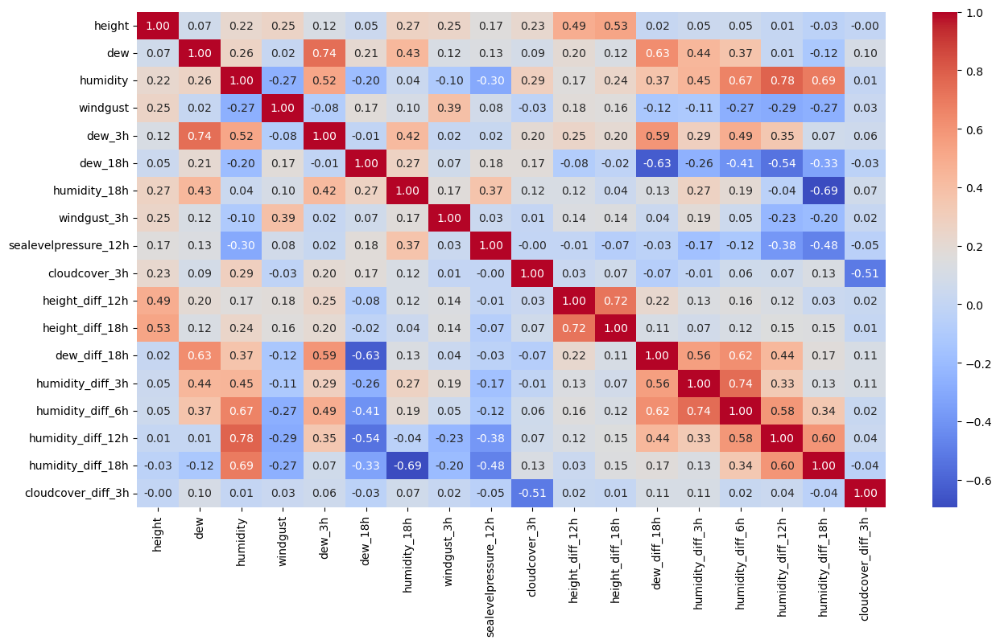

In [26]:
NUMS=data[['height','dew','humidity','windgust',
           'dew_3h','dew_18h','humidity_18h','windgust_3h','sealevelpressure_12h','cloudcover_3h', 
           'height_diff_12h','height_diff_18h','dew_diff_18h','humidity_diff_3h','humidity_diff_6h','humidity_diff_12h','humidity_diff_18h','cloudcover_diff_3h']]

plt.figure(figsize=(15,8))
sns.heatmap(NUMS.corr(), annot=True, cmap='coolwarm', fmt='.2f')
#plt.savefig('corr.png')

Memilih fitur yang tidak redundan, korelasi antar fitur < 0.5 dan korelasi dengan target > 0.2

<AxesSubplot: >

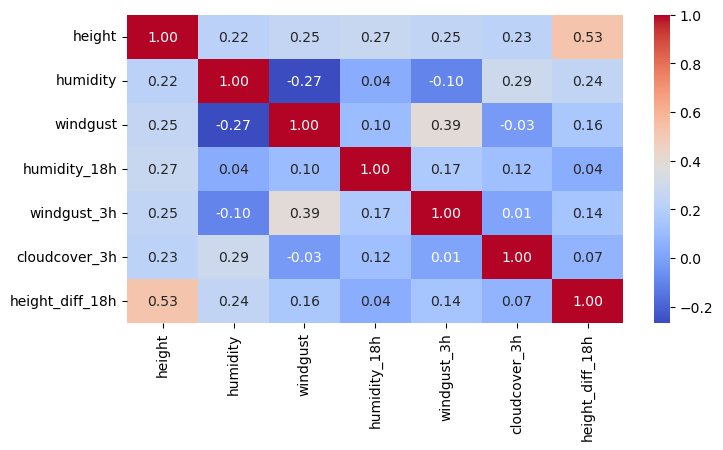

In [28]:
NUMS=data[['height','humidity','windgust',
           'humidity_18h','windgust_3h','cloudcover_3h', 
           'height_diff_18h']]

plt.figure(figsize=(8,4))
sns.heatmap(NUMS.corr(), annot=True, cmap='coolwarm', fmt='.2f')
#plt.savefig('corr.png')

- 'humidity' dan'humidity_18h'memiliki sebaran data yang mirip,begitupun dengan 'windgust'dan'windgust_3h'. jadi diplih salah satu

## - DATA PREPROCESSING

### Feature Selection

In [6]:
# Membagi fitur/prediktor dan label 
X = data[['height','windgust','cloudcover_3h','humidity_18h','height_diff_18h']]
y = data[['height']]

In [10]:
X.head()

,height,windgust,cloudcover_3h,humidity_18h,height_diff_18h
0,42.240000,2.9,64.3,93.32,18.717250
1,42.139333,2.9,64.3,93.32,17.694119
2,41.734667,2.9,64.3,93.32,16.366988
3,41.364000,2.9,64.3,93.32,15.073857
4,41.330000,2.9,64.3,93.32,14.117393


In [11]:
y.head()

,height
0,42.240000
1,42.139333
2,41.734667
3,41.364000
4,41.330000


### Split Dataset

train | val | test 

70% | 15% | 15%

In [7]:
# split data train|val|test
train_end = int(len(X)*0.7)
val_end = int(len(X)*0.85)

X_train = X[:train_end] 
y_train = y[:train_end] 
X_val = X[train_end:val_end] 
y_val = y[train_end:val_end] 
X_test = X[val_end:] 
y_test = y[val_end:] 

X_train.shape, y_train.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape

((9724, 5), (9724, 1), (2084, 5), (2084, 1), (2084, 5), (2084, 1))

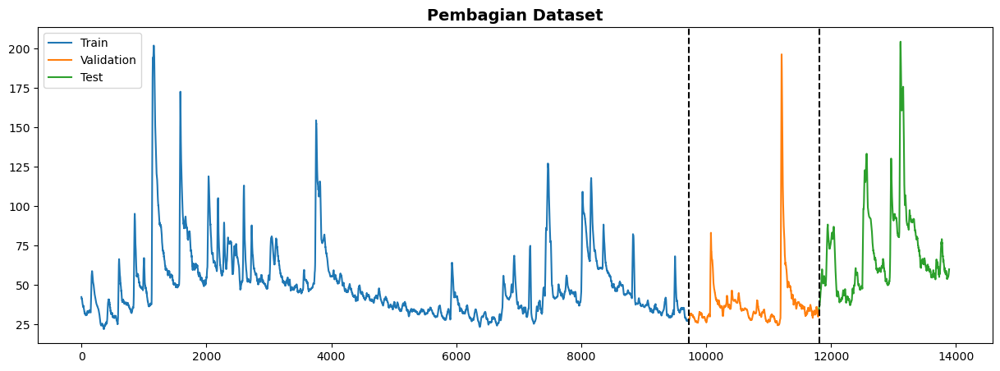

In [13]:
# bentuk pembagian data
plt.figure(figsize=(15, 5))
plt.plot(y_train)
plt.plot(y_val)
plt.plot(y_test)
plt.title('Pembagian Dataset', fontweight='bold',fontsize= 14)
plt.axvline(X_train.shape[0], color='black', linestyle='--')
plt.axvline(X_train.shape[0]+X_val.shape[0], color='black', linestyle='--')
plt.legend(['Train', 'Validation', 'Test'])

### Scaling

GRU bisa mengatasi data yang tidak terdistribusi normal, jadi hanya dilakukan scaling saja agar lebih mudah untuk mengevaluasi hasil prediksi model

In [8]:
# scaling/normalisasi data
'''
  fit hanya pada data train 
  agar tidak terjadi data leakage/kebocoran data
'''
# X
scaler_X = MinMaxScaler().fit(X_train)
X_train = scaler_X.transform(X_train)
X_val = scaler_X.transform(X_val)
X_test = scaler_X.transform(X_test)

# y
scaler_y = MinMaxScaler().fit(y_train)
y_train = scaler_y.transform(y_train)
y_val = scaler_y.transform(y_val)
y_test = scaler_y.transform(y_test)

# reshape 
y_train = y_train.reshape(-1)
y_val = y_val.reshape(-1)
y_test = y_test.reshape(-1)

In [15]:
X_train[:10]

array([[0.1125833 , 0.0859375 , 0.63866397, 0.87661618, 0.48567867],
       [0.11202397, 0.0859375 , 0.63866397, 0.87661618, 0.48193766],
       [0.10977557, 0.0859375 , 0.63866397, 0.87661618, 0.4770851 ],
       [0.10771607, 0.0859375 , 0.63866397, 0.87661618, 0.47235685],
       [0.10752716, 0.0859375 , 0.63866397, 0.87661618, 0.46885961],
       [0.10696413, 0.0859375 , 0.63866397, 0.87661618, 0.46511616],
       [0.10546766, 0.05859375, 0.38967611, 0.85519025, 0.46075843],
       [0.10696784, 0.05859375, 0.38967611, 0.85519025, 0.45837274],
       [0.10603069, 0.05859375, 0.38967611, 0.85519025, 0.45380951],
       [0.10528246, 0.05859375, 0.38967611, 0.85519025, 0.44789097]])

In [16]:
y_train[:10]

array([0.1125833 , 0.11202397, 0.10977557, 0.10771607, 0.10752716,
       0.10696413, 0.10546766, 0.10696784, 0.10603069, 0.10528246])

**Save scaler:**

In [17]:
import joblib

joblib.dump(scaler_X, 'scaler/scaler_X_prediksi.save') 
joblib.dump(scaler_y, 'scaler/scaler_y_prediksi.save') 

['scaler/scaler_y_prediksi.save']

### Windowing

In [9]:
# fungsi window
def create_window(data, window_size, future_size, label):
    X_window = []
    y_window = []

    for i in range(len(data) - window_size - future_size):
        X_window.append(data[i:i+window_size])
        y_window.append(label[i+window_size:i+window_size+future_size])

    return np.array(X_window), np.array(y_window)

#### (1) 24 jam - 6 jam

In [20]:
# window (1)
window_size_1 = 144
future_size_1 = 36

X_train_window_1, y_train_window_1 = create_window(X_train, window_size_1, future_size_1, y_train)
X_val_window_1, y_val_window_1 = create_window(X_val, window_size_1, future_size_1, y_val)
X_test_window_1, y_test_window_1 = create_window(X_test, window_size_1, future_size_1, y_test)

print(X_train_window_1.shape, y_train_window_1.shape)
print(X_val_window_1.shape, y_val_window_1.shape)
print(X_test_window_1.shape, y_test_window_1.shape)

(9544, 144, 5) (9544, 36)
(1904, 144, 5) (1904, 36)
(1904, 144, 5) (1904, 36)


#### (2) 24 jam - 12 jam

In [21]:
# window (2)
window_size_2 = 144
future_size_2 = 72

X_train_window_2, y_train_window_2 = create_window(X_train, window_size_2, future_size_2, y_train)
X_val_window_2, y_val_window_2 = create_window(X_val, window_size_2, future_size_2, y_val)
X_test_window_2, y_test_window_2 = create_window(X_test, window_size_2, future_size_2, y_test)

print(X_train_window_2.shape, y_train_window_2.shape)
print(X_val_window_2.shape, y_val_window_2.shape)
print(X_test_window_2.shape, y_test_window_2.shape)

(9508, 144, 5) (9508, 72)
(1868, 144, 5) (1868, 72)
(1868, 144, 5) (1868, 72)


#### (3) 48 jam - 6 jam

In [10]:
# window (3)
window_size_3 = 288 #288
future_size_3 = 36

X_train_window_3, y_train_window_3 = create_window(X_train, window_size_3, future_size_3, y_train)
X_val_window_3, y_val_window_3 = create_window(X_val, window_size_3, future_size_3, y_val)
X_test_window_3, y_test_window_3 = create_window(X_test, window_size_3, future_size_3, y_test)

print(X_train_window_3.shape, y_train_window_3.shape)
print(X_val_window_3.shape, y_val_window_3.shape)
print(X_test_window_3.shape, y_test_window_3.shape)

(9400, 288, 5) (9400, 36)
(1760, 288, 5) (1760, 36)
(1760, 288, 5) (1760, 36)


#### (4) 48 jam - 12 jam

In [23]:
# window (4)
window_size_4 = 288
future_size_4 = 72

X_train_window_4, y_train_window_4 = create_window(X_train, window_size_4, future_size_4, y_train)
X_val_window_4, y_val_window_4 = create_window(X_val, window_size_4, future_size_4, y_val)
X_test_window_4, y_test_window_4 = create_window(X_test, window_size_4, future_size_4, y_test)

print(X_train_window_4.shape, y_train_window_4.shape)
print(X_val_window_4.shape, y_val_window_4.shape)
print(X_test_window_4.shape, y_test_window_4.shape)

(9364, 288, 5) (9364, 72)
(1724, 288, 5) (1724, 72)
(1724, 288, 5) (1724, 72)


## - MODELING & RESULT

In [11]:
from tensorflow.keras.losses import MeanAbsoluteError, MeanSquaredError, MeanSquaredLogarithmicError
from tensorflow.keras.metrics import MeanAbsoluteError, MeanSquaredError, MeanSquaredLogarithmicError, RootMeanSquaredError
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense
from tensorflow.keras.initializers import GlorotNormal, Zeros

# Define a learning rate schedule function
def lr_schedule(epoch):
    if epoch <= 25:
        return 0.0001
    else:
        return 0.00001

def plot_loss(history, model_name):
    plt.figure(figsize = (6, 4))
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Train vs Validation (Loss) for ' + model_name,  fontsize= 12)
    plt.ylabel('Loss (MSE)')
    plt.xlabel('Epoch')
    plt.legend(['Train loss', 'Validation loss'], loc='upper right')
    
def plot_mae(history, model_name):
    plt.figure(figsize = (6, 4))
    plt.plot(history.history['mean_absolute_error'])
    plt.plot(history.history['val_mean_absolute_error'])
    plt.title('Train vs Validation (MAE) for ' + model_name,  fontsize= 12)
    plt.ylabel('MAE')
    plt.xlabel('Epoch')
    plt.legend(['Train mae', 'Validation mae'], loc='upper right')

def create_time_steps(length):
    return list(range(-length, 0))

def plot_pred0(history, true_future, prediction):
    plt.figure(figsize=(10, 4))
    num_in = create_time_steps(len(history))
    num_out = len(true_future)

    plt.plot(num_in, np.array(history), 'k.', label='History')
    plt.plot(np.arange(num_out), np.array(true_future), '.',
           label='True Future')
    if prediction.any():
        plt.plot(np.arange(num_out), np.array(prediction), 'r.',
                 label='Predicted Future')
        
    plt.title('Plot Prediction', fontsize= 12)
    plt.legend(loc='upper left')
    plt.show()

def plot_pred1(history, true_future, prediction):
    plt.figure(figsize=(10, 4))
    num_in = create_time_steps(len(history))
    num_out = len(true_future)

    plt.plot(num_in, np.array(history), 'k.', label='History')
    plt.plot(np.arange(num_out), np.array(true_future), '.',
           label='True Future')
    if prediction.any():
        plt.plot(np.arange(num_out), np.array(prediction), 'r.',
                 label='Predicted Future')
        
    plt.title('Plot Prediction', fontsize= 12)
    plt.legend(loc='upper left')
    plt.ylim(0, 1)  # Mengatur rentang sumbu y dari 0 hingga 1
    plt.show()

def eval(model, X_train_window, X_val_window, X_test_window, y_train_window, y_val_window, y_test_window):
    y_pred_train = model.predict(X_train_window)
    y_pred_val = model.predict(X_val_window)
    y_pred_test = model.predict(X_test_window)
    
    print("Hasil evaluasi:")
    print("MAE on train data: ",mean_absolute_error(y_train_window, y_pred_train).round(5))
    print("MSE on train data: ", mean_squared_error(y_train_window, y_pred_train).round(5))
    print("MAE on validation data: ",mean_absolute_error(y_val_window, y_pred_val).round(5))
    print("MSE on validation data: ", mean_squared_error(y_val_window, y_pred_val).round(5))
    print("MAE on test data: ", mean_absolute_error(y_test_window, y_pred_test).round(5))
    print("MSE on test data: ", mean_squared_error(y_test_window, y_pred_test).round(5))

In [25]:
EPOCHS=20
PATIENCE=20

### Model 1 (window-1)

In [51]:
# Membuat model GRU
model_1 = Sequential()
model_1.add(GRU(window_size_1, 
                input_shape=(window_size_1, X_train.shape[1]), 
                return_sequences=False))
model_1.add(Dense(future_size_1))
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 144)               65232     
                                                                 
 dense (Dense)               (None, 36)                5220      
                                                                 
Total params: 70,452
Trainable params: 70,452
Non-trainable params: 0
_________________________________________________________________


In [52]:
model_1.compile(loss=tf.keras.losses.MeanSquaredError(), # MeanSquaredError
                optimizer=Adam(lr=0.0001), 
                metrics=[tf.keras.metrics.MeanAbsoluteError()]) # MeanAbsoluteError

early_stopping = EarlyStopping(monitor='val_loss', 
                               patience=PATIENCE, 
                               verbose=1, 
                               restore_best_weights=True)

history_1 = model_1.fit(X_train_window_1, y_train_window_1, 
                        validation_data=(X_val_window_1, y_val_window_1),
                        epochs=EPOCHS, batch_size=32,
                        callbacks=[early_stopping])

Epoch 1/20
299/299 [==============================] - 10s 24ms/step - loss: 0.0135 - mean_absolute_error: 0.0783 - val_loss: 0.0097 - val_mean_absolute_error: 0.0683
Epoch 2/20
299/299 [==============================] - 7s 22ms/step - loss: 0.0057 - mean_absolute_error: 0.0419 - val_loss: 0.0070 - val_mean_absolute_error: 0.0317
Epoch 3/20
299/299 [==============================] - 7s 22ms/step - loss: 0.0050 - mean_absolute_error: 0.0358 - val_loss: 0.0069 - val_mean_absolute_error: 0.0360
Epoch 4/20
299/299 [==============================] - 7s 22ms/step - loss: 0.0047 - mean_absolute_error: 0.0334 - val_loss: 0.0070 - val_mean_absolute_error: 0.0404
Epoch 5/20
299/299 [==============================] - 7s 22ms/step - loss: 0.0045 - mean_absolute_error: 0.0321 - val_loss: 0.0066 - val_mean_absolute_error: 0.0354
Epoch 6/20
299/299 [==============================] - 6s 22ms/step - loss: 0.0043 - mean_absolute_error: 0.0317 - val_loss: 0.0063 - val_mean_absolute_error: 0.0340
Epoch 7/2

#### Result

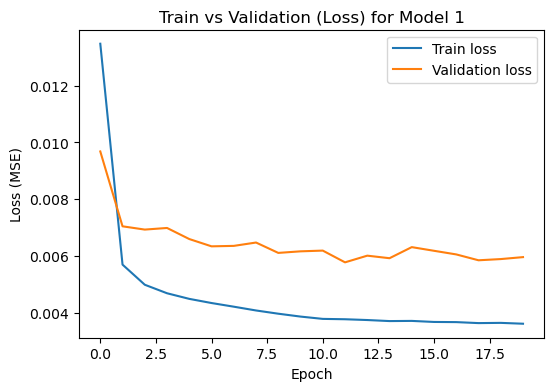

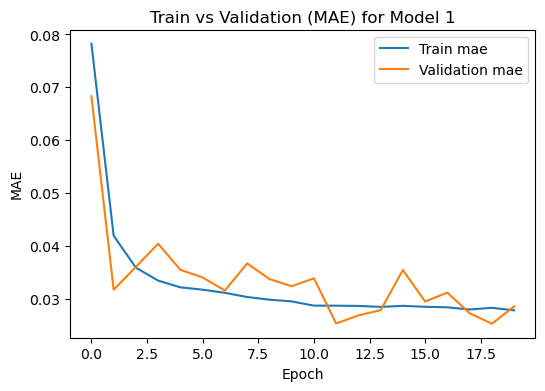

In [53]:
# Menampilkan plot hasil pelatihan dengan memanggil fungsi plot_loss
plot_loss(history_1, 'Model 1')
plot_mae(history_1, 'Model 1')

In [56]:
# menampilkan hasil evaluasi model
eval(model_1, X_train_window_1, X_val_window_1, X_test_window_1, y_train_window_1, y_val_window_1, y_test_window_1)

60/60 [==============================] - 0s 8ms/step
Hasil evaluasi:
MAE on train data:  0.02792
MSE on train data:  0.00358
MAE on validation data:  0.02853
MSE on validation data:  0.00596
MAE on test data:  0.0367
MSE on test data:  0.00609


60/60 [==============================] - 1s 10ms/step


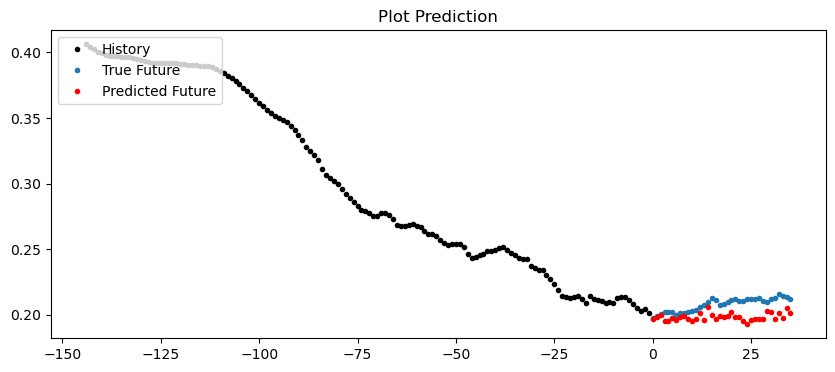

60/60 [==============================] - 1s 11ms/step


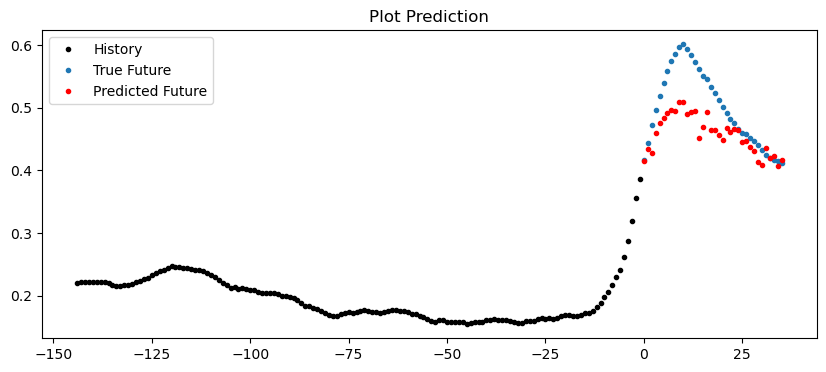

60/60 [==============================] - 1s 11ms/step


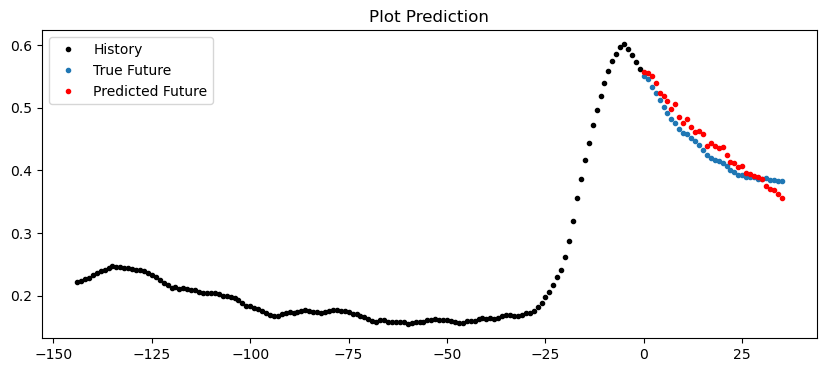

60/60 [==============================] - 1s 10ms/step


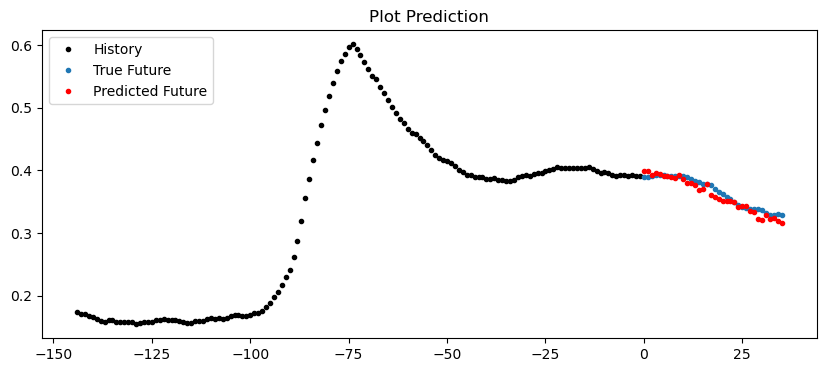

In [82]:
# prediksi
for i in [795, 1001, 1016, 1085]:
    plot_pred0(y_test_window_1[(i-window_size_1):i, 0], 
              y_test_window_1[i], 
              model_1.predict(X_test_window_1)[i])

60/60 [==============================] - 1s 10ms/step


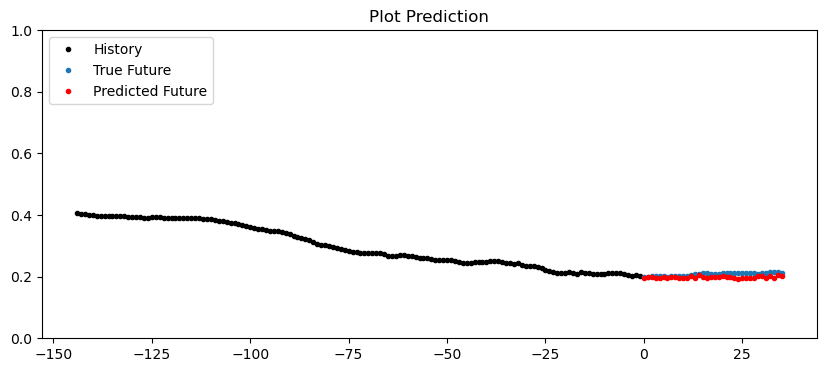

60/60 [==============================] - 1s 10ms/step


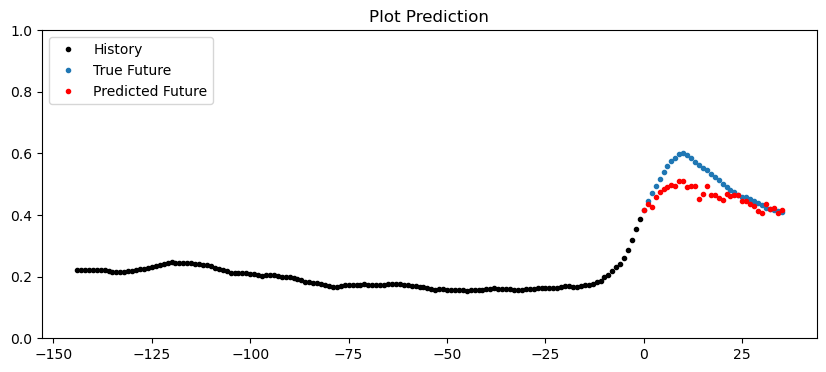

60/60 [==============================] - 1s 10ms/step


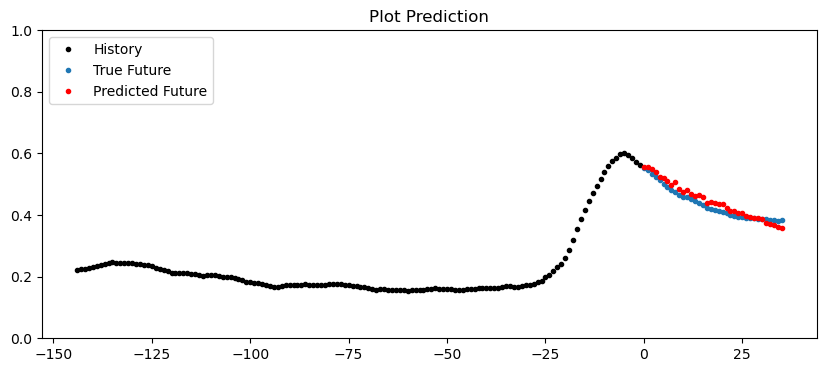

60/60 [==============================] - 1s 10ms/step


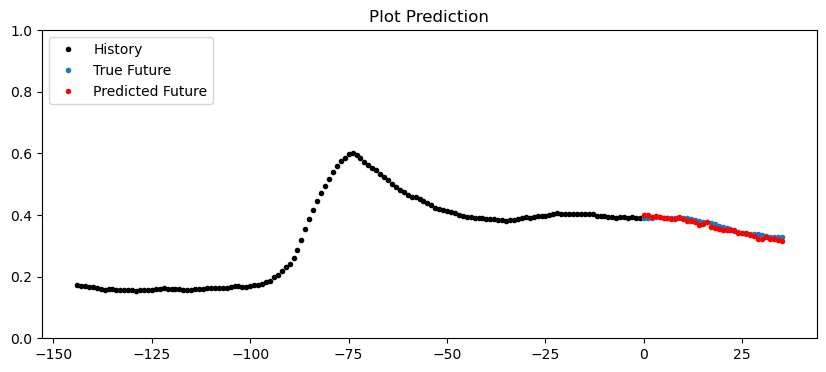

In [84]:
# prediksi
for i in [795, 1001, 1016, 1085]:
    plot_pred1(y_test_window_1[(i-window_size_1):i, 0], 
              y_test_window_1[i], 
              model_1.predict(X_test_window_1)[i])

### Model 2 (window-2)

In [57]:
# Membuat model GRU
model_2 = Sequential()
model_2.add(GRU(window_size_2, 
                input_shape=(window_size_2, X_train.shape[1]), 
                return_sequences=False))
model_2.add(Dense(future_size_2))
model_2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_1 (GRU)                 (None, 144)               65232     
                                                                 
 dense_1 (Dense)             (None, 72)                10440     
                                                                 
Total params: 75,672
Trainable params: 75,672
Non-trainable params: 0
_________________________________________________________________


In [58]:
model_2.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=Adam(lr=0.0001), 
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

early_stopping = EarlyStopping(monitor='val_loss', 
                               patience=PATIENCE, 
                               verbose=1, 
                               restore_best_weights=True)

history_2 = model_2.fit(X_train_window_2, y_train_window_2, 
                        validation_data=(X_val_window_2, y_val_window_2),
                        epochs=EPOCHS, batch_size=32,
                        callbacks=[early_stopping])

Epoch 1/20
298/298 [==============================] - 9s 25ms/step - loss: 0.0166 - mean_absolute_error: 0.0870 - val_loss: 0.0122 - val_mean_absolute_error: 0.0796
Epoch 2/20
298/298 [==============================] - 7s 23ms/step - loss: 0.0087 - mean_absolute_error: 0.0538 - val_loss: 0.0102 - val_mean_absolute_error: 0.0561
Epoch 3/20
298/298 [==============================] - 7s 23ms/step - loss: 0.0079 - mean_absolute_error: 0.0477 - val_loss: 0.0098 - val_mean_absolute_error: 0.0505
Epoch 4/20
298/298 [==============================] - 7s 22ms/step - loss: 0.0075 - mean_absolute_error: 0.0453 - val_loss: 0.0096 - val_mean_absolute_error: 0.0501
Epoch 5/20
298/298 [==============================] - 7s 22ms/step - loss: 0.0073 - mean_absolute_error: 0.0443 - val_loss: 0.0096 - val_mean_absolute_error: 0.0512
Epoch 6/20
298/298 [==============================] - 7s 22ms/step - loss: 0.0072 - mean_absolute_error: 0.0440 - val_loss: 0.0095 - val_mean_absolute_error: 0.0470
Epoch 7/20

#### Result

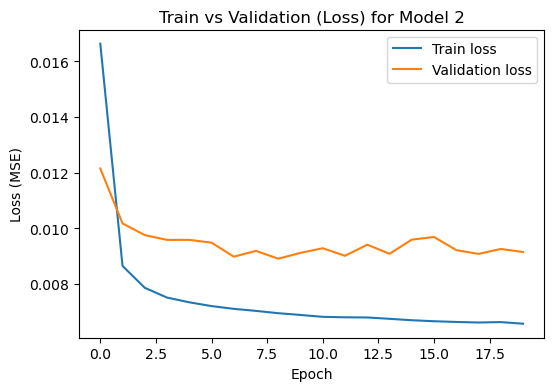

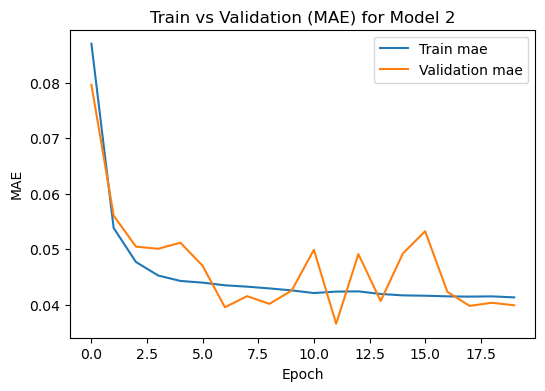

In [59]:
#Menampilkan plot hasil pelatihan dengan memanggil fungsi plot_loss
plot_loss(history_2, 'Model 2')
plot_mae(history_2, 'Model 2')

In [62]:
# menampilkan hasil evaluasi model
eval(model_2, X_train_window_2, X_val_window_2, X_test_window_2, y_train_window_2, y_val_window_2, y_test_window_2)

59/59 [==============================] - 0s 8ms/step
Hasil evaluasi:
MAE on train data:  0.03942
MSE on train data:  0.00651
MAE on validation data:  0.03991
MSE on validation data:  0.00915
MAE on test data:  0.05786
MSE on test data:  0.01311


59/59 [==============================] - 1s 10ms/step


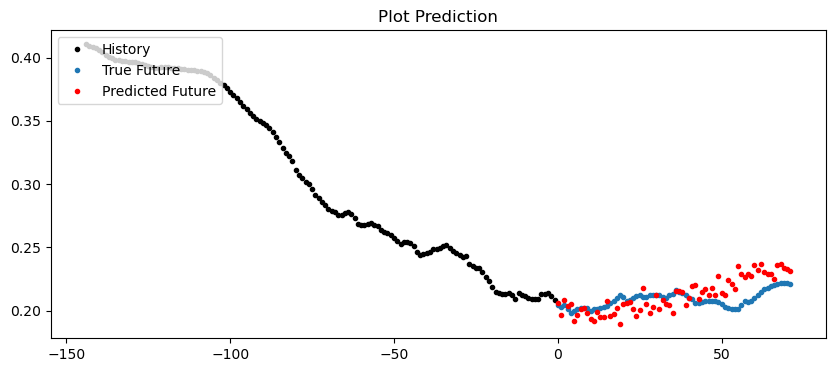

59/59 [==============================] - 1s 10ms/step


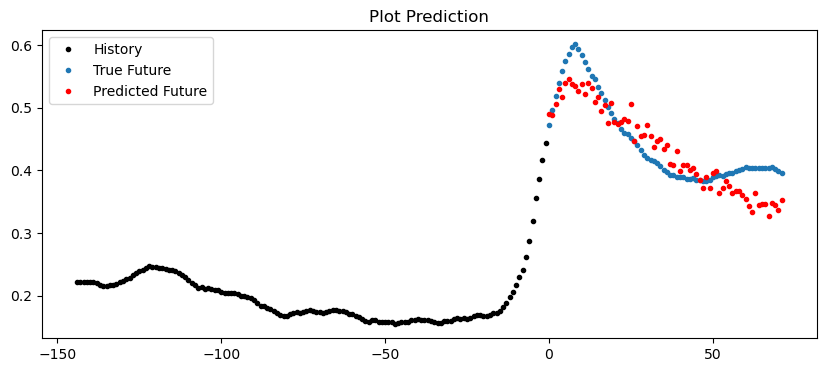

59/59 [==============================] - 1s 10ms/step


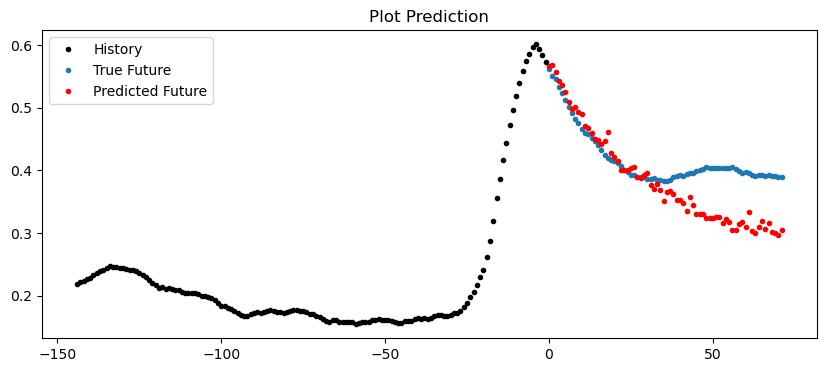

59/59 [==============================] - 1s 10ms/step


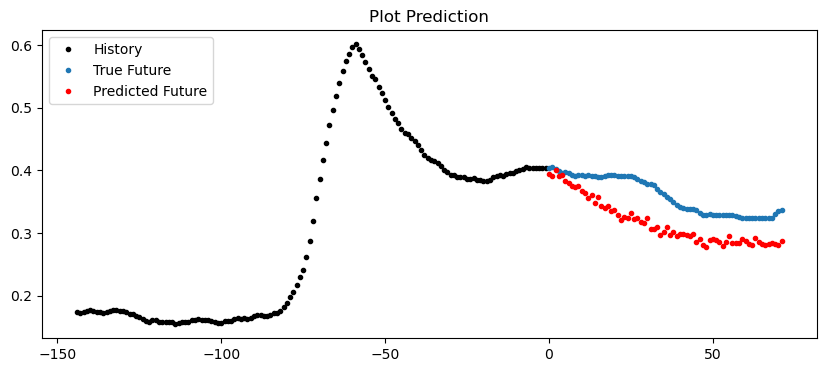

In [93]:
# prediksi 
for i in [791, 1003, 1015, 1070]:
    plot_pred0(y_test_window_2[(i-window_size_2):i, 0], 
              y_test_window_2[i], 
              model_2.predict(X_test_window_2)[i])

59/59 [==============================] - 1s 12ms/step


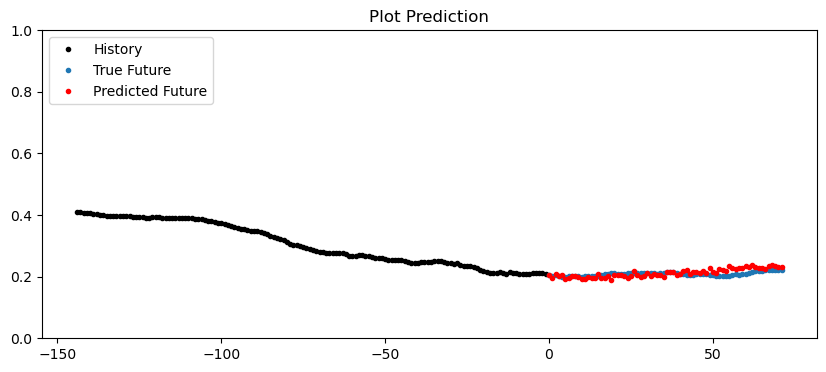

59/59 [==============================] - 1s 10ms/step


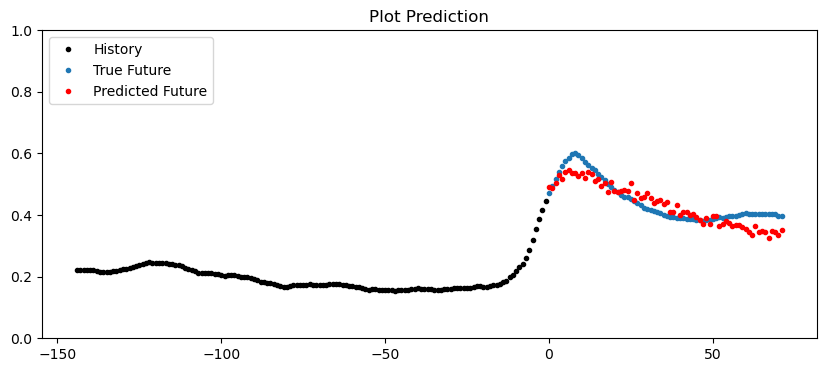

59/59 [==============================] - 1s 10ms/step


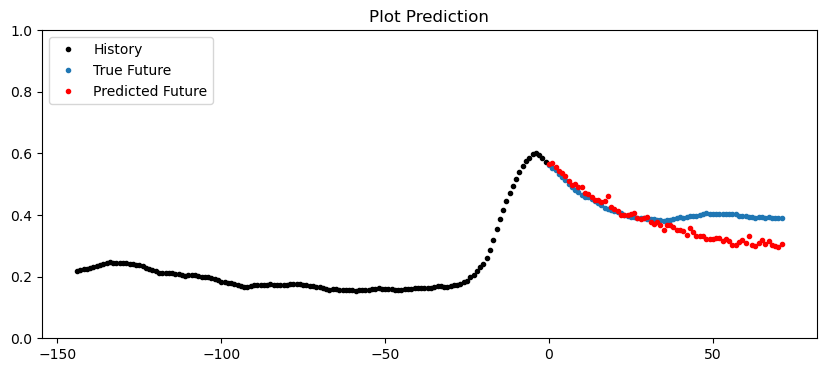

59/59 [==============================] - 1s 10ms/step


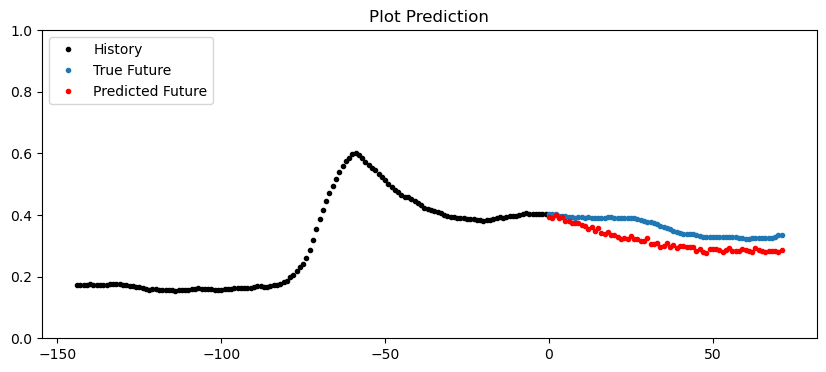

In [94]:
# prediksi 
for i in [791, 1003, 1015, 1070]:
    plot_pred1(y_test_window_2[(i-window_size_2):i, 0], 
              y_test_window_2[i], 
              model_2.predict(X_test_window_2)[i])

### Model 3 (window-3)

In [63]:
# Membuat model GRU
model_3 = Sequential()
model_3.add(GRU(window_size_3, 
                input_shape=(window_size_3, X_train.shape[1]), 
                return_sequences=False))
model_3.add(Dense(future_size_3))
model_3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_2 (GRU)                 (None, 288)               254880    
                                                                 
 dense_2 (Dense)             (None, 36)                10404     
                                                                 
Total params: 265,284
Trainable params: 265,284
Non-trainable params: 0
_________________________________________________________________


In [64]:
model_3.compile(loss=tf.keras.losses.MeanSquaredError(), 
                optimizer=Adam(lr=0.0001), 
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

early_stopping = EarlyStopping(monitor='val_loss', 
                               patience=PATIENCE, 
                               verbose=1, 
                               restore_best_weights=True)

history_3 = model_3.fit(X_train_window_3, y_train_window_3, 
                        validation_data=(X_val_window_3, y_val_window_3),
                        epochs=EPOCHS, batch_size=32,
                        callbacks=[early_stopping])

Epoch 1/20
294/294 [==============================] - 27s 87ms/step - loss: 0.0105 - mean_absolute_error: 0.0638 - val_loss: 0.0076 - val_mean_absolute_error: 0.0402
Epoch 2/20
294/294 [==============================] - 27s 91ms/step - loss: 0.0050 - mean_absolute_error: 0.0360 - val_loss: 0.0073 - val_mean_absolute_error: 0.0342
Epoch 3/20
294/294 [==============================] - 28s 95ms/step - loss: 0.0045 - mean_absolute_error: 0.0324 - val_loss: 0.0069 - val_mean_absolute_error: 0.0270
Epoch 4/20
294/294 [==============================] - 28s 94ms/step - loss: 0.0043 - mean_absolute_error: 0.0316 - val_loss: 0.0067 - val_mean_absolute_error: 0.0340
Epoch 5/20
294/294 [==============================] - 25s 85ms/step - loss: 0.0041 - mean_absolute_error: 0.0302 - val_loss: 0.0063 - val_mean_absolute_error: 0.0283
Epoch 6/20
294/294 [==============================] - 27s 91ms/step - loss: 0.0040 - mean_absolute_error: 0.0301 - val_loss: 0.0066 - val_mean_absolute_error: 0.0296
Epoc

#### Result

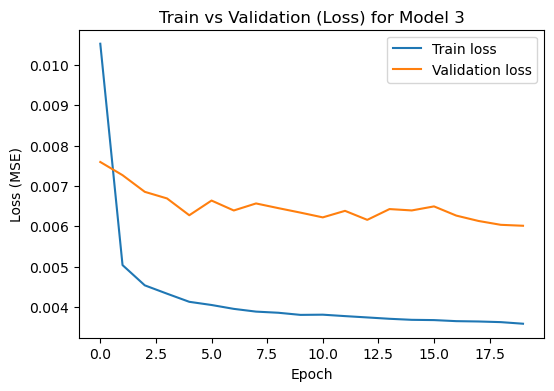

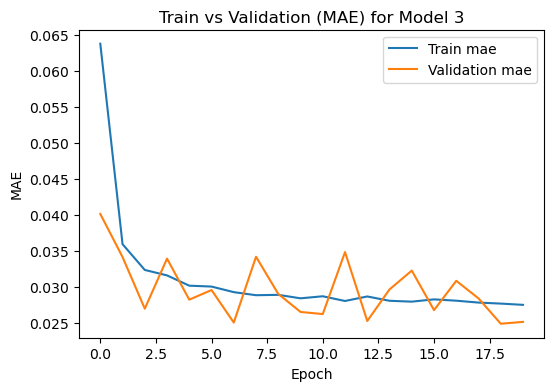

In [65]:
#Menampilkan plot hasil pelatihan dengan memanggil fungsi plot_loss
plot_loss(history_3, 'Model 3')
plot_mae(history_3, 'Model 3')

In [68]:
# menampilkan hasil evaluasi model
eval(model_3, X_train_window_3, X_val_window_3, X_test_window_3, y_train_window_3, y_val_window_3, y_test_window_3)

55/55 [==============================] - 2s 29ms/step
Hasil evaluasi:
MAE on train data:  0.02495
MSE on train data:  0.00354
MAE on validation data:  0.0252
MSE on validation data:  0.00601
MAE on test data:  0.03635
MSE on test data:  0.00658


55/55 [==============================] - 2s 31ms/step


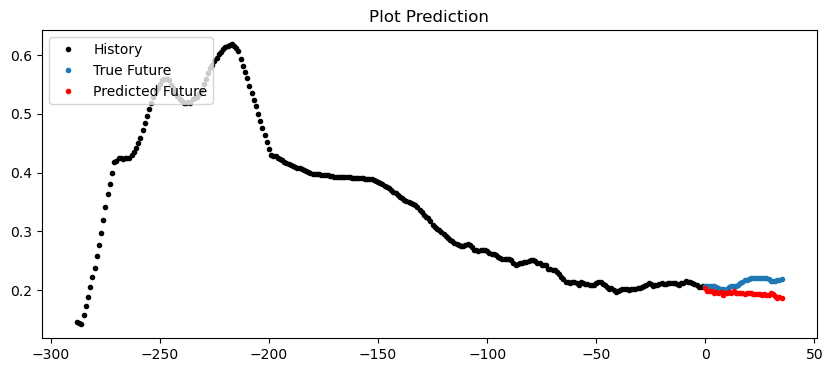

55/55 [==============================] - 2s 32ms/step


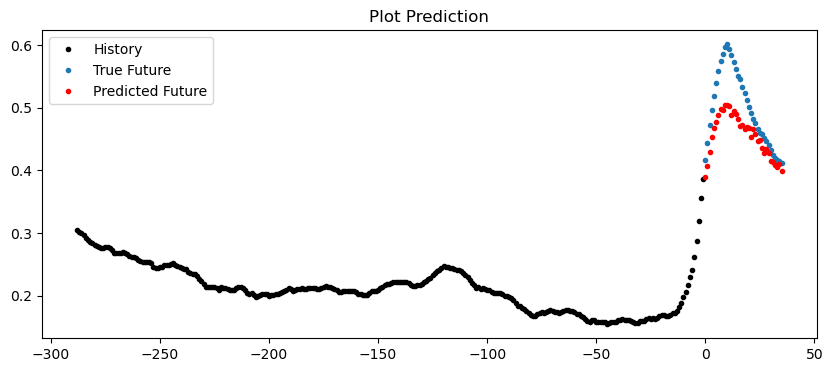

55/55 [==============================] - 2s 31ms/step


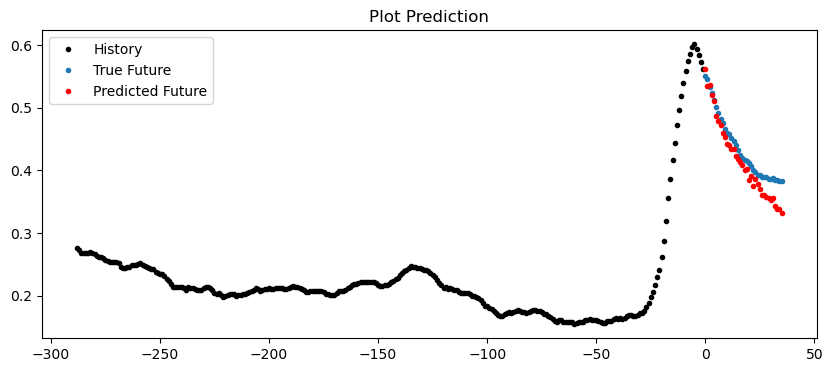

55/55 [==============================] - 2s 32ms/step


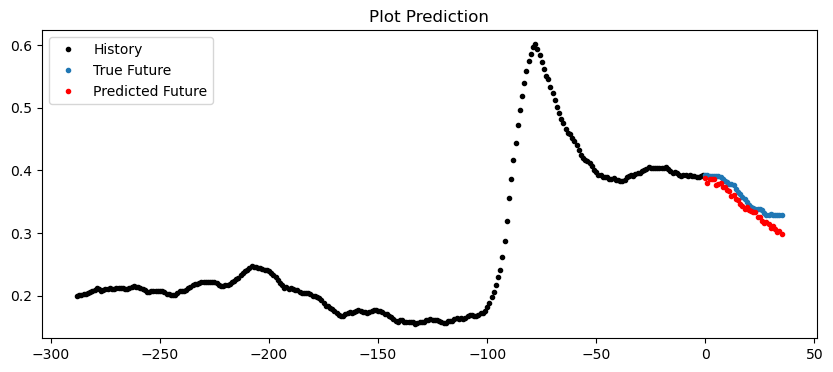

In [66]:
# prediksi
for i in [692,857,872,945]:
    plot_pred0(y_test_window_3[(i-window_size_3):i, 0], 
              y_test_window_3[i], 
              model_3.predict(X_test_window_3)[i])

55/55 [==============================] - 2s 31ms/step


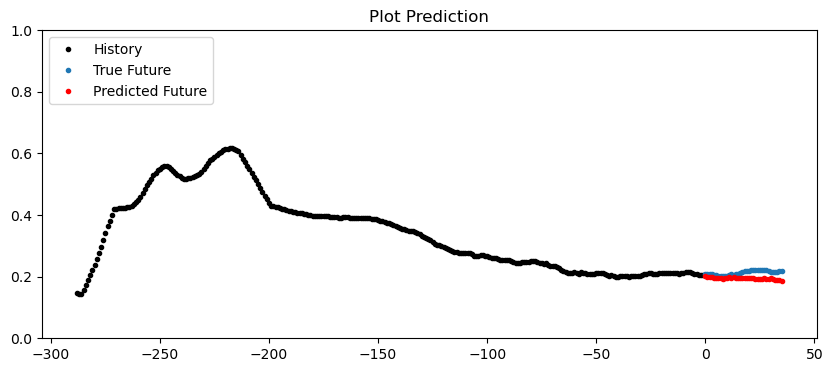

55/55 [==============================] - 2s 32ms/step


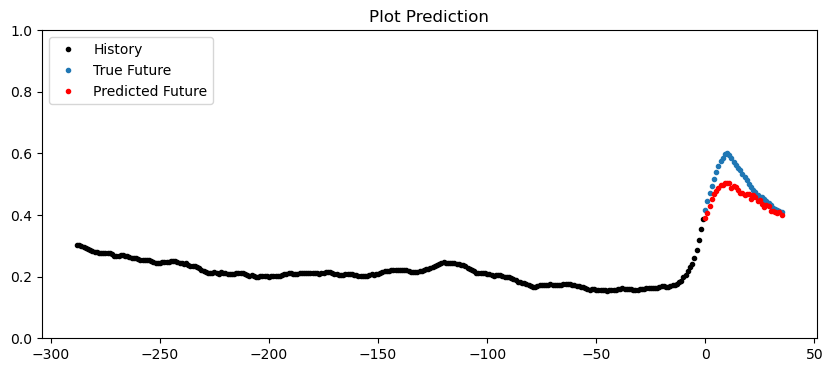

55/55 [==============================] - 2s 30ms/step


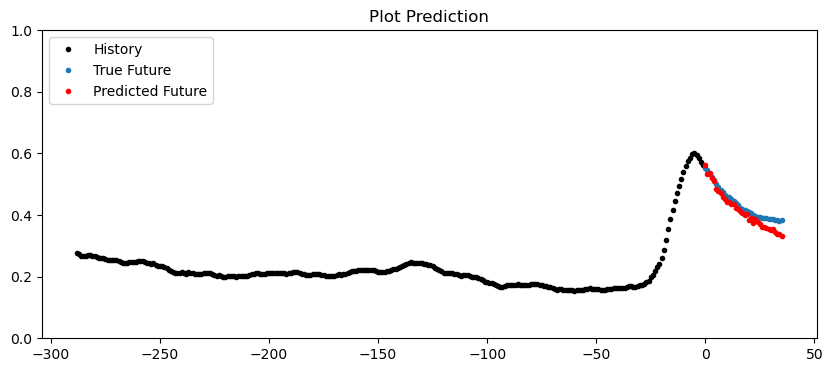

55/55 [==============================] - 2s 31ms/step


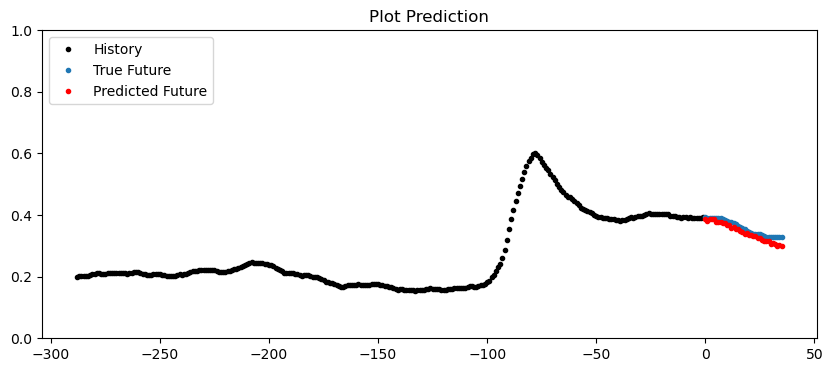

In [67]:
# prediksi
for i in [692,857,872,945]:
    plot_pred1(y_test_window_3[(i-window_size_3):i, 0], 
              y_test_window_3[i], 
              model_3.predict(X_test_window_3)[i])

### Model 4 (window-4)

In [69]:
# Membuat model GRU
model_4 = Sequential()
model_4.add(GRU(window_size_4, 
                input_shape=(window_size_4, X_train.shape[1]), 
                return_sequences=False))
model_4.add(Dense(future_size_4))
model_4.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_3 (GRU)                 (None, 288)               254880    
                                                                 
 dense_3 (Dense)             (None, 72)                20808     
                                                                 
Total params: 275,688
Trainable params: 275,688
Non-trainable params: 0
_________________________________________________________________


In [70]:
# Compile
model_4.compile(loss=tf.keras.losses.MeanSquaredError(), 
                optimizer=Adam(lr=0.0001),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

early_stopping = EarlyStopping(monitor='val_loss', 
                               patience=PATIENCE, 
                               verbose=1, 
                               restore_best_weights=True)

history_4 = model_4.fit(X_train_window_4, y_train_window_4, 
                        validation_data=(X_val_window_4, y_val_window_4),
                        epochs=EPOCHS,  batch_size=32,
                        callbacks=[early_stopping])

Epoch 1/20
293/293 [==============================] - 28s 87ms/step - loss: 0.0133 - mean_absolute_error: 0.0747 - val_loss: 0.0116 - val_mean_absolute_error: 0.0668
Epoch 2/20
293/293 [==============================] - 25s 85ms/step - loss: 0.0080 - mean_absolute_error: 0.0481 - val_loss: 0.0105 - val_mean_absolute_error: 0.0518
Epoch 3/20
293/293 [==============================] - 26s 88ms/step - loss: 0.0075 - mean_absolute_error: 0.0453 - val_loss: 0.0105 - val_mean_absolute_error: 0.0564
Epoch 4/20
293/293 [==============================] - 29s 99ms/step - loss: 0.0073 - mean_absolute_error: 0.0445 - val_loss: 0.0101 - val_mean_absolute_error: 0.0501
Epoch 5/20
293/293 [==============================] - 27s 93ms/step - loss: 0.0071 - mean_absolute_error: 0.0432 - val_loss: 0.0101 - val_mean_absolute_error: 0.0505
Epoch 6/20
293/293 [==============================] - 27s 91ms/step - loss: 0.0070 - mean_absolute_error: 0.0428 - val_loss: 0.0104 - val_mean_absolute_error: 0.0606
Epoc

#### Result

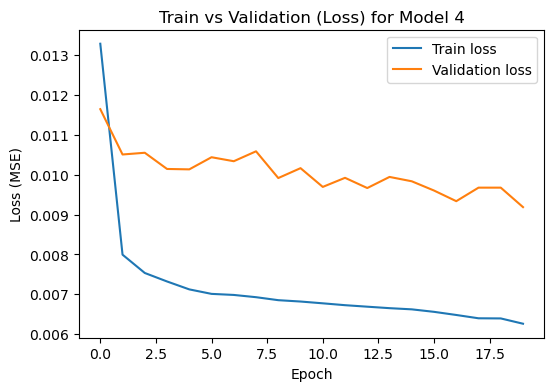

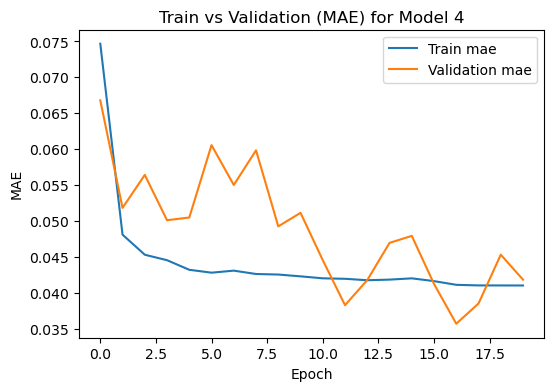

In [71]:
#Menampilkan plot hasil pelatihan dengan memanggil fungsi plot_loss
plot_loss(history_4, 'Model 4')
plot_mae(history_4, 'Model 4')

In [74]:
# menampilkan hasil evaluasi model
eval(model_4, X_train_window_4, X_val_window_4, X_test_window_4, y_train_window_4, y_val_window_4, y_test_window_4)

54/54 [==============================] - 2s 29ms/step
Hasil evaluasi:
MAE on train data:  0.04182
MSE on train data:  0.00638
MAE on validation data:  0.04182
MSE on validation data:  0.00918
MAE on test data:  0.07094
MSE on test data:  0.01612


54/54 [==============================] - 2s 30ms/step


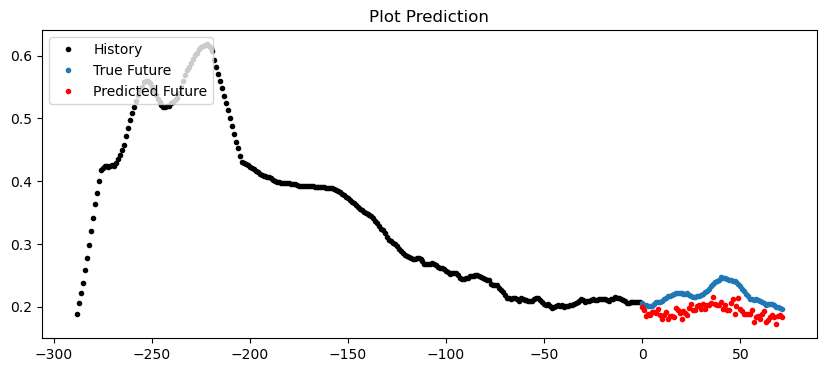

54/54 [==============================] - 2s 29ms/step


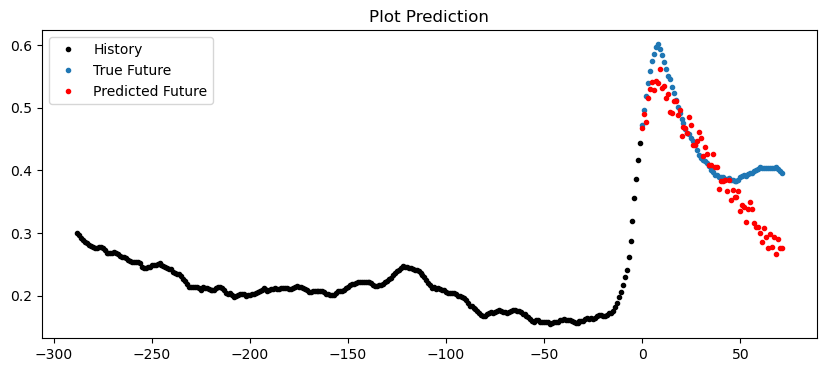

54/54 [==============================] - 2s 30ms/step


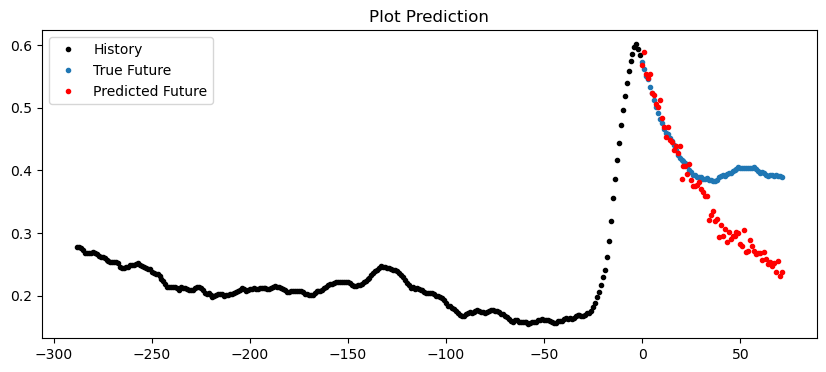

54/54 [==============================] - 2s 29ms/step


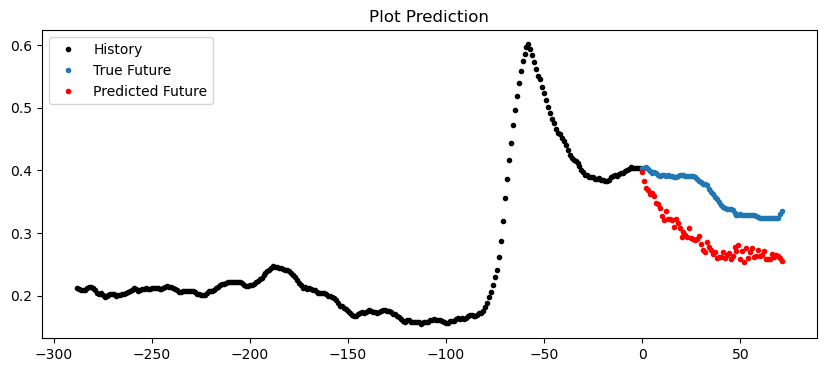

In [104]:
# prediksi
for i in [697,859,870,925]:
    plot_pred0(y_test_window_4[(i-window_size_4):i, 0], 
              y_test_window_4[i], 
              model_4.predict(X_test_window_4)[i])

54/54 [==============================] - 2s 30ms/step


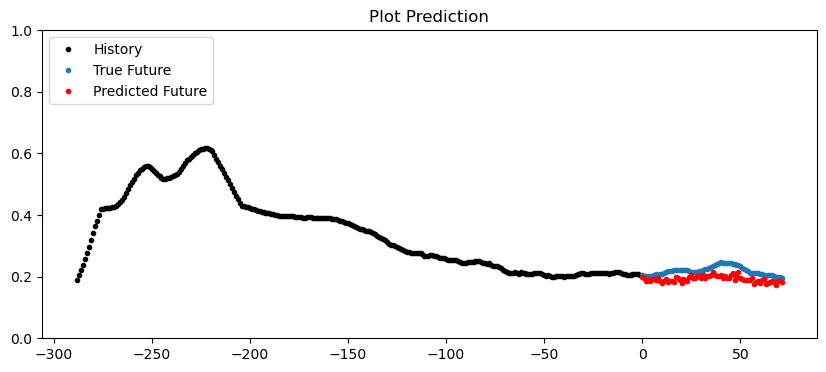

54/54 [==============================] - 2s 30ms/step


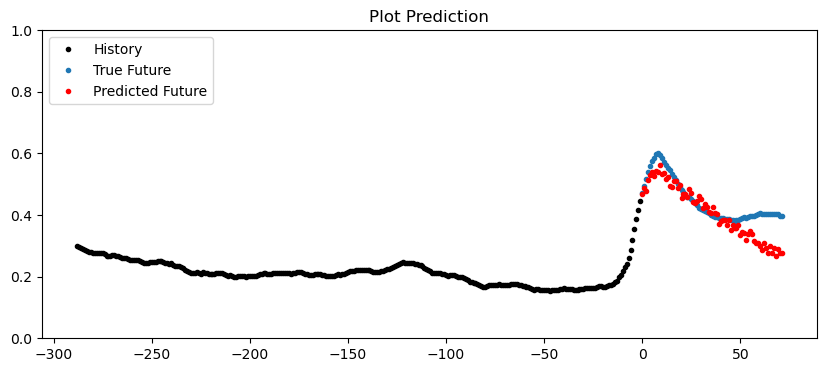

54/54 [==============================] - 2s 29ms/step


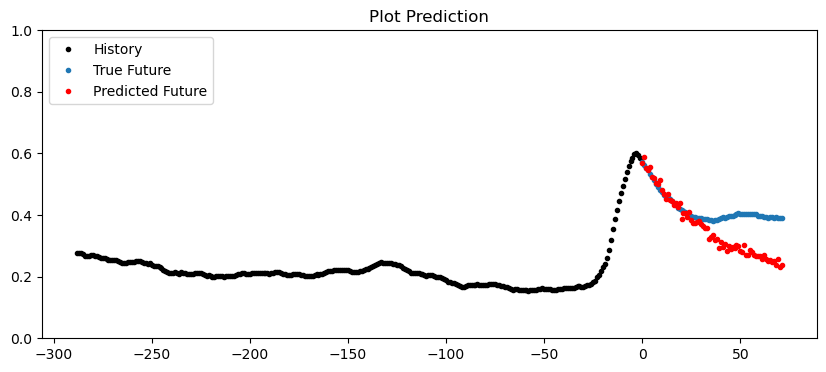

54/54 [==============================] - 2s 31ms/step


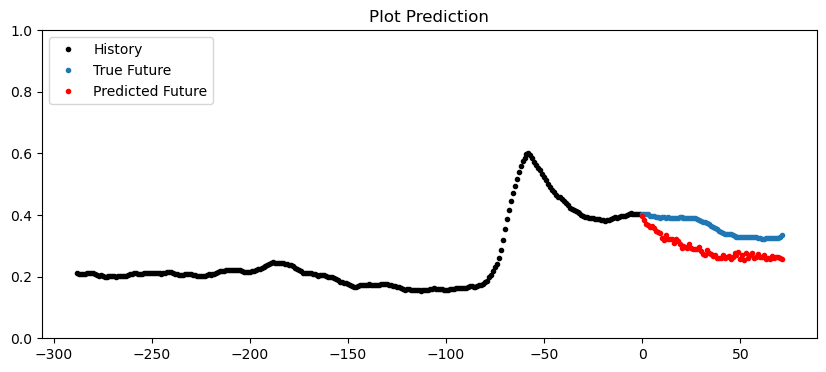

In [105]:
# prediksi
for i in [697,859,870,925]:
    plot_pred1(y_test_window_4[(i-window_size_4):i, 0], 
              y_test_window_4[i], 
              model_4.predict(X_test_window_4)[i])

### Tuning Hyperparameter

MODEL dengan window (3) memiliki hasil evaluasi terbaik, selanjutnya akan dilakukan tuning hyperparameter untuk meningkatkan hasil evaluasi

In [19]:
# '''
#     - penambahan layer gru dan dense ------------> agar dapat menangkap lebih banyak pola
#     - aktivasi: tanh   --------------------------> mengatasi vanishing gradient
#     - kernel initializer: glorot normal  --------> inisialisasi bobot
#     - bias initializer: zeros -------------------> inisialisasi bias
#     - penambahan epoch: 50  ---------------------> menambah iterasi training model
#     - penyesuaian learning rate: lr scheduler ---> mengatur laju pembelajaran, biasanya makin lama iterasi diatur makin kecil
# '''

In [300]:
model_tuned = Sequential()

model_tuned.add(GRU(256, 
                    input_shape=(window_size_3, X_train.shape[1]), 
                    return_sequences=True,
                    kernel_initializer=GlorotNormal(),
                    bias_initializer=Zeros(),
                    activation='tanh'))

model_tuned.add(GRU(128,  
                    activation='tanh',
                    return_sequences=True,
                    kernel_initializer=GlorotNormal(),
                    bias_initializer=Zeros()))

model_tuned.add(GRU(64,  
                    activation='tanh',
                    return_sequences=True,
                    kernel_initializer=GlorotNormal(),
                    bias_initializer=Zeros()))

model_tuned.add(GRU(64,  
                    activation='tanh',
                    return_sequences=False,
                    kernel_initializer=GlorotNormal(),
                    bias_initializer=Zeros()))

model_tuned.add(Dense(64,
                      activation='tanh', 
                      kernel_initializer=GlorotNormal(),
                      bias_initializer=Zeros()))

model_tuned.add(Dense(future_size_3,
                      activation='tanh', 
                      kernel_initializer=GlorotNormal(),
                      bias_initializer=Zeros()))

model_tuned.summary()

Model: "sequential_47"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_137 (GRU)               (None, 288, 256)          201984    
                                                                 
 gru_138 (GRU)               (None, 288, 128)          148224    
                                                                 
 gru_139 (GRU)               (None, 288, 64)           37248     
                                                                 
 gru_140 (GRU)               (None, 64)                24960     
                                                                 
 dense_77 (Dense)            (None, 64)                4160      
                                                                 
 dense_78 (Dense)            (None, 36)                2340      
                                                                 
Total params: 418,916
Trainable params: 418,916
Non-t

In [301]:
model_tuned.compile(loss=tf.keras.losses.MeanSquaredError(), 
                    optimizer=Adam(lr=0.0001), 
                    metrics=[tf.keras.metrics.MeanAbsoluteError()])

# Define learning rate scheduler callback
lr_scheduler = LearningRateScheduler(lr_schedule)

early_stopping = EarlyStopping(monitor='val_loss', 
                               patience=50, 
                               verbose=1, 
                               restore_best_weights=True)

history_tuned = model_tuned.fit(X_train_window_3, y_train_window_3, 
                                validation_data=(X_val_window_3, y_val_window_3),
                                epochs=50, batch_size=32,
                                callbacks=[early_stopping,lr_scheduler])

Epoch 1/50
294/294 [==============================] - 76s 243ms/step - loss: 0.0109 - mean_absolute_error: 0.0623 - val_loss: 0.0082 - val_mean_absolute_error: 0.0439 - lr: 1.0000e-04
Epoch 2/50
294/294 [==============================] - 47s 159ms/step - loss: 0.0054 - mean_absolute_error: 0.0369 - val_loss: 0.0073 - val_mean_absolute_error: 0.0318 - lr: 1.0000e-04
Epoch 3/50
294/294 [==============================] - 55s 189ms/step - loss: 0.0050 - mean_absolute_error: 0.0349 - val_loss: 0.0069 - val_mean_absolute_error: 0.0299 - lr: 1.0000e-04
Epoch 4/50
294/294 [==============================] - 51s 175ms/step - loss: 0.0046 - mean_absolute_error: 0.0328 - val_loss: 0.0066 - val_mean_absolute_error: 0.0303 - lr: 1.0000e-04
Epoch 5/50
294/294 [==============================] - 48s 163ms/step - loss: 0.0043 - mean_absolute_error: 0.0317 - val_loss: 0.0063 - val_mean_absolute_error: 0.0318 - lr: 1.0000e-04
Epoch 6/50
294/294 [==============================] - 48s 163ms/step - loss: 0.0

#### Result

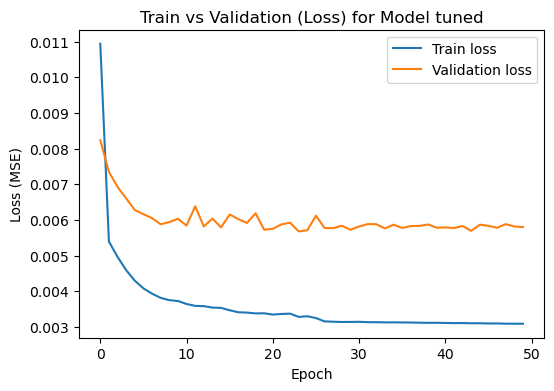

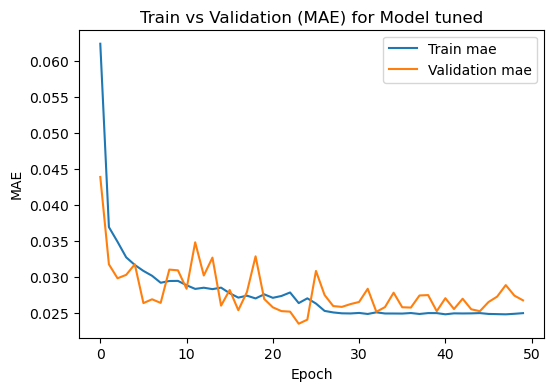

In [302]:
#Menampilkan plot hasil pelatihan dengan memanggil fungsi plot_loss
plot_loss(history_tuned, 'Model tuned')
plot_mae(history_tuned, 'Model tuned')

In [303]:
# menampilkan hasil evaluasi model
eval(model_tuned, X_train_window_3, X_val_window_3, X_test_window_3, y_train_window_3, y_val_window_3, y_test_window_3)

55/55 [==============================] - 16s 290ms/step
Hasil evaluasi:
MAE on train data:  0.02501
MSE on train data:  0.00307
MAE on validation data:  0.0268
MSE on validation data:  0.0058
MAE on test data:  0.03543
MSE on test data:  0.00586


55/55 [==============================] - 3s 57ms/step


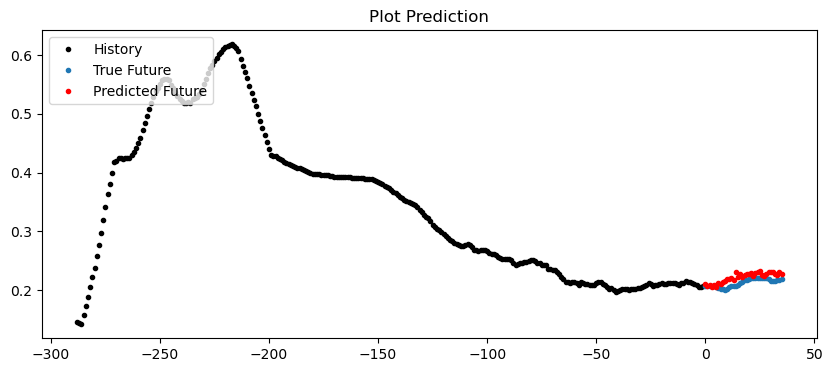

55/55 [==============================] - 3s 60ms/step


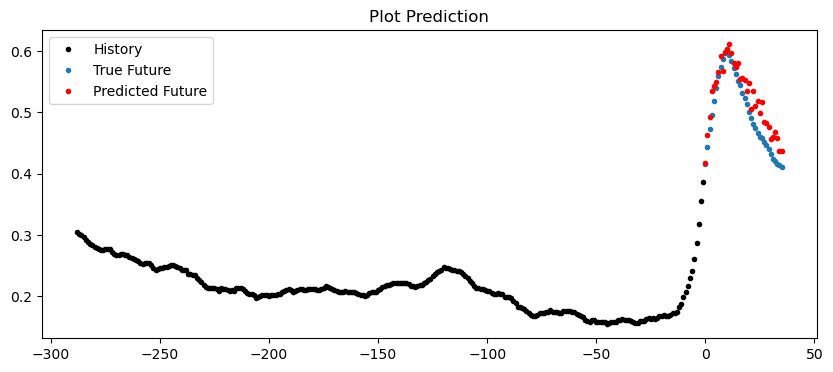

55/55 [==============================] - 3s 61ms/step


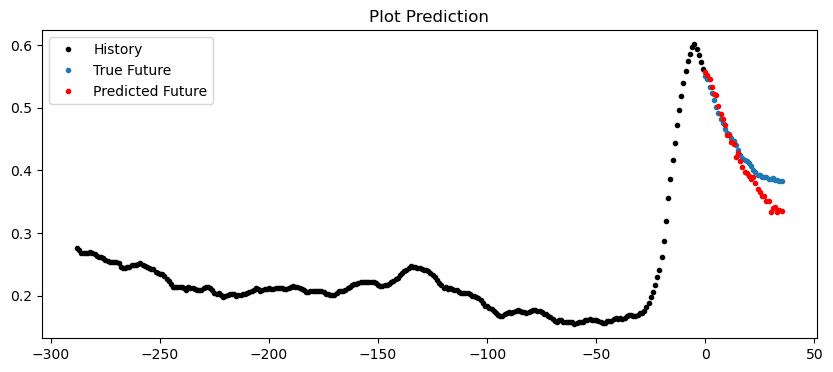

55/55 [==============================] - 3s 60ms/step


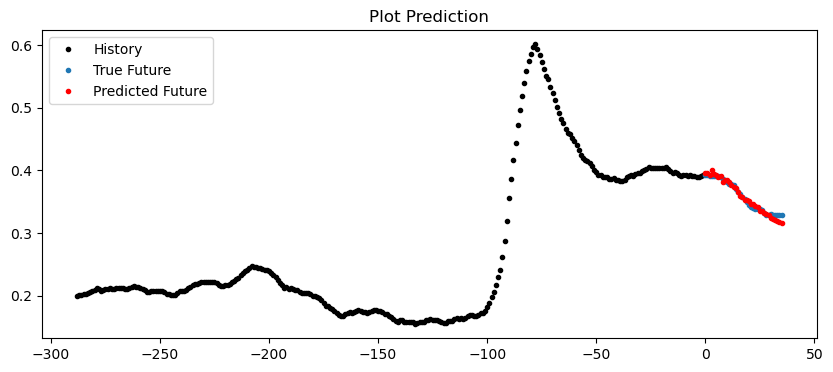

In [304]:
# prediksi
for i in [692,857, 872, 945]:
    plot_pred0(y_test_window_3[(i-window_size_3):i, 0], 
              y_test_window_3[i], 
              model_tuned.predict(X_test_window_3)[i])

55/55 [==============================] - 3s 60ms/step


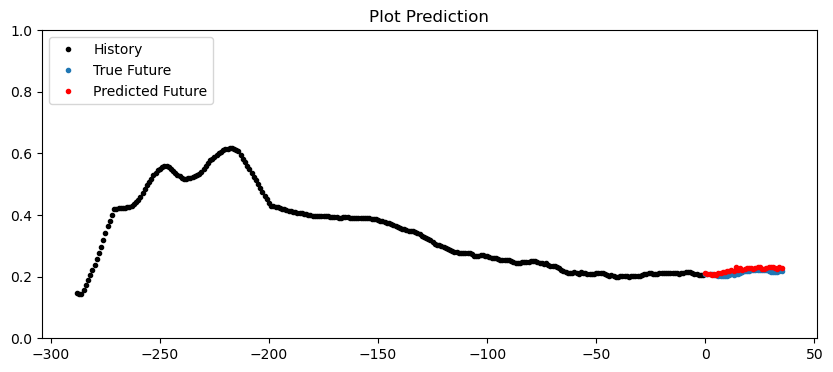

55/55 [==============================] - 3s 62ms/step


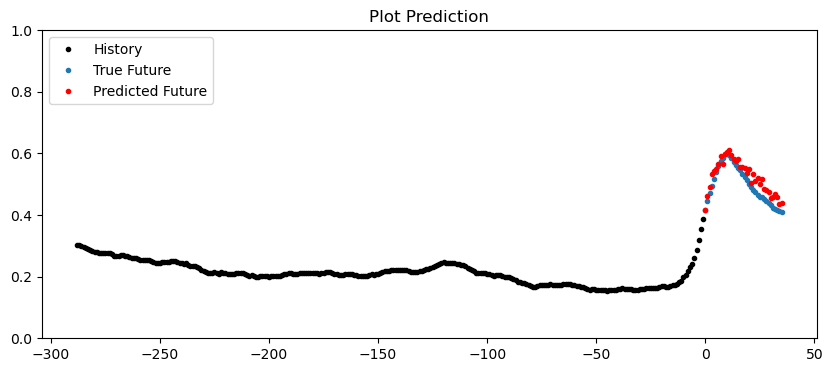

55/55 [==============================] - 3s 62ms/step


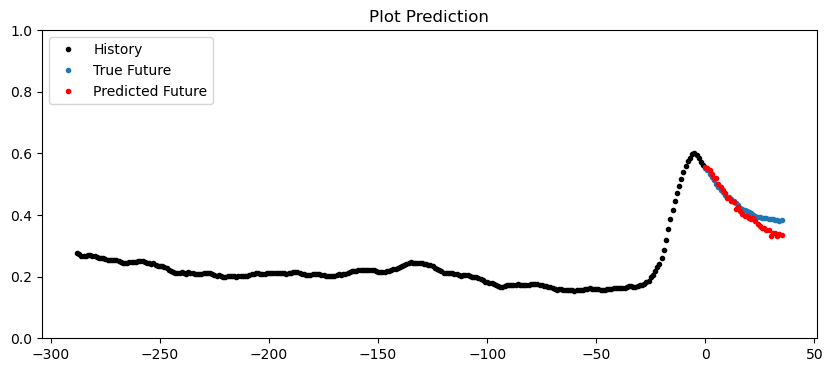

55/55 [==============================] - 3s 61ms/step


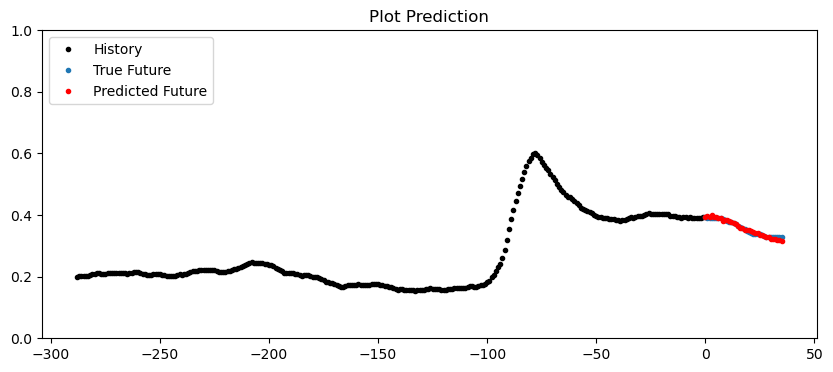

In [305]:
# prediksi
for i in [692,857,872,945]:
    plot_pred1(y_test_window_3[(i-window_size_3):i, 0], 
              y_test_window_3[i], 
              model_tuned.predict(X_test_window_3)[i])

Performa meningkat setelah tuning hyperparameter (dapat memprediksi puncak lebih akurat)

## - SAVE MODEL

In [306]:
# # save model dalam format .h5
# model_final.save('/content/drive/MyDrive/dataset_skripsi/model_banjir/h5/model_prediksi_banjir.h5')

# save model dalam format .h5
model_tuned.save('model/model_prediksi_banjir.h5')

In [12]:
# Memuat model dari format HDF5
from tensorflow.keras.models import load_model
loaded_model = load_model('model/model_prediksi_banjir.h5')

In [13]:
# menampilkan hasil evaluasi model
eval(loaded_model, X_train_window_3, X_val_window_3, X_test_window_3, y_train_window_3, y_val_window_3, y_test_window_3)

55/55 [==============================] - 3s 58ms/step
Hasil evaluasi:
MAE on train data:  0.02501
MSE on train data:  0.00307
MAE on validation data:  0.0268
MSE on validation data:  0.0058
MAE on test data:  0.03543
MSE on test data:  0.00586


---------------------------

# 4. SIMULASI KLASIFIKASI DAN PREDIKSI BANJIR

In [1]:
# import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import joblib
from keras.models import load_model
import h5py

In [6]:
def get_X_klasifikasi(data, date):
    X_klasifikasi = data.loc[data['date'] == date].reset_index(drop=True)
    X_klasifikasi = X_klasifikasi[['date','height']]
    return X_klasifikasi

def klasifikasi_banjir(X,scaler_X,model):
    # scaling
    X_klasifikasi_scaled = scaler_X.transform(X[['height']])
    # predict
    y_klasifikasi = model.predict(X_klasifikasi_scaled,verbose=0)
    y_klasifikasi = np.argmax(y_klasifikasi, axis=1)
    # df
    y_klasifikasi = pd.DataFrame(y_klasifikasi,columns = ['status'])
    df_klasifikasi = X.join(y_klasifikasi)
    return df_klasifikasi
    
def get_X_prediksi(data, date):
    data_history = data.loc[data['date'] <= date].head(500).sort_values(by=['date']).reset_index(drop=True) # 288+108=396, 400>396
    data_history['cloudcover_3h'] = data_history['cloudcover'].shift(18)
    data_history['humidity_18h'] = data_history['humidity'].shift(108)
    data_history['height_diff_18h'] = data_history['height'] - data_history['height'].shift(108)
    data_history = data_history.dropna().tail(288).reset_index(drop = True)
    data_history = data_history[['date','height','windgust','cloudcover_3h','humidity_18h','height_diff_18h']]
    return data_history

def prediksi_banjir(data, date, X, scaler_X, scaler_y, model):
    # X
    X_prediksi = X[['height','windgust','cloudcover_3h','humidity_18h','height_diff_18h']]
    # scaling
    X_prediksi_scaled = scaler_X.transform(X_prediksi)
    # reshape 
    X_prediksi_scaled = X_prediksi_scaled.reshape(1,288,5)
    # predict
    y_prediksi = model.predict(X_prediksi_scaled,verbose=0)
    # reshape
    y_prediksi = y_prediksi.reshape(36,1)
    # inverse scaling
    y_prediksi_inverse = scaler_y.inverse_transform(y_prediksi)
    y_prediksi_inverse = pd.DataFrame(y_prediksi_inverse, columns = ['height'])
    # DATA FUTURE
    data_future = data.loc[data['date'] > date].tail(36).sort_values(by=['date']).reset_index(drop=True)# 36=step
    data_future = data_future[['date','height']].rename(columns = {'height':'height_true'})
    # DF PRED
    df_pred = data_future.join(y_prediksi_inverse)
    return df_pred

    
def get_info(y_klasifikasi, X, y_pred_status):
    date = y_klasifikasi['date'][0]
    height = y_klasifikasi['height'][0]
    status = y_klasifikasi['status'][0]
    
    # Info klasifikasi
    print('-----------------------------------------------------------------------------')
    print('Datetime            :', date)
    print('Ketinggian sekarang :', height.round(2), 'cm')

    # kondisi status
    if status == 0:
        print('Status sekarang     : SIAGA 0\n')
        if (y_pred_status['status']==0).all():                                                                    # jika semua siaga 0
            print('Info : [AMAN] Dalam 6 jam kedepan diperkirakan akan tetap berstatus SIAGA 0.')
            print('        Tidak akan terjadi banjir.')
        elif (y_pred_status['status'] == 1).any() and not (y_pred_status['status'] == 2).any():                   # jika ada siaga 1 dan tidak ada siaga 2
            t_siaga1_start = (y_pred_status[y_pred_status['status'] == 1].index.min()+1) * 10
            print(f'Info : [WASPADA] Dalam {t_siaga1_start} menit kedepan diperkirakan akan berstatus SIAGA 1.')
            print('        Harap pantau ketinggian air secara berkala.')
        elif (y_pred_status['status'] == 2).any():                                                                # jika ada siaga 2
            t_siaga2_start = (y_pred_status[y_pred_status['status'] == 2].index.min()+1) * 10
            print(f'Info : [BAHAYA] Dalam {t_siaga2_start} menit kedepan diperkirakan akan berstatus SIAGA 2.')
            print('        Berkemungkinan terjadi banjir, segera lakukan evakuasi.')
        else: print('Info : -')
    
    elif status == 1:
        print('Status sekarang     : SIAGA 1\n')
        if (y_pred_status['status']==0).all():
            print('Info : [AMAN] Dalam 10 menit kedepan diperkirakan akan berstatus SIAGA 0.')
            print('        Tidak akan terjadi banjir.')
        elif (y_pred_status['status']==0).any() and not (y_pred_status['status'] == 2).any():
            t_siaga1_end = (y_pred_status[y_pred_status['status'] == 1].index.max()+2) * 10
            print(f'Info : [AMAN] Dalam {t_siaga1_end} menit kedepan diperkirakan akan berstatus SIAGA 0.')
            print('        Tidak akan terjadi banjir.')
        elif (y_pred_status['status']==1).all():
            print('Info : [WASPADA] Dalam 6 jam kedepan diperkirakan akan tetap berstatus SIAGA 1.')
            print('        Harap pantau ketinggian air secara berkala.')
        elif (y_pred_status['status']==2).any():
            t_siaga2_start = (y_pred_status[y_pred_status['status'] == 2].index.min()+1) * 10
            print(f'Info : [BAHAYA] Dalam {t_siaga2_start} menit kedepan diperkirakan akan berstatus SIAGA 2.')
            print('        Berkemungkinan terjadi banjir, segera lakukan evakuasi.')
        else: print('Info : -')
        
    elif status == 2:
        print('Status sekarang     : SIAGA 2\n')
        if not (y_pred_status['status']==2).any():
            print('Info : [WASPADA] Dalam 10 menit kedepan diperkirakan status SIAGA 2 akan berakhir.')
            print('        Harap pantau ketinggian air secara berkala.')
        elif (y_pred_status['status']==2).any() and not (y_pred_status['status']==2).all():
            t_siaga2_end = (y_pred_status[y_pred_status['status'] == 2].index.max()+2) * 10
            print(f'Info : [BAHAYA] Dalam {t_siaga2_end} menit kedepan diperkirakan masih berstatus SIAGA 2.')
            print('        Berkemungkinan terjadi banjir, segera lakukan evakuasi.')
        elif (y_pred_status['status']==2).all():
            print('Info : [BAHAYA] Dalam 6 jam kedepan diperkirakan akan tetap berstatus SIAGA 2.')
            print('        Berkemungkinan terjadi banjir, segera lakukan evakuasi.')
        else: print('Info : -')

    print('-----------------------------------------------------------------------------')
    
    # Plot    
    history = X.reset_index()
    history['index'] = history['index'] - 287
    history = history.set_index('index')
    fig = plt.figure(figsize=(10, 4))
    fig = plt.plot(history['height'], 'k.', label='history')
    fig = plt.plot(history['height'].tail(1), 'yo', label='now')
    fig = plt.plot(y_pred_status['height_true'], '.', label='height true')
    fig = plt.plot(y_pred_status['height'], 'r.', label='height pred')
    fig = plt.ylabel('Height (cm)')
    fig = plt.xlabel('Step')
    fig = plt.title('Plot Prediksi Banjir 6 jam kedepan', fontweight='bold', fontsize=12)
    fig = plt.legend(loc='upper left')
    display('Plot Prediksi :', fig)


In [3]:
# load scaler & model
scaler_X_klasifikasi = joblib.load('scaler/scaler_X_klasifikasi.save')
# model_klasifikasi_banjir = load_model('model/model_klasifikasi_banjir.h5')
# Buka file HDF5 untuk di-load
with h5py.File('model/model_klasifikasi_banjir.h5', 'r') as file:
    # Load model dari dataset dalam file HDF5
    model_klasifikasi_banjir = file['model_name']

scaler_X_prediksi = joblib.load('scaler/scaler_X_prediksi.save') 
scaler_y_prediksi = joblib.load('scaler/scaler_y_prediksi.save') 
# model_prediksi_banjir = load_model('model/model_prediksi_banjir.h5')
with h5py.File('model/model_prediksi_banjir.h5', 'r') as file:
    # Load model dari dataset dalam file HDF5
    model_prediksi_banjir = file['model_name']

In [4]:
# read data and format date
data_simulasi = pd.read_csv('dataset/data_simulasi_banjir_sorted.csv')
data_simulasi['date'] = data_simulasi['date'] + ':00'
data_simulasi['date'] = pd.to_datetime(data_simulasi['date'], format='%d/%m/%Y %H:%M:%S')
data_simulasi

,date,height,temp,feelslike,dew,humidity,precip,precipprob,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,uvindex,severerisk
0,2022-09-30 10:30:00,66.708667,26.8,28.1,19.6,64.70,0.0,0,8.6,5.4,292.1,1011,100.0,24.1,756,8,10
1,2022-09-30 10:20:00,66.912000,26.8,28.1,19.6,64.70,0.0,0,8.6,5.4,292.1,1011,100.0,24.1,756,8,10
2,2022-09-30 10:10:00,66.713333,26.8,28.1,19.6,64.70,0.0,0,8.6,5.4,292.1,1011,100.0,24.1,756,8,10
3,2022-09-30 10:00:00,66.380667,26.8,28.1,19.6,64.70,0.0,0,8.6,5.4,292.1,1011,100.0,24.1,756,8,10
4,2022-09-30 09:50:00,66.340000,25.4,25.4,19.4,69.42,0.0,0,6.5,3.6,314.2,1012,86.5,24.1,545,5,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3195,2022-09-08 06:00:00,59.662667,18.8,18.8,16.6,87.05,0.0,0,4.0,5.4,77.1,1013,92.8,24.1,0,0,10
3196,2022-09-08 05:50:00,59.910667,19.0,19.0,17.3,89.87,0.0,0,4.7,6.5,81.5,1013,100.0,24.1,0,0,10
3197,2022-09-08 05:40:00,60.045333,19.0,19.0,17.3,89.87,0.0,0,4.7,6.5,81.5,1013,100.0,24.1,0,0,10
3198,2022-09-08 05:30:00,60.056000,19.0,19.0,17.3,89.87,0.0,0,4.7,6.5,81.5,1013,100.0,24.1,0,0,10


In [13]:
data_simulasi[['height']].describe().T

,count,mean,std,min,25%,50%,75%,max
height,3200.0,66.393319,25.277944,33.896667,49.694,58.780333,73.725833,197.556


Dalam dataset simulasi ini terdapat nilai 'height' antara 33.90 cm - 197.56 cm, 
jadi sudah cukup untuk melakukan simulasi klasifikasi dan prediksi banjir karena terdapat status siaga 0, siaga 1, dan siaga 3.

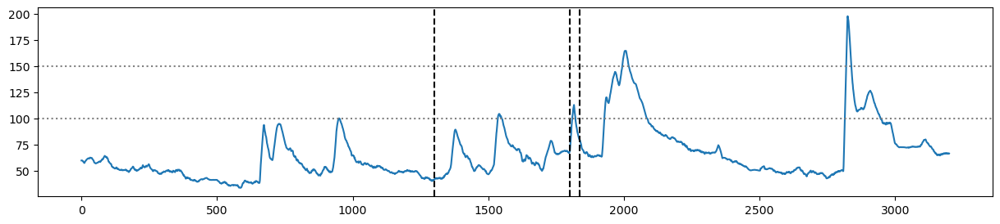

Timestamp('2022-09-20 17:10:00')

In [22]:
# cek datetime
data_cek=data_simulasi.sort_values(by='date',ascending=True).reset_index(drop=True)
a=1800
plt.figure(figsize=(15, 3))
plt.plot(data_cek['height'], '-')
plt.axvline(a-500, color='black', linestyle='--')
plt.axvline(a, color='black', linestyle='--')
plt.axvline(a+36, color='black', linestyle='--')
plt.axhline(100, color='grey', linestyle='dotted')
plt.axhline(150, color='grey', linestyle='dotted')
plt.show()
data_cek.date.loc[a-1]

## Siaga 0 (AMAN)

-----------------------------------------------------------------------------
Datetime            : 2022-09-17 17:10:00
Ketinggian sekarang : 67.17 cm
Status sekarang     : SIAGA 0

Info : [AMAN] Dalam 6 jam kedepan diperkirakan akan tetap berstatus SIAGA 0.
        Tidak akan terjadi banjir.
-----------------------------------------------------------------------------


'Plot Prediksi :'

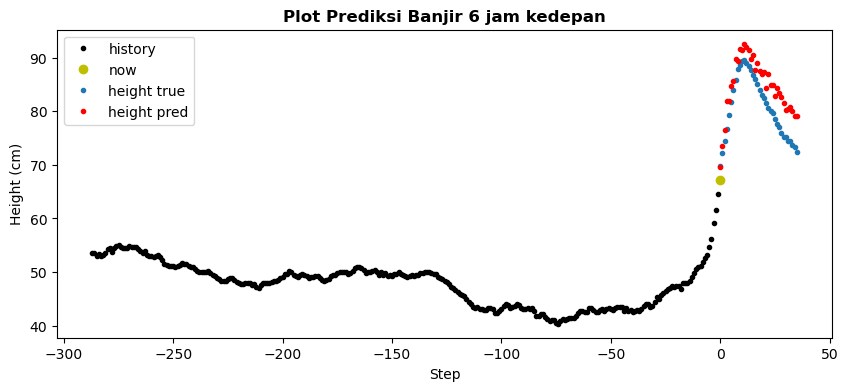

In [16]:
#date_now = input('date: ') 
date_now = '2022-09-17 17:10:00'

# klasifikasi
X_klasifikasi=get_X_klasifikasi(data=data_simulasi, 
                                date=date_now)
y_klasifikasi=klasifikasi_banjir(X=X_klasifikasi,
                                 scaler_X=scaler_X_klasifikasi,
                                 model=model_klasifikasi_banjir)

# prediksi
X_prediksi=get_X_prediksi(data=data_simulasi, 
                          date=date_now)
y_pred=prediksi_banjir(data=data_simulasi,
                       date=date_now,
                       X=X_prediksi,
                       scaler_X=scaler_X_prediksi,
                       scaler_y=scaler_y_prediksi,
                       model=model_prediksi_banjir)
pred_status=klasifikasi_banjir(X=y_pred,
                               scaler_X=scaler_X_klasifikasi,
                               model=model_klasifikasi_banjir)
get_info(y_klasifikasi=y_klasifikasi,
         X=X_prediksi,
         y_pred_status=pred_status)

## Siaga 1 (WASPADA)

-----------------------------------------------------------------------------
Datetime            : 2022-09-20 17:50:00
Ketinggian sekarang : 77.0 cm
Status sekarang     : SIAGA 0

Info : [WASPADA] Dalam 60 menit kedepan diperkirakan akan berstatus SIAGA 1.
        Harap pantau ketinggian air secara berkala.
-----------------------------------------------------------------------------


'Plot Prediksi :'

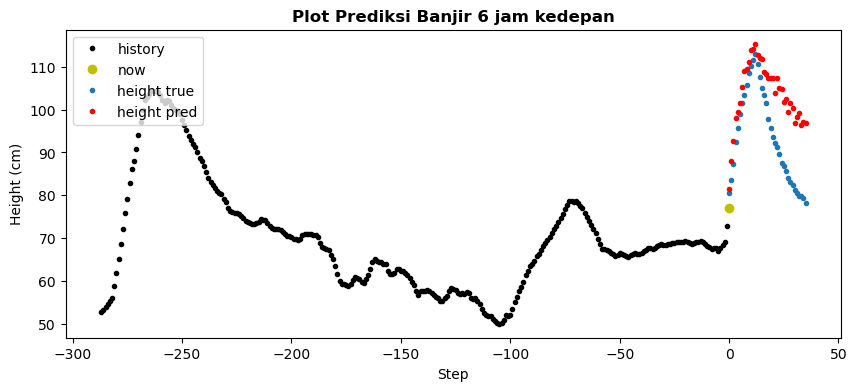

In [17]:
#date_now 
date_now = '2022-09-20 17:50:00'

# klasifikasi
X_klasifikasi=get_X_klasifikasi(data=data_simulasi, 
                                date=date_now)
y_klasifikasi=klasifikasi_banjir(X=X_klasifikasi,
                                 scaler_X=scaler_X_klasifikasi,
                                 model=model_klasifikasi_banjir)

# prediksi
X_prediksi=get_X_prediksi(data=data_simulasi, 
                          date=date_now)
y_pred=prediksi_banjir(data=data_simulasi,
                       date=date_now,
                       X=X_prediksi,
                       scaler_X=scaler_X_prediksi,
                       scaler_y=scaler_y_prediksi,
                       model=model_prediksi_banjir)
pred_status=klasifikasi_banjir(X=y_pred,
                               scaler_X=scaler_X_klasifikasi,
                               model=model_klasifikasi_banjir)
get_info(y_klasifikasi=y_klasifikasi,
         X=X_prediksi,
         y_pred_status=pred_status)

## Siaga 2 (BAHAYA)

-----------------------------------------------------------------------------
Datetime            : 2022-09-27 18:30:00
Ketinggian sekarang : 103.26 cm
Status sekarang     : SIAGA 1

Info : [BAHAYA] Dalam 40 menit kedepan diperkirakan akan berstatus SIAGA 2.
        Berkemungkinan terjadi banjir, segera lakukan evakuasi.
-----------------------------------------------------------------------------


'Plot Prediksi :'

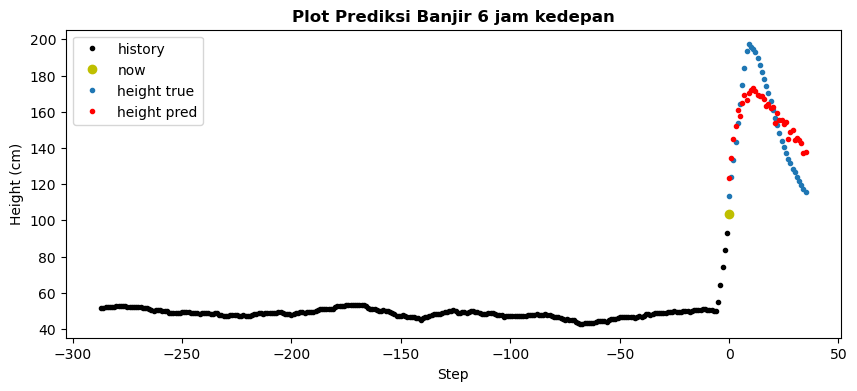

In [18]:
#date_now = input('date: ') 
date_now = '2022-09-27 18:30:00'

# klasifikasi
X_klasifikasi=get_X_klasifikasi(data=data_simulasi, 
                                date=date_now)
y_klasifikasi=klasifikasi_banjir(X=X_klasifikasi,
                                 scaler_X=scaler_X_klasifikasi,
                                 model=model_klasifikasi_banjir)

# prediksi
X_prediksi=get_X_prediksi(data=data_simulasi, 
                          date=date_now)
y_pred=prediksi_banjir(data=data_simulasi,
                       date=date_now,
                       X=X_prediksi,
                       scaler_X=scaler_X_prediksi,
                       scaler_y=scaler_y_prediksi,
                       model=model_prediksi_banjir)
pred_status=klasifikasi_banjir(X=y_pred,
                               scaler_X=scaler_X_klasifikasi,
                               model=model_klasifikasi_banjir)
get_info(y_klasifikasi=y_klasifikasi,
         X=X_prediksi,
         y_pred_status=pred_status)

---

## ...

In [26]:
# # read data and format date
# data_simulasi = pd.read_csv('dataset/data_simulasi_banjir_sorted.csv')
# data_simulasi['date'] = data_simulasi['date'] + ':00'
# data_simulasi['date'] = pd.to_datetime(data_simulasi['date'], format='%d/%m/%Y %H:%M:%S')
# data_simulasi.info()

In [27]:
# import pickle

# # Menyimpan objek menggunakan pickle
# with open("data_simulasi_banjir.pkl", 'wb') as file:
#     pickle.dump(data_simulasi, file)

In [28]:
# # Membuka file menggunakan pickle
# with open("data_simulasi_banjir.pkl", 'rb') as file:
#     loaded_data = pickle.load(file)